# Final Project
# Quarterly Conference Call Transcripts
**David Fuentes (dmf4ns)**

**DS 5001**

**University Of Virginia**
______

## Section 1: Transcript Collection

**Purpose:** This section contains the code used to pull the raw transcripts from *Motley Fool*'s conference-call transcript service.

***Note that this section will scrape Motley Fool's site if you run it. Depending on your Chrome settings and whether you have ChromeDriver, this may not run. Regardless, the code needs to be altered to reference ChromeDriver's location on your computer.***

**Data output from this section flows into Section 2 and will be included with submitted files.**

In [1]:
# import packages

from bs4 import BeautifulSoup, SoupStrainer
from urllib.request import Request, urlopen
import pandas as pd
import time
import io
from selenium import webdriver
from ftfy import fix_encoding

**Set up list of companies whose data the program will scrape:**

**Note:** *Motley Fool* times out after scraping about 7 companies. Waiting some time before scraping again works well. Each company has about 2 years' worth of transcripts on the *MF* site.

In [2]:
companies = ['PH',	'SLB',	'GIS',	'RMD',	'XEL',	'MSI',	'SBAC'] # list of companies to scrape

I used S&P companies for this analysis. This markdown cell contains the remaining companies along with those I scraped for my own purposes (so I could copy and paste into the companies list each time I ran). 

**Remaining Companies:** 'AON','ROP',	'JCI',	'BIIB',	'NEM',	'FCX',	'KMB',	'PSA',	'IQV',	'MSCI',	'KLAC',	'TT',	'A',	'TROW',	'LHX',	'EBAY',	'EXC',	'DLR',	'TEL',	'CMG',	'DOW',	'ALGN',	'GD',	'AEP',	'INFO',	'MET',	'DXCM',	'SNPS',	'ORLY',	'CNC',	'ROST',	'EOG',	'SRE',	'EA',	'BAX',	'APH',	'APTV',	'ALXN',	'CARR',	'PPG',	'DD',	'AIG',	'ALL',	'SPG',	'CDNS',	'BK',	'TRV',	'PRU',	'STZ',	'PH',	'SLB',	'GIS',	'RMD',	'XEL',	'MSI',	'SBAC',	'MCHP',	'SYY',	'DFS',	'CTSH',	'WELL',	'PAYX',	'IFF',	'MAR',	'FTNT',	'CMI',	'AZO',	'OTIS',	'MNST',	'YUM',	'ROK',	'MTD',	'KMI',	'CTAS',	'TDG',	'HPQ',	'MPC',	'AFL',	'FRC',	'WBA',	'HLT',	'SWK',	'ADM',	'XLNX',	'PXD',	'KR',	'ZBH',	'AVB',	'SWKS',	'PSX',	'FAST',	'AME',	'CTVA',	'PEG',	'AWK',	'EFX',	'GLW',	'PCAR',	'WMB',	'VRSK',	'MCK',	'WEC',	'ANSS',	'ES'

**Finished**:
'AAPL', 'MSFT', 'AMZN', 'FB', 'GOOGL', 'GOOG', 'BRK.B', 'TSLA', 'NVDA', 'JPM', 'JNJ', 'V', 'UNH',
'PYPL', 'HD', 'PG', 'DIS', 'MA', 'BAC', 'ADBE', 'CMCSA', 'XOM', 'NFLX', 'VZ', 'INTC', 'CRM', 'CSCO',
'PFE', 'KO', 'ABT', 'ABBV', 'PEP', 'NKE', 'T', 'TMO', 'CVX', 'ACN', 'AVGO',
'MRK', 'WMT', 'LLY','WFC', 'COST', 'TXN', 'DHR', 'MCD', 'MDT', 'QCOM','EPZM','ORCL','HON','UPS','PM','LIN','BMY','NEE','UNP','C','AMGN','SBUX','LOW','INTU','MS','BA', 'RTX','BLK','GS','AMT','IBM','AMAT','TGT','CAT',
'MMM','GE','ISRG','AXP','NOW','DE','AMD','CVS', 'SCHW','CHTR','SPGI','ANTM','ZTS','PLD','LMT', 'BKNG','FIS','LRCX','SCHW','CHTR','SPGI','ANTM','ZTS', 'PLD','LMT','BKNG','FIS','LRCX','MU','MDLZ','MO', 'CCI','ADP','SYK','TMUS','GILD','TJX','PNC','COP','CI','USB','DUK','CME','GM','TFC','COF','EL', 'EQIX','CB','FDX','CSX','BDX','MMC','ATVI', 'ILMN','CL','ICE','EW', 'SHW','NSC','ITW','SO','FISV','APD','ADSK','ADI','ETN','BSX', 'D','REGN','MCO','EMR','HUM','PGR', 'HCA','F','NXPI','IDXX','GPN','TWTR', 'HCA','F','NXPI','IDXX','GPN','TWTR','WM', 'NOC','FCX','ECL','AON','BIIB','DG','VRTX', 'AON','ROP','JCI','BIIB','NEM','FCX','KMB', 'PSA','IQV','MSCI','KLAC','TT','A','TROW','LHX','EBAY','EXC','DLR','TEL','CMG','DOW','ALGN','GD','AEP','INFO','MET','DXCM','SNPS', 'ORLY','CNC','ROST','EOG','SRE','EA','BAX','ALL',	'SPG',	'CDNS',	'BK','TRV',	'PRU',	'STZ',  'APH','APTV','ALXN','CARR','PPG','DD','AIG', 'AON','ROP','JCI','BIIB','NEM','FCX','KMB'

-----
#### **Scraper 1**: Get Transcript URLs For Each Company

Open each URL from *Motley Fool* for each ticker in the *companies* list; this opens the company's dashboard page. The transcript links within the main page for each company contains *call-transcript*, so I use Beautiful Soup to save down any link on the page containing that sub-string (with a list comprehension). I append all the transcript URLs for each company to the same list.

In [3]:
%time
options = webdriver.ChromeOptions()
options.add_argument('--headless') # Option so that selenium doesn't open a new Chrome window with each pull and just works in the background

t_0 = time.time() # will use to time the process later

# input headers in a dict to bypass issue loading transcript site

hd = {'User-Agent': 'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.11 (KHTML, like Gecko) \
        Chrome/23.0.1271.64 Safari/537.11 \
        Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) \
        Chrome/39.0.2171.95 Safari/537.36',
       'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8',
       'Accept-Charset': 'ISO-8859-1,utf-8;q=0.7,*;q=0.3',
       'Accept-Encoding': 'none',
       'Accept-Language': 'en-US,en;q=0.8',
       'Connection': 'keep-alive'}

# URL base, from which we pull the set of links 

links = [] # empty list to which we will append the links to the transcripts

for i in companies:
    loop_time = time.time()
    root = 'https://www.fool.com/quote/'+str(i) # the pattern for the main company dashboard
    
    time.sleep(6) # I was trying to use this so MF wouldn't time out, but didn't quite work
    
    # send request to site with headers to bypass Forbidden issue
    req = Request(root, headers = hd)

    # read site
    
    html_page = urlopen(req).read()

    # create HTML "soup" from which we will pull our information

    soup = BeautifulSoup(html_page, "lxml")

    # initiate web driver for Chrome

    import os 

    driver = webdriver.Chrome(executable_path=r'/opt/homebrew/bin/chromedriver', options=options)

    #driver = webdriver.Chrome(options=options)#, executable_path = '/Users/dfuent/Desktop/chromedriver.exe')

    driver.get(root)

    for link in soup.findAll('a'): # locate all links
        links.append(str(link.get('href'))) # append the link to the link list

    # we only want the data if the link contains 'call-transcript', which is the convention used by the CPD
    t = [i for i in links if 'call-transcript' in i] # list comp to get transcript links
    t = list(set(t)) # using set removes any duplicates (just in case)
    links.append(t)
    driver.quit() # close the Chrome driver
    print('Loop {0} took {1: .2f} seconds.'.format(i, time.time()-loop_time))

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 1.91 µs
Loop PH took  11.68 seconds.
Loop SLB took  22.53 seconds.
Loop GIS took  19.41 seconds.
Loop RMD took  18.86 seconds.
Loop XEL took  18.27 seconds.
Loop MSI took  11.99 seconds.
Loop SBAC took  12.00 seconds.


-----
#### **Scraper 2**: Collect Transcript Data From URLs

The first scraper created a list of transcript links for the companies in the *companies* list. We can now open each transcript and pull the raw transcript data. 

In [4]:
fin_list = [] # empty list to which we will input the transcript strings

df = pd.DataFrame(columns = ['url', 'transcript_raw']) # create a blank DF to contain transcripts

print('There are {0} transcripts to scrape.'.format(len(t)))

n = 0 
for i in t: # iterate through our list of links

    loop_time = time.time()
    
    n += 1
    
    print('{0} of {1} total transcripts.'.format(n, len(t)))

    url = 'https://www.fool.com' + str(i) # create the transcript URL

    #print(url) # for testing

    #Option so that selenium doesn't open a new Chrome window during each loop
    options = webdriver.ChromeOptions()
    options.add_argument('--headless')

    #initiate web driver
    driver = webdriver.Chrome(executable_path=r'/opt/homebrew/bin/chromedriver', options=options)

    #use driver to open url
    driver.get(url)

    #wait three seconds to load page, just in casse
    time.sleep(3)

    #extract page HTML and parse with BeautifulSoup
    html=driver.page_source
    soup=BeautifulSoup(html,'html.parser')

    # transcript name and date are tagged with the taggings below, so we pull those data
    h = soup('<span class="article-content">')
    h = str(h)[1:-1].replace('<span class="article-content">', '').replace('</span', '') # replace the taggings so the data are clean
    #print(h) # print the transcript for testing

    tr = str(soup('p')) # pull each block (basically paragraphs and transitions between speakers) of the transcript parsed above
    spl_tr = tr.split('</p>') # split the transcript into each speaker's block of text
    
    temp = pd.DataFrame([[url, spl_tr]], columns = ['url', 'transcript_raw']) # send to a temp DF
    
    # I want to stack the transcript into a few rows by the paragraph rather than just one long string
    s = temp.apply(lambda x: pd.Series(x['transcript_raw']),axis=1).stack().reset_index(level=1, drop=True)
    s.name = 'transcript'
    temp = temp.join(s)
    
    # add the data from the temp DF to the full DF
    df = df.append(temp).drop('transcript_raw', axis=1)
    #df.to_csv('df_rawComp_vTEST.csv') # send transcripts to a CSV for the list of companies. this is commented out because I am done saving transcripts
    
    driver.quit()
    print('{0} took {1: .2f} seconds.'.format(url, time.time()-loop_time))

There are 70 transcripts to scrape.
1 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2020/10/16/schlumberger-limited-slb-q3-2020-earnings-call-tra/ took  7.99 seconds.
2 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2020/07/24/schlumberger-limited-slb-q2-2020-earnings-call-tra.aspx took  7.81 seconds.
3 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2021/01/22/schlumberger-limited-slb-q4-2020-earnings-call-tra/ took  12.41 seconds.
4 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2021/07/29/xcel-energy-inc-xel-q2-2021-earnings-call-transcri/ took  14.92 seconds.
5 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2019/08/01/xcel-energy-inc-xel-q2-2019-earnings-call-transcri.aspx took  14.86 seconds.
6 of 70 total transcripts.
https://www.fool.com/earnings/call-transcripts/2020/12/17/general-mills-inc-gis-q2-2021-earnings-call-transc/ took  14.71 seconds.
7 of 70 to

____________
**This process was run about 30 times to pull sufficient transcript data. I am sure I can figure out a more practical way to get around the time-out errors from *Motley Fool* (or I could have automated a batch run every few hours for a new set of companies), but I simply ran this file whenever I remembered to over a week or so, and it wasn't a problem.**


## **Section 2: Raw Transcript Transform**
________

**Purpose:** This section contains the code used to transform the raw transcript data pulled from *Motley Fool*

In [42]:
import pandas as pd
import os
import glob

import warnings
warnings.filterwarnings('ignore') # I know the code works, but I get certain deprecation warnings and warning when my models timeout

In [43]:
os.chdir('/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data') # I needed to change my directory at one pointto pickup the correct files

In [44]:
dir = os.getcwd()

**Get file names with raw transcript data.**

In [45]:
f = glob.glob(dir + '/raw_data_files/df_rawComp_v*.csv') # all transcript files contain this name pattern

In [46]:
f # list of files

['/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v8.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v9.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v25.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v19.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v18.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v24.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v30.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v26.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_data/raw_data_files/df_rawComp_v27.csv',
 '/Users/dfuent/Desktop/Desktop - David’s MacBook Pro/UVA/proj_dat

_____
#### **Create a data frame containing all of the raw transcript data:**

In [47]:
raw_df = pd.DataFrame()
for i in f:
    tmp = pd.read_csv(i)
    tmp['file'] = i
    raw_df = raw_df.append(tmp)
raw_df.drop('Unnamed: 0', axis = 1, inplace = True)

In [48]:
sp_map = pd.read_csv('sp_mapping.csv') # contains S&P info I use to map to the data

In [49]:
sp_map = sp_map.rename(columns = {'Symbol':'ticker', 'GICS Sector':'sector', 'GICS Sub-Industry':'sub_sector'}).set_index('ticker')

**View the raw data and save as F0:**

In [50]:
raw_df

,url,transcript,file
0,https://www.fool.com/earnings/call-transcripts...,"[<p align=""center""><small><em>Returns as of 7/...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
1,https://www.fool.com/earnings/call-transcripts...,", <p align=""center""><small><em>Returns as of 7...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
2,https://www.fool.com/earnings/call-transcripts...,", <p>Founded in 1993 by brothers Tom and David...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
3,https://www.fool.com/earnings/call-transcripts...,", <p class=""caption"">Image source: The Motley ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
4,https://www.fool.com/earnings/call-transcripts...,", <p><strong>American Tower Corp</strong> <sp...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
...,...,...,...
15995,https://www.fool.com/earnings/call-transcripts...,", <p class=""launch-disclaimer"" data-uw-rm-sr=""...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15996,https://www.fool.com/earnings/call-transcripts...,", <p class=""launch-info"">Stock Advisor launche...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15997,https://www.fool.com/earnings/call-transcripts...,", <p class=""copyright"" id=""footer-copyright-te...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15998,https://www.fool.com/earnings/call-transcripts...,", <p>\n Market data powered b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...


In [51]:
raw_df.to_csv('F0_rawAll.csv') # used for testing

_________
#### Begin transcript cleaning:

##### Boilerplate Removal

**The transcripts contain many of the same lines for things like advertisements and other boilerplate items. I want to get ride of these.**

In [52]:
raw_df.groupby('transcript').count().sort_values('file', ascending = False).head(25) # see top 25 most common lines

,url,file
transcript,,
", <p><strong>Operator</strong>",27380,27380
", <p>",5762,5762
", <p>Thank you.",3756,3756
],2117,2117
", <p class=""launch-disclaimer"" data-uw-rm-sr="""">Discounted offers are only available to new members. Stock Advisor will renew at the then current list price. Stock Advisor list price is $199 per year.",2117,2117
", <p>Founded in 1993 by brothers Tom and David Gardner, The Motley Fool helps millions of people attain financial freedom through our website, podcasts, books, newspaper column, radio show, and premium investing services.",2117,2117
", <p class=""copyright"" id=""footer-copyright-text"">© 1995 - 2021 The Motley Fool. All rights reserved.<br data-uw-rm-sr="""" role=""presentation""/>",2117,2117
", <p><em><span style=""color: #767676; font-size: 8pt;"">*Stock Advisor returns as of June 7, 2021</span></em>",2115,2115
", <p class=""caption"">Image source: The Motley Fool.",2101,2101


In [53]:
check = raw_df.groupby('transcript').count().sort_values('file', ascending = False)

**As an example, check some of the lines that contain *Motley Fool*, which I know should not be mentioned in any transcripts.**

In [54]:
check[check.index.str.contains('Motley Fool')]

,url,file
transcript,,
", <p>Founded in 1993 by brothers Tom and David Gardner, The Motley Fool helps millions of people attain financial freedom through our website, podcasts, books, newspaper column, radio show, and premium investing services.",2117,2117
", <p class=""copyright"" id=""footer-copyright-text"">© 1995 - 2021 The Motley Fool. All rights reserved.<br data-uw-rm-sr="""" role=""presentation""/>",2117,2117
", <p class=""caption"">Image source: The Motley Fool.",2101,2101
", <p><em>This article is a transcript of this conference call produced for The Motley Fool. While we strive for our Foolish Best, there may be errors, omissions, or inaccuracies in this transcript. As with all our articles, The Motley Fool does not assume any responsibility for your use of this content, and we strongly encourage you to do your own research, including listening to the call yourself and reading the company's SEC filings. Please see our </em><a data-uw-rm-brl=""false"" href=""https://www.fool.com/legal/terms-and-conditions/fool-rules""><em>Terms and Conditions</em></a><em> for additional details, including our Obligatory Capitalized Disclaimers of Liability.</em>",2035,2035
", <p><i><a data-uw-rm-brl=""false"" href=""http://boards.fool.com/profile/MFTranscribers/info.aspx"">Motley Fool Transcribers</a> has no position in any of the stocks mentioned. The Motley Fool has no position in any of the stocks mentioned. The Motley Fool has a <a data-uw-rm-brl=""false"" href=""http://www.fool.com/Legal/fool-disclosure-policy.aspx"">disclosure policy</a>.</i>",622,622
...,...,...
", <p><em><a data-uw-rm-brl=""false"" href=""http://boards.fool.com/profile/MFTranscribers/info.aspx"">Motley Fool Transcribers</a> has no position in any of the stocks mentioned. The Motley Fool owns shares of Texas Instruments. The Motley Fool has a <a data-uw-rm-brl=""false"" href=""http://www.fool.com/Legal/fool-disclosure-policy.aspx"">disclosure policy</a>.</em>",1,1
", <p><em><a data-uw-rm-brl=""false"" href=""http://boards.fool.com/profile/MFTranscribers/info.aspx"">Motley Fool Transcribers</a> has no position in any of the stocks mentioned. The Motley Fool owns shares of and recommends Accenture. The Motley Fool has a <a data-uw-rm-brl=""false"" href=""http://www.fool.com/Legal/fool-disclosure-policy.aspx"">disclosure policy</a>.</em>",1,1
", <p><em><a data-uw-rm-brl=""false"" href=""http://boards.fool.com/profile/MFTranscribers/info.aspx"">Motley Fool Transcribers</a> has no position in any of the stocks mentioned. The Motley Fool owns shares of and recommends Adobe Systems. The Motley Fool has a <a data-uw-rm-brl=""false"" href=""http://www.fool.com/Legal/fool-disclosure-policy.aspx"">disclosure policy</a>.</em>",1,1


**Create a list of these common transcript lines we want to remove.**

In [55]:
top_remarks = list(raw_df.groupby('transcript').count().sort_values('file', ascending = False).head(30).index)

In [56]:
top_remarks = [i for i in top_remarks if ('OPERATOR' not in i.upper()) 
 & ('--' not in i) & ('GOOD MORNING' not in i.upper())
 & ('THANK YOU' not in i.upper())]

**Remove lines that likely aren't transcript data:**

In [57]:
raw_df = raw_df[~raw_df.transcript.isin(top_remarks)]

In [58]:
raw_df

,url,transcript,file
4,https://www.fool.com/earnings/call-transcripts...,", <p><strong>American Tower Corp</strong> <sp...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
5,https://www.fool.com/earnings/call-transcripts...,", <p><strong>Operator</strong>",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
6,https://www.fool.com/earnings/call-transcripts...,", <p>Ladies and gentlemen, thank you for stand...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
7,https://www.fool.com/earnings/call-transcripts...,", <p><strong>Igor Khislavsky</strong> -- <em>V...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
8,https://www.fool.com/earnings/call-transcripts...,", <p>Thanks, Kevin. Good morning and thank you...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
...,...,...,...
15988,https://www.fool.com/earnings/call-transcripts...,", <p>They just revealed what they believe are ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15989,https://www.fool.com/earnings/call-transcripts...,", <p><a class=""ticker_pitch"" data-uw-rm-brl=""f...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15994,https://www.fool.com/earnings/call-transcripts...,", <p><i data-uw-rm-sr="""">Teresa Kersten, an em...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15996,https://www.fool.com/earnings/call-transcripts...,", <p class=""launch-info"">Stock Advisor launche...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...


In [59]:
#raw_df = raw_df[~raw_df.index.isin(top_remarks)]

In [60]:
df = raw_df[(~raw_df['transcript'].str.contains('Motley Fool')) 
                & ~raw_df['transcript'].str.contains('AlphaStreet')
               & ~raw_df['transcript'].str.contains('Stock Advisor launched')
           & ~raw_df['transcript'].str.contains('Returns as of 7/(.+)/2021')]

In [61]:
df

,url,transcript,file
4,https://www.fool.com/earnings/call-transcripts...,", <p><strong>American Tower Corp</strong> <sp...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
5,https://www.fool.com/earnings/call-transcripts...,", <p><strong>Operator</strong>",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
6,https://www.fool.com/earnings/call-transcripts...,", <p>Ladies and gentlemen, thank you for stand...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
7,https://www.fool.com/earnings/call-transcripts...,", <p><strong>Igor Khislavsky</strong> -- <em>V...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
8,https://www.fool.com/earnings/call-transcripts...,", <p>Thanks, Kevin. Good morning and thank you...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,", <p><strong>Philip Winslow</strong> -- <em>We...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15984,https://www.fool.com/earnings/call-transcripts...,", <p><a data-uw-rm-brl=""false"" href=""https://w...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15988,https://www.fool.com/earnings/call-transcripts...,", <p>They just revealed what they believe are ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...
15989,https://www.fool.com/earnings/call-transcripts...,", <p><a class=""ticker_pitch"" data-uw-rm-brl=""f...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...


In [62]:
df.groupby('transcript').count().sort_values('url', ascending = False).head(50)

,url,file
transcript,,
", <p><strong>Operator</strong>",27380,27380
", <p>Thank you.",3756,3756
", <p>Good morning.",1048,1048
", <p>[Operator Closing Remarks]",996,996
", <p><strong>Richard C. Adkerson</strong> -- <em data-uw-rm-mod="""">Vice Chairman, President and Chief Executive Officer</em>",798,798
", <p><strong>Greg Case</strong> -- <em>Chief Executive Officer</em>",489,489
", <p><strong>Kathleen L. Quirk</strong> -- <em>Executive Vice President and Chief Financial Officer</em>",485,485
", <p>Great. Thank you.",476,476
", <p><strong>David N. Farr</strong> -- <em data-uw-rm-mod="""">Chairman and Chief Executive Officer</em>",421,421


**We now have a decently clean set of transcripts without the boilerplate/common lines that we aren't interested in. I will continue to clean these data, but this was a good first pass.**
_____

##### HTML Cleanup

In [63]:
import re

def cleanhtml(raw_html):
    cleanr = re.compile('<.*?>') # get anything between < >
    cleantext = re.sub(cleanr, '', raw_html)
    return cleantext

**Identify lines containing a speaker name.**

In [64]:
pos_names = df.transcript[df.transcript.str.contains('--') & df.transcript.str.contains('em')].apply(lambda x: cleanhtml(x).strip())\
.apply(lambda x: re.sub(r'^[\[\,]', '', x).strip())

In [65]:
speaker_names = [i for i in list(pos_names) if len(i.split())<=15] # should mostly be lines containing a speaker

In [66]:
#speaker_names

**Clean up HTML tags and produce clean transcript data:**

In [67]:
df['transcript'] = df['transcript'].apply(lambda x: cleanhtml(x).strip())\
.apply(lambda x: re.sub(r'^[\[\,]', '', x).strip())

____
##### Create Columns for Data

**I now have some cleansed transcript data. I want to start adding some helpful columns to my table:**

**Add an identifier in the table labeling where the transcript data changes from one company to another.**

In [68]:
import numpy as np

In [69]:
df['co_id'] = 0 # should really be named 'Call ID'

In [70]:
# identify the lines in the DF where the URL changes (if it changes, I know it's a new quarterly call)
# add one to prior row's value. Now there is an integer ID for each conference call
for i in range(0, len(df)):
    if i == 0:
        df['co_id'].iloc[i] = 0
    elif df['url'].iloc[i] != df['url'].iloc[i-1]:
        df['co_id'].iloc[i] = df['co_id'].iloc[i-1] + 1
    else:
        df['co_id'].iloc[i] = df['co_id'].iloc[i-1]
    #print('worked')

**Add an iterator to identify each line in each of the transcripts. Mostly the lines represent changes in paragraphs. I later add a column identifying speaker handoff as well.**

In [71]:
df['co_count'] = 0

In [72]:
for i in range(0, len(df)):
    if i == 0:
        df['co_count'].iloc[i] = 0
    elif df['co_id'].iloc[i] == df['co_id'].iloc[i-1]:
        df['co_count'].iloc[i] = df['co_count'].iloc[i-1] + 1
    else:
        df['co_count'].iloc[i] = 0
    #print('worked')

In [73]:
df # see current DF

,url,transcript,file,co_id,co_count
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4
...,...,...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197
15989,https://www.fool.com/earnings/call-transcripts...,See the 10 stocks,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,198


In [74]:
#df[df['co_count']==0].to_csv('companies.csv') # save DF to CSV

**Add company name to the DF**

In [75]:
df['co_name'] = ''

In [76]:
df['co_name'] = np.where(df['co_count'] == 0, df['transcript'].str.split('(').tolist(), np.nan) # pattern to get company name

In [77]:
co_map = df.co_name[df.co_count == 0].apply(lambda x: x[0].strip())

In [78]:
df[df['co_count'] == 0]

,url,transcript,file,co_id,co_count,co_name
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,"[American Tower Corp , NYSE:AMT)Q1 2019 Earni..."
237,https://www.fool.com/earnings/call-transcripts...,United Technologies Corp (NYSE:RTX)Q4 2018 Ea...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,1,0,"[United Technologies Corp , NYSE:RTX)Q4 2018 ..."
531,https://www.fool.com/earnings/call-transcripts...,"IBM (NYSE:IBM)Q3 2020 Earnings CallOct 19, 202...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2,0,"[IBM , NYSE:IBM)Q3 2020 Earnings CallOct 19, 2..."
762,https://www.fool.com/earnings/call-transcripts...,"IBM (NYSE:IBM)Q1 2021 Earnings CallApr 19, 202...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,3,0,"[IBM , NYSE:IBM)Q1 2021 Earnings CallApr 19, 2..."
1005,https://www.fool.com/earnings/call-transcripts...,"IBM (NYSE:IBM)Q2 2020 Earnings CallJul 20, 202...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,4,0,"[IBM , NYSE:IBM)Q2 2020 Earnings CallJul 20, 2..."
...,...,...,...,...,...,...
14882,https://www.fool.com/earnings/call-transcripts...,Facebook Inc (NASDAQ:FB)Q1 2020 Earnings CallA...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2112,0,"[Facebook Inc , NASDAQ:FB)Q1 2020 Earnings Cal..."
15061,https://www.fool.com/earnings/call-transcripts...,"Tesla, Inc. (NASDAQ:TSLA)Q3 2019 Earnings Call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2113,0,"[Tesla, Inc. , NASDAQ:TSLA)Q3 2019 Earnings Ca..."
15384,https://www.fool.com/earnings/call-transcripts...,NVIDIA Corp (NASDAQ:NVDA)Q2 2020 Earnings Call...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,0,"[NVIDIA Corp , NASDAQ:NVDA)Q2 2020 Earnings Ca..."
15557,https://www.fool.com/earnings/call-transcripts...,Apple (NASDAQ:AAPL)Q4 2020 Earnings CallOct 29...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2115,0,"[Apple , NASDAQ:AAPL)Q4 2020 Earnings CallOct ..."


In [80]:
df['co_name'] = np.where(df['co_count'] == 0, df['co_name'].apply(lambda x: x[0] if type(x) == list else x), np.nan)

In [82]:
df['co_name'] = df['co_name'].ffill()

In [83]:
df

,url,transcript,file,co_id,co_count,co_name
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp
...,...,...,...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp
15989,https://www.fool.com/earnings/call-transcripts...,See the 10 stocks,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,198,Microsoft Corp


**I now have the company name. Get ticker from URL as well.**

In [84]:
df['ticker_full'] = ''

In [85]:
df['ticker_full'] = np.where(df['co_count'] == 0, df['transcript'].str.findall('\((.*)\)'), np.nan)

In [86]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,[NYSE:AMT]
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NaN
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NaN
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NaN
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NaN
...,...,...,...,...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NaN
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NaN
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NaN
15989,https://www.fool.com/earnings/call-transcripts...,See the 10 stocks,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,198,Microsoft Corp,NaN


In [88]:
df['ticker_full'] = np.where(df['co_count'] == 0, df['ticker_full'].apply(lambda x: x[0] if type(x) == list and len(x) > 0 else x), np.nan)

In [90]:
df[df.ticker_full.str.len() == 0]

,url,transcript,file,co_id,co_count,co_name,ticker_full
7917,https://www.fool.com/earnings/call-transcripts...,NVIDIA Corporation (NASDAQ: NVDAQ3 2019 Earnin...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2079,0,NVIDIA Corporation,[]


In [91]:
df['ticker_full'] = np.where(df.ticker_full.str.len() == 0, 'NASDAQ:NVDA', df['ticker_full'])

In [92]:
df[df.ticker_full.str.len() == 0]

,url,transcript,file,co_id,co_count,co_name,ticker_full


In [93]:
df.groupby('ticker_full').count()

,url,transcript,file,co_id,co_count,co_name
ticker_full,,,,,,
?????? : MSI,1,1,1,1,1,1
?????? : SO,1,1,1,1,1,1
NASDAQ:AAPL,10,10,10,10,10,10
NASDAQ:ADBE,7,7,7,7,7,7
NASDAQ:ADI,10,10,10,10,10,10
...,...,...,...,...,...,...
NYSE:WMT,4,4,4,4,4,4
NYSE:XOM,10,10,10,10,10,10
NYSE:ZTS,20,20,20,20,20,20


In [94]:
df['ticker_full'] = df['ticker_full'].ffill() # forward fill the tickers

In [95]:
df['ticker_full'] = np.where(df['ticker_full'].str.contains('GOOG'), 'NASDAQ:GOOGL', df['ticker_full'])

In [96]:
df['ticker'] = df['ticker_full'].apply(lambda x: x.split(':')[1])

**Tickers are in with some of the odd cases fixed. Now add the date of the calls:**

In [97]:
df['date'] = df['url'].str.split('call-transcripts/').map(lambda r: r[1]).str.split('/')\
.map(lambda r: r[:3]).map(lambda r: '-'.join(r))

In [98]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03
...,...,...,...,...,...,...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15989,https://www.fool.com/earnings/call-transcripts...,See the 10 stocks,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,198,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30


In [99]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03
...,...,...,...,...,...,...,...,...,...
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30
15989,https://www.fool.com/earnings/call-transcripts...,See the 10 stocks,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,198,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30


In [101]:
df['quarter'] = ''

In [102]:
def q(x):
    try:
        return df.where(df['co_count'] == 0, df['transcript'].str.split(')')[1].str.split('Call')[0].str.strip())
    except:
        #try:
        return df.where(df['co_count'] == 0, df['transcript'].str.split(df['ticker'])[1].str.split('Call')[0].str.strip().str.replace(' Earnings Conference', ''))
        #except:
        #    return np.nan

In [104]:
df.quarter.drop_duplicates()

4    
Name: quarter, dtype: object

In [105]:
df['quarter'] = df['url'].str.extract(r'([q]\d-\d{4})')#.str.split('-')\

In [106]:
df['quarter'] = df['quarter'].ffill()

**Extra ad cleaning:**

In [107]:
ad_list = ['10 stocks we like better than', 'They just revealed what they believe are the ten best stocks', 'See the 10 stocks', 
           '\*Stock Advisor returns as of']

In [108]:
df = df[~df.transcript.isin(ad_list)]

In [109]:
df = df[df['transcript'] != '']

In [110]:
for i in range(0, len(df)):
    if i == 0:
        df['co_count'].iloc[i] = 0
    elif df['co_id'].iloc[i] == df['co_id'].iloc[i-1]:
        df['co_count'].iloc[i] = df['co_count'].iloc[i-1] + 1
    else:
        df['co_count'].iloc[i] = 0

**I had a speaker map in which I looked through the auto-generated speaker list to make sure nothing looked too off. I cleaned in Excel on the side, so now I am updating. If the transcript line is entirely a speaker name, then I know the transcript changed speakers, so I will changed the name in the *speaker_full* column.**

In [111]:
df['speaker_full'] = df['transcript'].where(df['transcript'].isin(speaker_names), np.nan)

In [112]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re..."
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
...,...,...,...,...,...,...,...,...,...,...,...
15982,https://www.fool.com/earnings/call-transcripts...,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,194,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,"Brad Reback -- Stifel, Nicolaus &amp; Company ..."
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,NaN
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,NaN


In [113]:
df['speaker_full'] = df['speaker_full'].ffill() # fill NaNs in the speaker column

In [114]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,NaN
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re..."
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re..."
...,...,...,...,...,...,...,...,...,...,...,...
15982,https://www.fool.com/earnings/call-transcripts...,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,194,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,"Brad Reback -- Stifel, Nicolaus &amp; Company ..."
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...


**Clean up speaker full so there is just a speaker column as well:**

In [115]:
df['speaker'] = df['speaker_full']

In [116]:
df['speaker'] = np.where(df['co_count'] == 0, 'Call Title', df['speaker'])

In [117]:
df['speaker'] = np.where(df['transcript'] == 'Operator', 'Operator', df['speaker'])

In [118]:
df['speaker'] = df['speaker'].ffill()

In [119]:
df['speaker'] = df['speaker'].fillna('')

In [120]:
df['speaker_full'] = df['speaker']

In [121]:
df['speaker'] = df['speaker'].str.split('--').tolist()

In [122]:
df['speaker'] = df['speaker'].apply(lambda x: x[0].strip())

In [123]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Call Title,Call Title
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky
...,...,...,...,...,...,...,...,...,...,...,...,...
15982,https://www.fool.com/earnings/call-transcripts...,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,194,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",Brad Reback
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow


In [124]:
df.groupby('speaker').count()

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full
speaker,,,,,,,,,,,
(Multiple speakers) Fund management,2,2,2,2,2,2,2,2,2,2,2
A J Rice,2,2,2,2,2,2,2,2,2,2,2
A brand new one. We bought 150 of them. In the last 12 years,2,2,2,2,2,2,2,2,2,2,2
A. J. Rice,14,14,14,14,14,14,14,14,14,14,14
A. William Stein,95,95,95,95,95,95,95,95,95,95,95
...,...,...,...,...,...,...,...,...,...,...,...
Zack Moxcey,222,222,222,222,222,222,222,222,222,222,222
Zack Sopcak,6,6,6,6,6,6,6,6,6,6,6
Zane Chrane,33,33,33,33,33,33,33,33,33,33,33


In [125]:
df[df.quarter == 'check'] # originally had some issues pulling the quarter from the transcript before I figured out the patters

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker


In [126]:
df.quarter = np.where(df.quarter == 'check', 'Q3 2019', df.quarter) # this is no longer necessary

In [127]:
goog = df[df['quarter'].str.contains('GOOGL')].groupby('url').count().index.tolist()

In [128]:
qs = ['Q'+i.split('-q')[1].split('-earnings')[0].replace('-', ' ') for i in goog]

In [129]:
# I had some issues with some of the Google ticker formatting that I needed to fix. 
goog_map = {}
k = 0
for i in goog:
    goog_map.update({i:qs[k]})
    k += 1

In [130]:
goog_map

{}

In [131]:
df['quarter'] = np.where(df['url'].isin(goog), df['url'].map(goog_map), df['quarter'])

In [132]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker
4,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Call Title,Call Title
5,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator
6,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator
7,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky
8,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky
...,...,...,...,...,...,...,...,...,...,...,...,...
15982,https://www.fool.com/earnings/call-transcripts...,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,194,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,"Brad Reback -- Stifel, Nicolaus &amp; Company ...",Brad Reback
15983,https://www.fool.com/earnings/call-transcripts...,Philip Winslow -- Wells Fargo Securities -- An...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,195,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow
15984,https://www.fool.com/earnings/call-transcripts...,More MSFT analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,196,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow
15988,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2116,197,Microsoft Corp,NASDAQ:MSFT,MSFT,2020-01-30,q2-2020,Philip Winslow -- Wells Fargo Securities -- An...,Philip Winslow


In [133]:
df[df['quarter'].str.contains('GOOG')]

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker


In [134]:
df['quarter'] = np.where(df['quarter'].str.contains('GOOG'), 'Q4 2018', df['quarter'])

____

#### Add S&P info from the mapping table (sector, HQ, etc.)

In [135]:
df = pd.merge(df, sp_map, on='ticker')

In [136]:
df = df.drop(columns = ['CIK', 'SEC filings'], axis = 1).rename(columns = {'Security':'co_clean', 'Headquarters Location':'hq', 'Date first added':'date_added', 'Founded':'founded'})

In [137]:
df

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker,co_clean,sector,sub_sector,hq,date_added,founded
0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Call Title,Call Title,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
1,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,Operator,Operator,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
3,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,q1-2019,"Igor Khislavsky -- Vice President, Investor Re...",Igor Khislavsky,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508234,https://www.fool.com/earnings/call-transcripts...,Aaron Rakers -- Wells Fargo -- Analyst,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,150,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,q2-2020,Aaron Rakers -- Wells Fargo -- Analyst,Aaron Rakers,Nvidia,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
508235,https://www.fool.com/earnings/call-transcripts...,Stacy Rasgon -- Bernstein Research -- Analyst,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,151,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,q2-2020,Stacy Rasgon -- Bernstein Research -- Analyst,Stacy Rasgon,Nvidia,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
508236,https://www.fool.com/earnings/call-transcripts...,More NVDA analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,152,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,q2-2020,Stacy Rasgon -- Bernstein Research -- Analyst,Stacy Rasgon,Nvidia,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
508237,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,153,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,q2-2020,Stacy Rasgon -- Bernstein Research -- Analyst,Stacy Rasgon,Nvidia,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993


In [138]:
df['url'].str.split('call-transcripts/').map(lambda r: r[1]).str.split('/')\
.map(lambda r: r[:3]).map(lambda r: '-'.join(r))

0         2019-05-03
1         2019-05-03
2         2019-05-03
3         2019-05-03
4         2019-05-03
             ...    
508234    2019-08-16
508235    2019-08-16
508236    2019-08-16
508237    2019-08-16
508238    2019-08-16
Name: url, Length: 508239, dtype: object

In [139]:
df.to_csv('data_clean.csv')

In [140]:
df.drop_duplicates('url').groupby('sector').count()

,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,quarter,speaker_full,speaker,co_clean,sub_sector,hq,date_added,founded
sector,,,,,,,,,,,,,,,,,
Communication Services,123,123,123,123,123,123,123,123,123,123,123,123,123,123,123,123,123
Consumer Discretionary,170,170,170,170,170,170,170,170,170,170,170,170,170,170,170,160,170
Consumer Staples,125,125,125,125,125,125,125,125,125,125,125,125,125,125,125,125,125
Energy,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49
Financials,234,234,234,234,234,234,234,234,234,234,234,234,234,234,234,199,234
Health Care,358,358,358,358,358,358,358,358,358,358,358,358,358,358,358,338,358
Industrials,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,189,219
Information Technology,345,345,345,345,345,345,345,345,345,345,345,345,345,345,345,296,345
Materials,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,67,78


In [141]:
df.drop_duplicates('co_clean').count()

url             196
transcript      196
file            196
co_id           196
co_count        196
co_name         196
ticker_full     196
ticker          196
date            196
quarter         196
speaker_full    196
speaker         196
co_clean        196
sector          196
sub_sector      196
hq              196
date_added      178
founded         196
dtype: int64

**The raw data are transformed and cleansed. They were sent to a CSV. There are 196 companies in the data with about 2000 conference calls.**

#### Quick Check on the Data

In [142]:
df.drop_duplicates(['ticker', 'quarter']).groupby('ticker').agg({'ticker': 'count', 'date':['min', 'max']})

ticker        date            
        count         min         max
ticker                               
A          10  2019-02-21  2021-05-25
AAPL       10  2019-01-29  2021-04-29
ABBV       10  2019-01-25  2021-04-30
ABT        10  2018-07-18  2021-04-20
ACN        10  2019-03-28  2021-06-24
...       ...         ...         ...
WM         10  2019-02-14  2021-04-27
WMT         4  2018-11-15  2021-05-18
XEL        10  2019-01-31  2021-04-29
XOM        10  2019-02-01  2021-04-30
ZTS        10  2019-02-14  2021-05-06

[196 rows x 3 columns]

In [143]:
df.drop_duplicates(['ticker', 'quarter']).groupby('ticker').agg({'ticker': 'count'}).median()

ticker    10.0
dtype: float64

## **Secton 3: Get Yahoo Finance Data**
________

**Purpose:** This section connects to Yahoo Finance and pulls the share-price information and market caps for each of the companies in the clean dataset. I also add a Q&A section.

In [144]:
import yfinance as yf
import pandas as pd

**The code below is a test snippet on Amazon, which is later built out into the full loop on the entire dataset.**

In [145]:
Amazon = yf.Ticker("AMZN")
print(Amazon.history(start='2021-1-1')['Close'][0])
Amazon.info['marketCap']

3186.6298828125


1660290072576

In [146]:
Amazon = yf.Ticker("AMZN")
print(Amazon.history(start='2021-1-1')['Close'])

Date
2021-01-04    3186.629883
2021-01-05    3218.510010
2021-01-06    3138.379883
2021-01-07    3162.159912
2021-01-08    3182.699951
                 ...     
2021-08-05    3375.989990
2021-08-06    3344.939941
2021-08-09    3341.870117
2021-08-10    3320.679932
2021-08-11    3292.110107
Name: Close, Length: 153, dtype: float64


_____

#### **Read in the clean transcript data:**

In [147]:
df = pd.read_csv('data_clean.csv')

**Get a DF containing just the tickers and dates within the file:**

In [148]:
co_dates = df[['ticker', 'date']].drop_duplicates()

In [149]:
co_dates

,ticker,date
0,AMT,2019-05-03
215,AMT,2020-02-25
439,AMT,2019-02-27
611,AMT,2019-10-31
839,AMT,2021-02-25
...,...,...
507340,NVDA,2019-05-20
507518,NVDA,2021-05-27
507666,NVDA,2020-08-20
507858,NVDA,2020-05-22


**Get min and max call dates for each company:**

In [150]:
min_max = co_dates.groupby('ticker').agg({'date': ['min', 'max']}).reset_index()

In [151]:
min_co = co_dates.groupby('ticker').min('date').reset_index()

In [152]:
min_co.columns

Index(['ticker', 'date'], dtype='object')

In [153]:
#min_co

**Test on Amazon's min date. The idea is to get the minimum date's stock price through to the day the data were pulled in a DF. Later on, this DF can be used as a reference table to provide price information needed for modeling.**

In [154]:
min_date = min_co[min_co['ticker']=='AMZN']['date'].iloc[0]

print(yf.Ticker("AMZN").history(start=min_date)['Close'])   

Date
2019-01-31    1718.729980
2019-02-01    1626.229980
2019-02-04    1633.310059
2019-02-05    1658.810059
2019-02-06    1640.260010
                 ...     
2021-08-05    3375.989990
2021-08-06    3344.939941
2021-08-09    3341.870117
2021-08-10    3320.679932
2021-08-11    3292.110107
Name: Close, Length: 638, dtype: float64


**Loop through grouped DF to find the prices for each ticker. Yahoo Finance also contains market caps, but I couldn't look by date, so they are all as of when this file is run (approx. August 3 in the case of my data). This isn't ideal, but it's okay for my purposes and is something I will look into further. I add these market caps to a dictionary to be used later.**

#### Collect Yahoo Finance Data

In [155]:
mc_dict = {}

In [156]:
df_prices = pd.DataFrame()
for ticker in list(min_co['ticker']):
    min_date = min_co[min_co['ticker']==ticker]['date'].iloc[0]
    temp = pd.DataFrame(yf.Ticker(ticker).history(start=min_date)['Close']).reset_index()
    temp['ticker'] = ticker
    df_prices = df_prices.append(temp)
    mc_dict[ticker] = yf.Ticker(ticker).info['marketCap']
    print(ticker)

A
AAPL
ABBV
ABT
ACN
ADBE
ADI
ADP
ADSK
AEP
AIG
ALGN
ALL
ALXN
AMAT
AMD
AMGN
AMT
AMZN
ANTM
AON
APD
APH
APTV
ATVI
AVGO
AXP
BA
BAC
BAX
BDX
BIIB
BK
BKNG
BLK
BMY
BSX
C
CARR
CAT
CB
CCI
CDNS
CHTR
CI
CL
CMCSA
CME
CMG
CNC
COF
COP
COST
CRM
CSCO
CSX
CVS
CVX
D
DD
DE
DG
DHR
DIS
DLR
DOW
DUK
DXCM
EA
EBAY
ECL
EL
EMR
EOG
EQIX
EW
EXC
F
FB
FCX
FDX
FIS
FISV
GD
GE
GILD
GIS
GM
GOOGL
GPN
GS
HCA
HD
HON
HUM
IBM
ICE
IDXX
ILMN
INFO
INTC
INTU
IQV
ISRG
ITW
JCI
JNJ
JPM
KLAC
KMB
KO
LHX
LIN
LLY
LMT
LOW
LRCX
MA
MCD
MDLZ
MDT
MET
MMC
MMM
MO
MRK
MS
MSCI
MSFT
MSI
MU
NEE
NEM
NFLX
NKE
NOC
NOW
NSC
NVDA
NXPI
ORCL
ORLY
PEP
PFE
PG
PGR
PH
PLD
PM
PNC
PPG
PRU
PSA
PYPL
QCOM
REGN
RMD
ROP
ROST
RTX
SBAC
SBUX
SHW
SLB
SNPS
SO
SPG
SPGI
SRE
STZ
SYK
T
TEL
TFC
TGT
TJX
TMO
TMUS
TRV
TSLA
TT
TWTR
TXN
UNH
UNP
UPS
USB
V
VRTX
VZ
WFC
WM
WMT
XEL
XOM
ZTS


In [157]:
#temp

**Show dictionary containing market caps for each company:**

In [158]:
list(mc_dict.items())[:10] # show top lines to make sure the dictionary worked

[('A', 47494901760),
 ('AAPL', 2411094867968),
 ('ABBV', 200963719168),
 ('ABT', 215326703616),
 ('ACN', 202790682624),
 ('ADBE', 298240704512),
 ('ADI', 62870253568),
 ('ADP', 91491262464),
 ('ADSK', 72305074176),
 ('AEP', 44607381504)]

**Show price table:**

In [159]:
df_prices

,Date,Close,ticker
0,2019-02-21,76.392479,A
1,2019-02-22,76.912292,A
2,2019-02-25,77.814606,A
3,2019-02-26,77.039795,A
4,2019-02-27,77.893066,A
...,...,...,...
622,2021-08-05,203.839996,ZTS
623,2021-08-06,201.880005,ZTS
624,2021-08-09,199.720001,ZTS
625,2021-08-10,198.759995,ZTS


**Merge the two (i.e. map the dictionary to the price table)**

In [160]:
df_prices['market_cap'] = df_prices['ticker'].map(mc_dict)

In [161]:
df_prices

,Date,Close,ticker,market_cap
0,2019-02-21,76.392479,A,47494901760
1,2019-02-22,76.912292,A,47494901760
2,2019-02-25,77.814606,A,47494901760
3,2019-02-26,77.039795,A,47494901760
4,2019-02-27,77.893066,A,47494901760
...,...,...,...,...
622,2021-08-05,203.839996,ZTS,93723754496
623,2021-08-06,201.880005,ZTS,93723754496
624,2021-08-09,199.720001,ZTS,93723754496
625,2021-08-10,198.759995,ZTS,93723754496


In [162]:
df_prices.to_csv('comps_prices.csv')

In [163]:
min_co[min_co['ticker']==ticker]['date'].iloc[0]

'2019-02-14'

In [164]:
df['date']=df.date.astype('datetime64[ns]')

In [165]:
df_prices['Date'] = df_prices.Date.astype('datetime64[ns]')

In [166]:
df_prices.head(5)

,Date,Close,ticker,market_cap
0,2019-02-21,76.392479,A,47494901760
1,2019-02-22,76.912292,A,47494901760
2,2019-02-25,77.814606,A,47494901760
3,2019-02-26,77.039795,A,47494901760
4,2019-02-27,77.893066,A,47494901760


____

#### Merge the price and market-cap table to the cleansed data

In [167]:
new_df = df

In [168]:
new_df['close_0'] = pd.merge(df_prices, df,  how='right', left_on=['Date','ticker'], right_on = ['date','ticker'])['Close']

In [169]:
new_df['market_cap'] = pd.merge(df_prices, df,  how='right', left_on=['Date','ticker'], right_on = ['date','ticker'])['market_cap']

In [170]:
new_df['close_0'].unique()

array([185.05751038, 239.17320251, 165.35540771, ..., 121.26818085,
        90.11592865,  39.73274231])

In [171]:
new_df.columns

Index(['Unnamed: 0', 'url', 'transcript', 'file', 'co_id', 'co_count',
       'co_name', 'ticker_full', 'ticker', 'date', 'quarter', 'speaker_full',
       'speaker', 'co_clean', 'sector', 'sub_sector', 'hq', 'date_added',
       'founded', 'close_0', 'market_cap'],
      dtype='object')

**Now the closing prices per company as of each call date are in the data.**

#### Create columns for response variables (closing price as of)

**We now want to create a set of columns representing weekly days out from the conference call date up through 3 months out (i.e. roughly the next earnings call)**

In [173]:
from datetime import timedelta

for i in range(1, 91): # create date columns
    
    new_df['date_'+str(i)] = new_df.date + timedelta(days=i)

In [174]:
new_df.head(5)

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,date_81,date_82,date_83,date_84,date_85,date_86,date_87,date_88,date_89,date_90
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,2019-07-23,2019-07-24,2019-07-25,2019-07-26,2019-07-27,2019-07-28,2019-07-29,2019-07-30,2019-07-31,2019-08-01
1,1,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,2019-07-23,2019-07-24,2019-07-25,2019-07-26,2019-07-27,2019-07-28,2019-07-29,2019-07-30,2019-07-31,2019-08-01
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,2019-07-23,2019-07-24,2019-07-25,2019-07-26,2019-07-27,2019-07-28,2019-07-29,2019-07-30,2019-07-31,2019-08-01
3,3,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,2019-07-23,2019-07-24,2019-07-25,2019-07-26,2019-07-27,2019-07-28,2019-07-29,2019-07-30,2019-07-31,2019-08-01
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,2019-07-23,2019-07-24,2019-07-25,2019-07-26,2019-07-27,2019-07-28,2019-07-29,2019-07-30,2019-07-31,2019-08-01


**Now we can lookup the prices for each of these dates from the pricing table**

**The following loop creates a column called *close_n* which will contain the close price *n* days from the call date (this date is found in the columns created above). It uses the DF created in the Yahoo Finance step as a lookup table.**

In [175]:
for i in range(1, 91):
    s = i
    new_df['close_'+str(s)] = pd.merge(df_prices, new_df,  how='right', left_on=['Date','ticker'], right_on = ['date_'+str(s),'ticker'])['Close']

In [176]:
new_df.head()

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_81,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,199.196991,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527
1,1,https://www.fool.com/earnings/call-transcripts...,Operator,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,1,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,199.196991,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,199.196991,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527
3,3,https://www.fool.com/earnings/call-transcripts...,"Igor Khislavsky -- Vice President, Investor Re...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,3,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,199.196991,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,199.196991,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527


#### Additional Data Wrangling

In [177]:
new_df.ticker.unique()

array(['AMT', 'RTX', 'IBM', 'AMAT', 'TGT', 'BLK', 'GS', 'CAT', 'ISRG',
       'AMD', 'CVS', 'GE', 'AXP', 'NOW', 'MMM', 'DE', 'AEP', 'INFO', 'GD',
       'ALGN', 'MET', 'DXCM', 'SNPS', 'IDXX', 'F', 'HCA', 'GPN', 'TWTR',
       'NXPI', 'D', 'REGN', 'HUM', 'PGR', 'EMR', 'EXC', 'TEL', 'CMG',
       'EBAY', 'LHX', 'DLR', 'DOW', 'XEL', 'MSI', 'PH', 'GIS', 'RMD',
       'SBAC', 'SLB', 'EA', 'ROST', 'CNC', 'ORLY', 'EOG', 'SRE', 'BAX',
       'STZ', 'PRU', 'CDNS', 'ALL', 'TRV', 'BK', 'SPG', 'A', 'PSA', 'IQV',
       'TT', 'MSCI', 'KLAC', 'FCX', 'AON', 'NEM', 'ROP', 'JCI', 'BIIB',
       'KMB', 'WM', 'ECL', 'VRTX', 'NOC', 'DG', 'SPGI', 'ZTS', 'LMT',
       'PLD', 'ANTM', 'CHTR', 'LRCX', 'FIS', 'BKNG', 'ADP', 'SYK', 'TMUS',
       'GILD', 'TJX', 'CCI', 'PNC', 'COP', 'MDLZ', 'MU', 'MO', 'ILMN',
       'ICE', 'SHW', 'ITW', 'NSC', 'EW', 'CL', 'SO', 'FISV', 'ADSK',
       'BSX', 'APD', 'ADI', 'CSX', 'MMC', 'ATVI', 'BDX', 'FDX', 'EQIX',
       'CB', 'DUK', 'TFC', 'CME', 'COF', 'USB', 'EL', 'GM', 'CI',

In [178]:
new_df.speaker.unique()

array(['Call Title', 'Operator', 'Igor Khislavsky', ...,
       'Simona Jankowski', 'Colette Kress', 'Jensen Huang'], dtype=object)

In [179]:
new_df = new_df[new_df.transcript != new_df.speaker_full] # remove lines where the transcript is exactly a speaker

In [180]:
import numpy as np

______
##### Create a question and answer flag

In [181]:
new_df['qa'] = np.where(new_df['co_count'] == 0, 'pres', None)

In [182]:
new_df.head()

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
5,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
6,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None


**There is a pattern on the *speaker_full* column to identify an analyst from a bank, research firm, etc. vs a company employee. If it's too early in the call, then it shouldn't be an analyst. I don't want to start the QA too soon.**

In [183]:
new_df['qa'] = np.where((new_df['co_count'] > 5) & (new_df['speaker_full'].str.contains('--\D*--')), 'qa', new_df['qa'])

In [184]:
new_df.head()

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
5,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None
6,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,None


In [185]:
new_df[new_df['qa']=='qa'] # check some of the QA data

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
53,53,https://www.fool.com/earnings/call-transcripts...,"Great, thanks for taking my questions. I had t...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,53,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
54,54,https://www.fool.com/earnings/call-transcripts...,"Secondly, one of the things that we get questi...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,54,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
60,60,https://www.fool.com/earnings/call-transcripts...,"And I guess, if I could just follow up quickly...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,60,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
66,66,https://www.fool.com/earnings/call-transcripts...,"Great, thank you. As it relates to your innova...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,66,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
67,67,https://www.fool.com/earnings/call-transcripts...,"And then secondly, as it relates to the US org...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,67,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508202,508202,https://www.fool.com/earnings/call-transcripts...,"Yeah, thanks for taking the questions. And con...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,118,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508212,508212,https://www.fool.com/earnings/call-transcripts...,"Hi guys, thanks for taking my questions. I hav...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,128,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508236,508236,https://www.fool.com/earnings/call-transcripts...,More NVDA analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,152,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508237,508237,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,153,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa


In [186]:
new_df['qa'] = new_df['qa'].ffill() # forward fill the NAs and Nones in the QA column

In [187]:
new_df.head()

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
5,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
6,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres


In [188]:
new_df['qa'].unique()

array(['pres', 'qa'], dtype=object)

**Check some of the data from both splits of Q&A.**

In [189]:
new_df[new_df['qa']=='qa']

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
53,53,https://www.fool.com/earnings/call-transcripts...,"Great, thanks for taking my questions. I had t...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,53,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
54,54,https://www.fool.com/earnings/call-transcripts...,"Secondly, one of the things that we get questi...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,54,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
56,56,https://www.fool.com/earnings/call-transcripts...,"So Brandon, good morning. The percent of US bu...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,56,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
58,58,https://www.fool.com/earnings/call-transcripts...,"And just to add on, just on the color on the g...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,58,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
60,60,https://www.fool.com/earnings/call-transcripts...,"And I guess, if I could just follow up quickly...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,60,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,qa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508222,508222,https://www.fool.com/earnings/call-transcripts...,[Operator Closing Remarks],/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,138,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508223,508223,https://www.fool.com/earnings/call-transcripts...,Duration: 58 minutes,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,139,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508236,508236,https://www.fool.com/earnings/call-transcripts...,More NVDA analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,152,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
508237,508237,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,153,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa


In [190]:
new_df[new_df['qa']=='pres']

,Unnamed: 0,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
4,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
5,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
6,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508109,508109,https://www.fool.com/earnings/call-transcripts...,"Moving to the rest of the P&amp;L. Q2, GAAP gr...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,25,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,pres
508110,508110,https://www.fool.com/earnings/call-transcripts...,"With that let, me turn to the outlook for the ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,26,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,pres
508111,508111,https://www.fool.com/earnings/call-transcripts...,Further financial details are included in the ...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,27,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,pres
508113,508113,https://www.fool.com/earnings/call-transcripts...,"Operator, can you poll for questions, please.",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,29,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,pres


**Add market cap to the data frame:**

In [191]:
new_df['market_cap'] = new_df['ticker'].map(mc_dict)

**Write new file to a CSV:**

In [192]:
new_df.to_csv('data_clean2.csv')

In [193]:
close_list = []
for i in range(1, 91):
    s = i
    close_list.append('close_'+str(s))

**Make a smaller DF with price information:**

In [194]:
date_list = []
for i in range(1, 91):
    s = i
    date_list.append('date_'+str(s))

In [195]:
new_df[['ticker', 'qa', 'quarter', 'co_clean', 'date', 'close_0', 'market_cap'] + close_list +date_list].drop_duplicates().to_csv('price_map.csv')

In [196]:
#del new_df # was running into memory issues, so used this to cleanup data

## **Section 4: Create OHCO and Analysis Files**
________

**Purpose:** This file creates the OHCO files and digital corpus (F1, F2, etc.)

In [197]:
import pandas as pd
import os
import nltk
from tqdm import tqdm
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('tagsets')

[nltk_data] Downloading package punkt to /Users/dfuent/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/dfuent/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/dfuent/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package tagsets to /Users/dfuent/nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


True

In [199]:
OHCO = ['ticker', 'speaker', 'quarter', 'qa'] # my OHCO indices

In [200]:
df = pd.read_csv('data_clean2.csv').drop('Unnamed: 0', axis = 1)

In [604]:
#df

In [202]:
df['quarter'] = df['quarter'].str.replace('Earnings', '')\
.str.replace('Conference', '').str.replace('Fiscal Year', '').str.strip()

In [204]:
df

,Unnamed: 0.1,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
1,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
3,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
4,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312976,508222,https://www.fool.com/earnings/call-transcripts...,[Operator Closing Remarks],/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,138,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312977,508223,https://www.fool.com/earnings/call-transcripts...,Duration: 58 minutes,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,139,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312978,508236,https://www.fool.com/earnings/call-transcripts...,More NVDA analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,152,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312979,508237,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,153,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa


_____
**Data are in a DF. Some extra cleaning (I don't think this is necessary any longer; pretty sure the data are clean and this is an artifact of something I worked on a few weeks ago.).**

In [205]:
df.quarter.drop_duplicates()

0         q1-2019
129       q4-2019
298       q4-2018
416       q3-2019
564       q4-2020
780       q2-2020
971       q2-2019
1082      q3-2020
1284      q1-2021
1460      q1-2020
1729      q2-2018
2842      q3-2018
3015      q4-2017
4993      q2-2021
24923     q1-2018
67113     q3-2021
68732     q4-2021
100695    q1-2022
307792    q3-2017
Name: quarter, dtype: object

df.quarter.drop_duplicates()

In [206]:
df['co_name'] = df['co_name'].str.strip()

**Create LIB table (contains data URL for each call, the file containing the raw data, etc.)**

In [207]:
LIB = df[['url', 'file', 'co_clean', 'quarter', 'ticker', 'sector', 'sub_sector', 'hq', 'date_added','founded']]

In [208]:
LIB.drop_duplicates(inplace = True)

In [209]:
LIB.to_csv('LIB.csv')

In [210]:
LIB

,url,file,co_clean,quarter,ticker,sector,sub_sector,hq,date_added,founded
0,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,American Tower,q1-2019,AMT,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
129,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,American Tower,q4-2019,AMT,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
298,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,American Tower,q4-2018,AMT,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
416,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,American Tower,q3-2019,AMT,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
564,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,American Tower,q4-2020,AMT,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
...,...,...,...,...,...,...,...,...,...,...
312386,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,Nvidia,q1-2020,NVDA,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
312496,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,Nvidia,q1-2022,NVDA,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
312603,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,Nvidia,q2-2021,NVDA,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993
312746,https://www.fool.com/earnings/call-transcripts...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,Nvidia,q1-2021,NVDA,Information Technology,Semiconductors,"Santa Clara, California",11/30/01,1993


_____
**Group data by Call** to produce transcripts by quarter, ticker, and Q&A split.

In [211]:
df

,Unnamed: 0.1,url,transcript,file,co_id,co_count,co_name,ticker_full,ticker,date,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,qa
0,0,https://www.fool.com/earnings/call-transcripts...,American Tower Corp (NYSE:AMT)Q1 2019 Earning...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,0,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
1,2,https://www.fool.com/earnings/call-transcripts...,"Ladies and gentlemen, thank you for standing b...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,2,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
2,4,https://www.fool.com/earnings/call-transcripts...,"Thanks, Kevin. Good morning and thank you for ...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,4,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
3,5,https://www.fool.com/earnings/call-transcripts...,"We've posted a presentation, which we'll refer...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,5,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
4,6,https://www.fool.com/earnings/call-transcripts...,"Before I begin, I'll remind you that this call...",/Users/dfuent/Desktop/Desktop - David’s MacBoo...,0,6,American Tower Corp,NYSE:AMT,AMT,2019-05-03,...,197.260849,197.867722,197.068253,NaN,NaN,198.012222,200.978943,203.839783,203.637527,pres
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312976,508222,https://www.fool.com/earnings/call-transcripts...,[Operator Closing Remarks],/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,138,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312977,508223,https://www.fool.com/earnings/call-transcripts...,Duration: 58 minutes,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,139,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312978,508236,https://www.fool.com/earnings/call-transcripts...,More NVDA analysis,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,152,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa
312979,508237,https://www.fool.com/earnings/call-transcripts...,They just revealed what they believe are the t...,/Users/dfuent/Desktop/Desktop - David’s MacBoo...,2114,153,NVIDIA Corp,NASDAQ:NVDA,NVDA,2019-08-16,...,51.754051,51.931030,51.791439,NaN,NaN,51.891140,52.247593,51.988361,52.292454,qa


In [212]:
df = df[df.co_count != 0]

In [213]:
df_call = df.groupby(['ticker', 'quarter', 'qa']).transcript.apply(lambda x: ' '.join(x)).to_frame()

In [214]:
df_call

transcript
ticker quarter qa                                                     
A      q1-2019 pres  Good day, ladies and gentlemen, and welcome to...
               qa    Great. Thanks, guys. Maybe just to start -- [I...
       q1-2020 pres  Good afternoon and welcome to the Agilent Tech...
               qa    Hey, thanks. Appreciate you guys quantifying t...
       q1-2021 pres  Good afternoon and welcome to the Agilent Tech...
...                                                                ...
ZTS    q4-2018 qa    Thanks guys. Appreciate taking the call. Congr...
       q4-2019 pres  Good day and welcome to the Fourth Quarter and...
               qa    Hi, thanks for taking my questions and congrat...
       q4-2020 pres  Welcome to the Fourth Quarter and Full Year 20...
               qa    Thanks guys, good morning. Congrats on just a ...

[3679 rows x 1 columns]

In [215]:
df_map = df[['qa', 'co_clean', 'ticker', 'date', 'quarter', 'close_0'] + close_list + date_list].drop_duplicates()

In [216]:
df_map.set_index(['ticker', 'qa', 'quarter'], inplace = True)

In [217]:
df_map

co_clean        date     close_0     close_1  \
ticker qa   quarter                                                       
AMT    pres q1-2019  American Tower  2019-05-03  185.057510         NaN   
       qa   q1-2019  American Tower  2019-05-03  185.057510         NaN   
       pres q4-2019  American Tower  2020-02-25  239.173203  235.801392   
       qa   q4-2019  American Tower  2020-02-25  239.173203  235.801392   
       pres q4-2018  American Tower  2019-02-27  165.355408  168.171768   
...                             ...         ...         ...         ...   
NVDA   qa   q2-2021          Nvidia  2020-08-20  121.268181  126.686844   
       pres q1-2021          Nvidia  2020-05-22   90.115929         NaN   
       qa   q1-2021          Nvidia  2020-05-22   90.115929         NaN   
       pres q2-2020          Nvidia  2019-08-16   39.732742         NaN   
       qa   q2-2020          Nvidia  2019-08-16   39.732742         NaN   

                        close_2     close_3     close_4     close_5  \
ticker qa   quarter                                                   
AMT    pres q1-2019         NaN  184.319000  182.084335  183.801117   
       qa   q1-2019         NaN  184.319000  182.084335  183.801117   
       pres q4-2019  226.337082  220.380600         NaN         NaN   
       qa   q4-2019  226.337082  220.380600         NaN         NaN   
       pres q4-2018  169.861633         NaN         NaN  171.551453   
...                         ...         ...         ...         ...   
NVDA   qa   q2-2021         NaN         NaN  127.053909  127.351067   
       pres q1-2021         NaN         NaN   87.035942   85.114075   
       qa   q1-2021         NaN         NaN   87.035942   85.114075   
       pres q2-2020         NaN   42.526691   41.802059   42.638748   
       qa   q2-2020         NaN   42.526691   41.802059   42.638748   

                        close_6     close_7  ...     date_81     date_82  \
ticker qa   quarter                          ...                           
AMT    pres q1-2019  184.645126  187.656662  ...  2019-07-23  2019-07-24   
       qa   q1-2019  184.645126  187.656662  ...  2019-07-23  2019-07-24   
       pres q4-2019  233.935760  235.781982  ...  2020-05-16  2020-05-17   
       qa   q4-2019  233.935760  235.781982  ...  2020-05-16  2020-05-17   
       pres q4-2018  172.859406  173.422668  ...  2019-05-19  2019-05-20   
...                         ...         ...  ...         ...         ...   
NVDA   qa   q2-2021  127.580795  126.134995  ...  2020-11-09  2020-11-10   
       pres q1-2021   84.732201   88.610886  ...  2020-08-11  2020-08-12   
       qa   q1-2021   84.732201   88.610886  ...  2020-08-11  2020-08-12   
       pres q2-2020   42.700996   40.449909  ...  2019-11-05  2019-11-06   
       qa   q2-2020   42.700996   40.449909  ...  2019-11-05  2019-11-06   

                        date_83     date_84     date_85     date_86  \
ticker qa   quarter                                                   
AMT    pres q1-2019  2019-07-25  2019-07-26  2019-07-27  2019-07-28   
       qa   q1-2019  2019-07-25  2019-07-26  2019-07-27  2019-07-28   
       pres q4-2019  2020-05-18  2020-05-19  2020-05-20  2020-05-21   
       qa   q4-2019  2020-05-18  2020-05-19  2020-05-20  2020-05-21   
       pres q4-2018  2019-05-21  2019-05-22  2019-05-23  2019-05-24   
...                         ...         ...         ...         ...   
NVDA   qa   q2-2021  2020-11-11  2020-11-12  2020-11-13  2020-11-14   
       pres q1-2021  2020-08-13  2020-08-14  2020-08-15  2020-08-16   
       qa   q1-2021  2020-08-13  2020-08-14  2020-08-15  2020-08-16   
       pres q2-2020  2019-11-07  2019-11-08  2019-11-09  2019-11-10   
       qa   q2-2020  2019-11-07  2019-11-08  2019-11-09  2019-11-10   

                        date_87     date_88     date_89     date_90  
ticker qa   quarter                                                  
AMT    pres q1-2019  2019-07-29  2019-07-30  2019-07-31  2019-08-01  
    

**Merge price info to call data:**

In [219]:
df_call = df_call.merge(df_map, on = ['ticker', 'quarter', 'qa'], how = 'left')

In [220]:
df_call

transcript  \
ticker quarter qa                                                        
A      q1-2019 pres  Good day, ladies and gentlemen, and welcome to...   
               qa    Great. Thanks, guys. Maybe just to start -- [I...   
       q1-2020 pres  Good afternoon and welcome to the Agilent Tech...   
               qa    Hey, thanks. Appreciate you guys quantifying t...   
       q1-2021 pres  Good afternoon and welcome to the Agilent Tech...   
...                                                                ...   
ZTS    q4-2018 qa    Thanks guys. Appreciate taking the call. Congr...   
       q4-2019 pres  Good day and welcome to the Fourth Quarter and...   
               qa    Hi, thanks for taking my questions and congrat...   
       q4-2020 pres  Welcome to the Fourth Quarter and Full Year 20...   
               qa    Thanks guys, good morning. Congrats on just a ...   

                                 co_clean        date     close_0     close_1  \
ticker quarter qa                                                               
A      q1-2019 pres  Agilent Technologies  2019-02-21   76.392479   76.912292   
               qa    Agilent Technologies  2019-02-21   76.392479   76.912292   
       q1-2020 pres  Agilent Technologies  2020-02-18   83.869682   84.423607   
               qa    Agilent Technologies  2020-02-18   83.869682   84.423607   
       q1-2021 pres  Agilent Technologies  2021-02-16  127.587898  129.751755   
...                                   ...         ...         ...         ...   
ZTS    q4-2018 qa                  Zoetis  2019-02-14   91.927254   94.007095   
       q4-2019 pres                Zoetis  2020-02-13  143.703262  142.939804   
               qa                  Zoetis  2020-02-13  143.703262  142.939804   
       q4-2020 pres                Zoetis  2021-02-16  165.862793  168.435669   
               qa                  Zoetis  2021-02-16  165.862793  168.435669   

                        close_2     close_3    close_4     close_5  \
ticker quarter qa                                                    
A      q1-2019 pres         NaN         NaN  77.814606   77.039795   
               qa           NaN         NaN  77.814606   77.039795   
       q1-2020 pres   83.424568   84.146637        NaN         NaN   
               qa     83.424568   84.146637        NaN         NaN   
       q1-2021 pres  127.318665  126.510956        NaN         NaN   
...                         ...         ...        ...         ...   
ZTS    q4-2018 qa           NaN         NaN        NaN   93.553688   
       q4-2019 pres         NaN         NaN        NaN  142.424271   
               qa           NaN         NaN        NaN  142.424271   
       q4-2020 pres  167.488297  159.560150        NaN         NaN   
               qa    167.488297  159.560150        NaN         NaN   

                        close_6  ...     date_81     date_82     date_83  \
ticker quarter qa                ...                                       
A      q1-2019 pres   77.893066  ...  2019-05-13  2019-05-14  2019-05-15   
               qa     77.893066  ...  2019-05-13  2019-05-14  2019-05-15   
       q1-2020 pres   79.626244  ...  2020-05-09  2020-05-10  2020-05-11   
               qa     79.626244  ...  2020-05-09  2020-05-10  2020-05-11   
       q1-2021 pres  123.150490  ...  2021-05-08  2021-05-09  2021-05-10   
...                         ...  ...         ...         ...         ...   
ZTS    q4-2018 qa     93.041100  ...  2019-05-06  2019-05-07  2019-05-08   
       q4-2019 pres  142.830765  ...  2020-05-04  2020-05-05  2020-05-06   
               qa    142.830765  ...  2020-05-04  2020-05-05  2020-05-06   
       q4-2020 pres  159.719711  ...  2021-05-08  2021-05-09  2021-05-10   
               qa    159.719711  ...  2021-05-08  2021-05-09  2021-05-10   

                        date_84     date_85     date_86     date_87  \
ticker quarter qa                                                     
A

In [221]:
df_call.to_csv('CALL.csv')

_____
**Group data by Speaker and Call** to produce transcripts by speaker, quarter, ticker, and Q&A split. This should have each handoff between speaker in each call.

In [222]:
df_speaker = df.groupby(OHCO[:4]).transcript.apply(lambda x: ' '.join(x)).to_frame()

In [223]:
df_speaker

transcript
ticker speaker       quarter qa                                                     
A      Andrew Obin   q1-2021 pres  Good afternoon and welcome to the Agilent Tech...
       Ankur Dhingra q1-2019 pres  Thank you. And welcome, everyone, to Agilent's...
                             qa                      All right. Duration: 69 minutes
                     q1-2020 pres  Thank you, Jillian. Welcome everyone to Agilen...
                             qa    All right. Thanks everyone. With that, we woul...
...                                                                              ...
ZTS    Steven Frank  q1-2021 pres  Thank you, Keith. Good morning, everyone, and ...
                     q3-2019 pres  Good morning everyone and welcome to the Zoeti...
                     q3-2020 pres  Thank you, Keith. Good morning, everyone, and ...
       Thomas Chiu   q2-2019 qa    Hi. Thanks for taking my questions. This is Th...
       Vijay Jayant  q1-2021 pres  Welcome to the First Quarter 2021 Financial Re...

[33151 rows x 1 columns]

In [224]:
df_speaker.to_csv('speaker_call.csv')

_____
**Group data by company**: just a big string of calls per ticker (probably not too important).

In [225]:
df_co = df.groupby('ticker').transcript.apply(lambda x: ' '.join(x)).to_frame()

In [226]:
df_co

,transcript
ticker,
A,Good afternoon and welcome to the Agilent Tech...
AAPL,Good day and welcome to the Apple Incorporated...
ABBV,Good morning and thank you for standing by. We...
ABT,See all our earnings call transcripts. Good mo...
ACN,"Ladies and gentlemen, thank you for standing b..."
...,...
WM,"Ladies and gentlemen, thank you for standing b..."
WMT,Greetings. Welcome to Walmart's Fiscal 2022 Fi...
XEL,"Good day, ladies and gentlemen, and welcome to..."


In [227]:
df_co.to_csv('COMPANY.csv')

_____
**Group data by Speaker and add in Q&A**:

In [228]:
df_transition = df.groupby(OHCO[:3]+['co_count', 'qa']).transcript.apply(lambda x: ' '.join(x)).to_frame()

In [229]:
df_transition

transcript
ticker speaker       quarter co_count qa                                                     
A      Andrew Obin   q1-2021 2        pres  Good afternoon and welcome to the Agilent Tech...
                             3        pres  They just revealed what they believe are the t...
       Ankur Dhingra q1-2019 4        pres  Thank you. And welcome, everyone, to Agilent's...
                             5        pres  You can find the press release, investor prese...
                             6        pres  They just revealed what they believe are the t...
...                                                                                       ...
ZTS    Thomas Chiu   q2-2019 157      qa    Hi. Thanks for taking my questions. This is Th...
                             158      qa    Second question is, if you could comment on ot...
       Vijay Jayant  q1-2021 2        pres  Welcome to the First Quarter 2021 Financial Re...
                             3        pres  It is now my pleasure to turn the floor over t...
                             4        pres  They just revealed what they believe are the t...

[276687 rows x 1 columns]

In [230]:
df_transition.to_csv('transition_call.csv')

### Tokenize calls:

In [231]:
import time
t1 = time.time()

In [232]:
df_transition.index

MultiIndex([(  'A',   'Andrew Obin', 'q1-2021',   2, 'pres'),
            (  'A',   'Andrew Obin', 'q1-2021',   3, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',   4, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',   5, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',   6, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',   7, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',   8, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',  46, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019',  48, 'pres'),
            (  'A', 'Ankur Dhingra', 'q1-2019', 380,   'qa'),
            ...
            ('ZTS',  'Steven Frank', 'q3-2019',   5, 'pres'),
            ('ZTS',  'Steven Frank', 'q3-2019',   6, 'pres'),
            ('ZTS',  'Steven Frank', 'q3-2019',   7, 'pres'),
            ('ZTS',  'Steven Frank', 'q3-2020',   5, 'pres'),
            ('ZTS',  'Steven Frank', 'q3-2020',   6, 'pres'),
            ('ZTS',   'Thomas Chiu', 'q2-2019', 157,  

In [233]:
df_transition.index.get_level_values('co_count')

Int64Index([  2,   3,   4,   5,   6,   7,   8,  46,  48, 380,
            ...
              5,   6,   7,   5,   6, 157, 158,   2,   3,   4],
           dtype='int64', name='co_count', length=276687)

**Create tokens from each call:**
- I had to split the tokenizing in 2 or I'd run into memory issues. 

**Tokenize even lines:**

In [234]:
df_tok = df_transition['transcript'][df_transition.index.get_level_values('co_count') % 2 == 0].str.split(r"[\s,-]+", expand=True).stack()\
    .to_frame().rename(columns={0:'token_str'})
print(time.time()-t1)

215.10615396499634


In [235]:
df_tok

token_str
ticker speaker      quarter co_count qa                
A      Andrew Obin  q1-2021 2        pres 0        Good
                                          1   afternoon
                                          2         and
                                          3     welcome
                                          4          to
...                                                 ...
ZTS    Vijay Jayant q1-2021 4        pres 30     stocks
                                          31        are
                                          32       even
                                          33     better
                                          34      buys.

[10227625 rows x 1 columns]

**Tokenize odd lines:**

In [236]:
#%%time
df_tok2 = df_transition['transcript'][df_transition.index.get_level_values('co_count') % 2 == 1].str.split(r"[\s,-]+", expand=True).stack()\
    .to_frame().rename(columns={0:'token_str'})
print(time.time()-t1)

289.04570603370667


In [237]:
df_tokens = df_tok.append(df_tok2) # append the token tables

In [238]:
df_tokens

token_str
ticker speaker      quarter co_count qa                
A      Andrew Obin  q1-2021 2        pres 0        Good
                                          1   afternoon
                                          2         and
                                          3     welcome
                                          4          to
...                                                 ...
ZTS    Vijay Jayant q1-2021 3        pres 12     Frank.
                                          13      Steve
                                          14        you
                                          15        may
                                          16     begin.

[20315648 rows x 1 columns]

**Create terms:**

In [239]:
df_tokens['term_str'] = df_tokens['token_str'].str.lower().str.replace('[\W_]', '')

In [240]:
df_tokens = df_tokens[df_tokens['term_str']!='']

In [241]:
df_tokens

token_str   term_str
ticker speaker      quarter co_count qa                           
A      Andrew Obin  q1-2021 2        pres 0        Good       good
                                          1   afternoon  afternoon
                                          2         and        and
                                          3     welcome    welcome
                                          4          to         to
...                                                 ...        ...
ZTS    Vijay Jayant q1-2021 3        pres 12     Frank.      frank
                                          13      Steve      steve
                                          14        you        you
                                          15        may        may
                                          16     begin.      begin

[20313409 rows x 2 columns]

**Create VOCAB table:**

In [242]:
VOCAB = df_tokens.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [243]:
VOCAB

,term_str,n
term_id,,
0,0,297
1,00,7
2,000,7099
3,00000,6
4,00001,3
...,...,...
53139,zürich,4
53140,½,2
53141,à,28


In [244]:
VOCAB['pos_tup'] = VOCAB['term_str'].apply(lambda r : nltk.pos_tag([r])[0]) # POS addition

In [245]:
VOCAB

,term_str,n,pos_tup
term_id,,,
0,0,297,"(0, CD)"
1,00,7,"(00, CD)"
2,000,7099,"(000, CD)"
3,00000,6,"(00000, CD)"
4,00001,3,"(00001, CD)"
...,...,...,...
53139,zürich,4,"(zürich, NN)"
53140,½,2,"(½, NN)"
53141,à,28,"(à, NN)"


In [246]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')

**Get just the POS**

In [247]:
pos_dict = dict(zip(VOCAB.term_str, VOCAB.pos_tup))

In [248]:
df_tokens['pos_tup'] = df_tokens['term_str'].map(pos_dict)

In [249]:
df_tokens['pos'] = df_tokens.pos_tup.apply(lambda x: x[1])

In [250]:
df_tokens

token_str   term_str  \
ticker speaker      quarter co_count qa                              
A      Andrew Obin  q1-2021 2        pres 0        Good       good   
                                          1   afternoon  afternoon   
                                          2         and        and   
                                          3     welcome    welcome   
                                          4          to         to   
...                                                 ...        ...   
ZTS    Vijay Jayant q1-2021 3        pres 12     Frank.      frank   
                                          13      Steve      steve   
                                          14        you        you   
                                          15        may        may   
                                          16     begin.      begin   

                                                      pos_tup  pos  
ticker speaker      quarter co_count qa                             
A      Andrew Obin  q1-2021 2        pres 0        (good, JJ)   JJ  
                                          1   (afternoon, NN)   NN  
                                          2         (and, CC)   CC  
                                          3     (welcome, NN)   NN  
                                          4          (to, TO)   TO  
...                                                       ...  ...  
ZTS    Vijay Jayant q1-2021 3        pres 12      (frank, NN)   NN  
                                          13      (steve, NN)   NN  
                                          14       (you, PRP)  PRP  
                                          15        (may, MD)   MD  
                                          16      (begin, NN)   NN  

[20313409 rows x 4 columns]

**Get MAX POS since the POS tagging per word might be wrong. Hopefully using MAX averages out the wrong POS taggings.**

In [251]:
df_tokens['num'] = df_tokens.term_str.str.match("\d+").astype('int')

In [252]:
pos_count = df_tokens.groupby(['term_str', 'pos'], as_index=False)['pos_tup'].count()\
.rename(columns = {'pos_tup':'count'})

In [253]:
idx = pos_count.groupby(['term_str'])['count'].transform(max) == pos_count['count']

In [254]:
max_map = pos_count[idx].drop(['count'], axis = 1)

**Remove stop words:**

In [255]:
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [256]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int') # fill any untagged as 0, meaning not stop words

In [257]:
df_tokens['stop'] = df_tokens.term_str.map(sw.dummy)
df_tokens['stop'] = df_tokens['stop'].fillna(0).astype('int') # fill any untagged as 0, meaning not stop words

**Stem the terms and add to the VOCAB and TOKEN tables:**

In [258]:
from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)

In [259]:
stem_dict = dict(zip(VOCAB.term_str, VOCAB.p_stem))

In [260]:
df_tokens['p_stem'] = df_tokens['term_str'].map(stem_dict)

In [261]:
max_map = dict(max_map[['term_str', 'pos']].values)

In [262]:
VOCAB['max_pos'] = VOCAB.term_str.map(max_map)

In [263]:
VOCAB

,term_str,n,pos_tup,num,stop,p_stem,max_pos
term_id,,,,,,,
0,0,297,"(0, CD)",1,0,0,CD
1,00,7,"(00, CD)",1,0,00,CD
2,000,7099,"(000, CD)",1,0,000,CD
3,00000,6,"(00000, CD)",1,0,00000,CD
4,00001,3,"(00001, CD)",1,0,00001,CD
...,...,...,...,...,...,...,...
53139,zürich,4,"(zürich, NN)",0,0,zürich,NN
53140,½,2,"(½, NN)",0,0,½,NN
53141,à,28,"(à, NN)",0,0,à,NN


In [264]:
df_tokens['max_pos'] = df_tokens.term_str.map(max_map)

In [265]:
df_tokens.sample(10)

,,,,,,token_str,term_str,pos_tup,pos,num,stop,p_stem,max_pos
ticker,speaker,quarter,co_count,qa,,,,,,,,,
GIS,David Palmer,q1-2021,227,qa,79,to,to,"(to, TO)",TO,0,1,to,TO
MMM,Michael F. Roman,q1-2019,100,qa,9,Inch,inch,"(inch, NN)",NN,0,0,inch,NN
DD,Robert Koort,q4-2018,151,qa,72,extended,extended,"(extended, VBN)",VBN,0,0,extend,VBN
EBAY,Devin Wenig,q4-2018,174,qa,22,of,of,"(of, IN)",IN,0,1,of,IN
TFC,Kelly S. King,q3-2019,225,qa,9,Clarke,clarke,"(clarke, NN)",NN,0,0,clark,NN
AON,Christa Davies,q1-2020,148,qa,80,the,the,"(the, DT)",DT,0,1,the,DT
LMT,Seth Seifman,q4-2019,215,qa,4,LMT,lmt,"(lmt, NN)",NN,0,0,lmt,NN
AMAT,Gary Dickerson,q3-2020,22,pres,65,transfer,transfer,"(transfer, NN)",NN,0,0,transfer,NN
MCD,Mike Cieplak,q1-2021,5,pres,14,this,this,"(this, DT)",DT,0,1,thi,DT


In [266]:
df_tokens

token_str   term_str  \
ticker speaker      quarter co_count qa                              
A      Andrew Obin  q1-2021 2        pres 0        Good       good   
                                          1   afternoon  afternoon   
                                          2         and        and   
                                          3     welcome    welcome   
                                          4          to         to   
...                                                 ...        ...   
ZTS    Vijay Jayant q1-2021 3        pres 12     Frank.      frank   
                                          13      Steve      steve   
                                          14        you        you   
                                          15        may        may   
                                          16     begin.      begin   

                                                      pos_tup  pos  num  stop  \
ticker speaker      quarter co_count qa                                         
A      Andrew Obin  q1-2021 2        pres 0        (good, JJ)   JJ    0     0   
                                          1   (afternoon, NN)   NN    0     0   
                                          2         (and, CC)   CC    0     1   
                                          3     (welcome, NN)   NN    0     0   
                                          4          (to, TO)   TO    0     1   
...                                                       ...  ...  ...   ...   
ZTS    Vijay Jayant q1-2021 3        pres 12      (frank, NN)   NN    0     0   
                                          13      (steve, NN)   NN    0     0   
                                          14       (you, PRP)  PRP    0     1   
                                          15        (may, MD)   MD    0     0   
                                          16      (begin, NN)   NN    0     0   

                                                 p_stem max_pos  
ticker speaker      quarter co_count qa                          
A      Andrew Obin  q1-2021 2        pres 0        good      JJ  
                                          1   afternoon      NN  
                                          2         and      CC  
                                          3      welcom      NN  
                                          4          to      TO  
...                                                 ...     ...  
ZTS    Vijay Jayant q1-2021 3        pres 12      frank      NN  
                                          13      steve      NN  
                                          14        you     PRP  
                                          15        may      MD  
                                          16      begin      NN  

[20313409 rows x 8 columns]

**Send TOKEN and VOCAB tables to CSVs.**

In [267]:
df_tokens.to_csv('TOKENS.csv')

In [268]:
VOCAB.to_csv('VOCAB.csv')

## **Section 5: Text Analysis**
________

**Purpose:** This section runs various analyses, such as TF-IDF, PCA, topic modeling, emotion/sentiment analysis, etc.

#### Setup (including TF-IDF function to be used later). Bring in TOKEN, VOCAB, etc.

In [269]:
from scipy.linalg import norm
import pandas as pd
import numpy as np
import seaborn as sns
import plotly_express as px

In [270]:
def tfidf(tokens_df, ohco_lev, count_type, tf_type, idf_type):
    
    '''
    a function to return the TFIDF matrix with given tokens DF, 
    OHCO level, count type, term-frequency type, and IDF type. 
    '''
    
    # token cleanup: remove NA values
    
    tokens_df = tokens_df[~tokens_df.term_str.isna()]
    
    # set BoW by grouping OHCO and term_str in the tokens DF
    
    BOW = tokens_df.groupby(ohco_lev+['term_str']).term_str.count()\
    .to_frame().rename(columns={'term_str':'n'})
    
    # create DTCM
    
    DTCM = BOW[count_type].unstack().fillna(0).astype('int')
    
    # some if-else statements help us handle the potential inputs
    
    if tf_type == 'sum':
        TF = DTCM.T / DTCM.T.sum()

    elif tf_type == 'max':
        TF = DTCM.T / DTCM.T.max()

    elif tf_type == 'log':
        TF = np.log10(1 + DTCM.T)
    
    elif tf_type == 'raw':
        TF =tf_typeDTCM.T

    elif tf_type == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming

    elif tf_type == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    
    # transpose the term-frequency matrix
    
    TF = TF.T
    
    # create the document frequency matrix
    
    DF = DTCM[DTCM > 0].count()
    
    N = DTCM.shape[0]
    
    # calc the IDF depending on the inputs
    
    if idf_type == 'standard':
        IDF = np.log10(N / DF)

    elif idf_type == 'max':
        IDF = np.log10(DF.max() / DF) 

    elif idf_type == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF)) + 1 # Correct?
        
    # return the final TF-IDF table. Rows should rep the OHCO level; columns should rep the terms
    
    return TF * IDF

In [271]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth

In [272]:
OHCO = ['ticker', 'speaker', 'quarter', 'qa', 'co_count']

In [273]:
sns.set()
%matplotlib inline

**Read in TOKEN and VOCAB tables:**

In [274]:
%%time

# only need the TOKEN table for this

TOKEN = pd.read_csv('TOKENS.csv').set_index(OHCO)#.drop('Unnamed: 4', axis = 1)

CPU times: user 26.7 s, sys: 11.2 s, total: 37.9 s
Wall time: 44.1 s


In [275]:
VOCAB = pd.read_csv('VOCAB.csv', encoding='latin1')

In [276]:
TOKEN

Unnamed: 5  token_str   term_str  \
ticker speaker      quarter qa   co_count                                     
A      Andrew Obin  q1-2021 pres 2                  0       Good       good   
                                 2                  1  afternoon  afternoon   
                                 2                  2        and        and   
                                 2                  3    welcome    welcome   
                                 2                  4         to         to   
...                                               ...        ...        ...   
ZTS    Vijay Jayant q1-2021 pres 3                 12     Frank.      frank   
                                 3                 13      Steve      steve   
                                 3                 14        you        you   
                                 3                 15        may        may   
                                 3                 16     begin.      begin   

                                                       pos_tup  pos  num  \
ticker speaker      quarter qa   co_count                                  
A      Andrew Obin  q1-2021 pres 2              ('good', 'JJ')   JJ    0   
                                 2         ('afternoon', 'NN')   NN    0   
                                 2               ('and', 'CC')   CC    0   
                                 2           ('welcome', 'NN')   NN    0   
                                 2                ('to', 'TO')   TO    0   
...                                                        ...  ...  ...   
ZTS    Vijay Jayant q1-2021 pres 3             ('frank', 'NN')   NN    0   
                                 3             ('steve', 'NN')   NN    0   
                                 3              ('you', 'PRP')  PRP    0   
                                 3               ('may', 'MD')   MD    0   
                                 3             ('begin', 'NN')   NN    0   

                                           stop     p_stem max_pos  
ticker speaker      quarter qa   co_count                           
A      Andrew Obin  q1-2021 pres 2            0       good      JJ  
                                 2            0  afternoon      NN  
                                 2            1        and      CC  
                                 2            0     welcom      NN  
                                 2            1         to      TO  
...                                         ...        ...     ...  
ZTS    Vijay Jayant q1-2021 pres 3            0      frank      NN  
                                 3            0      steve      NN  
                                 3            1        you     PRP  
                                 3            0        may      MD  
                                 3            0      begin      NN  

[20313409 rows x 9 columns]

____
#### TF-IDF Analysis

In [277]:
tfidf(TOKEN, ['ticker'], 'n', 'sum', 'standard').head(5)

term_str,0,00,000,00000,00001,00003,0001,0002,0003,0004,...,zyrtec,zytel,zytiga,zz,zzzquil,zürich,½,à,élysées,éléonore
ticker,,,,,,,,,,,,,,,,,,,,,
A,0.000002,0.0,1.304626e-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
AAPL,0.000005,0.0,1.257671e-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000028,0.0
ABBV,0.000000,0.0,6.164837e-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
ABT,0.000000,0.0,7.412701e-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
ACN,0.000005,0.0,2.204425e-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [278]:
tfidf(TOKEN, ['ticker'], 'n', 'sum', 'standard').sum().sort_values(ascending = False)[:20]

term_str
patients      0.035506
5g            0.019694
clients       0.018365
cloud         0.017604
clinical      0.016187
iqos          0.015769
nand          0.015631
stores        0.014643
dram          0.013908
client        0.013368
fiscal        0.013156
nike          0.012603
slide         0.012387
ultomiris     0.012365
invisalign    0.012355
intermodal    0.012003
jim           0.010877
deposits      0.010684
automotive    0.010519
bookings      0.010245
dtype: float64

In [279]:
tfidf(TOKEN, ['ticker', 'quarter'], 'n', 'sum', 'standard').head(5)

term_str          0   00       000  00000  00001  00003  0001  0002  0003  \
ticker quarter                                                              
A      q1-2019  0.0  0.0  0.000000    0.0    0.0    0.0   0.0   0.0   0.0   
       q1-2020  0.0  0.0  0.000015    0.0    0.0    0.0   0.0   0.0   0.0   
       q1-2021  0.0  0.0  0.000000    0.0    0.0    0.0   0.0   0.0   0.0   
       q2-2019  0.0  0.0  0.000014    0.0    0.0    0.0   0.0   0.0   0.0   
       q2-2020  0.0  0.0  0.000000    0.0    0.0    0.0   0.0   0.0   0.0   

term_str        0004  ...  zyrtec  zytel  zytiga   zz  zzzquil  zürich    ½  \
ticker quarter        ...                                                     
A      q1-2019   0.0  ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
       q1-2020   0.0  ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
       q1-2021   0.0  ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
       q2-2019   0.0  ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
       q2-2020   0.0  ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   

term_str          à  élysées  éléonore  
ticker quarter                          
A      q1-2019  0.0      0.0       0.0  
       q1-2020  0.0      0.0       0.0  
       q1-2021  0.0      0.0       0.0  
       q2-2019  0.0      0.0       0.0  
       q2-2020  0.0      0.0       0.0  

[5 rows x 53144 columns]

In [280]:
tfidf(TOKEN, ['ticker', 'quarter'], 'n', 'sum', 'standard').sum().sort_values(ascending = False)[:20]

term_str
patients     0.529191
covid        0.443773
cloud        0.380873
clients      0.349586
fiscal       0.339953
5g           0.279448
stores       0.265252
slide        0.253180
china        0.245150
pandemic     0.240004
morning      0.233094
store        0.227817
clinical     0.211744
content      0.208658
organic      0.206872
software     0.206782
mobile       0.206225
client       0.203558
digital      0.201301
customers    0.201043
dtype: float64

In [281]:
tok_red = TOKEN[(TOKEN.stop == 0) & (TOKEN.num == 0)] # reduced TOKEN table; remove stop words and numbers

In [282]:
tok_red.sample(10)

,,,,,Unnamed: 5,token_str,term_str,pos_tup,pos,num,stop,p_stem,max_pos
ticker,speaker,quarter,qa,co_count,,,,,,,,,
EQIX,Charles J. Meyers,q2-2019,qa,61,64,areas,areas,"('areas', 'NNS')",NNS,0,0,area,NNS
SPG,David E. Simon,q3-2019,pres,14,26,including,including,"('including', 'VBG')",VBG,0,0,includ,VBG
ALXN,Brian Goff,q4-2019,qa,178,10,HUS,hus,"('hus', 'NN')",NN,0,0,hu,NN
ILMN,Francis deSouza,q1-2020,pres,17,149,outbreak,outbreak,"('outbreak', 'NN')",NN,0,0,outbreak,NN
PG,Andre Schulten,q3-2021,qa,118,79,stock,stock,"('stock', 'NN')",NN,0,0,stock,NN
JPM,Jennifer A. Piepszak,q1-2020,qa,73,24,we've,weve,"('weve', 'NN')",NN,0,0,weve,NN
CHTR,Thomas M. Rutledge,q1-2020,qa,133,22,advanced.,advanced,"('advanced', 'JJ')",JJ,0,0,advanc,JJ
LRCX,Doug Bettinger,q3-2020,qa,103,120,thing,thing,"('thing', 'NN')",NN,0,0,thing,NN
SO,Thomas A. Fanning,q4-2020,qa,94,15,Start,start,"('start', 'NN')",NN,0,0,start,NN


**Run TFIDF on the reduced TOKEN table and show important words:**

In [283]:
tfidf(tok_red, ['ticker'], 'n', 'sum', 'standard').sum().sort_values(ascending = False)[:20]

term_str
patients      0.068309
clients       0.035439
cloud         0.033663
clinical      0.031034
iqos          0.030714
nand          0.029648
stores        0.028463
dram          0.026407
client        0.025927
fiscal        0.025469
slide         0.024097
intermodal    0.023752
ultomiris     0.023725
invisalign    0.023585
nike          0.023095
jim           0.021163
deposits      0.020928
automotive    0.020632
wireless      0.020139
bookings      0.019953
dtype: float64

**DTCM:**

In [284]:
BOW = tok_red.groupby(['quarter', 'ticker', 'term_str']).term_str.count()\
    .to_frame().rename(columns={'term_str':'n'})

In [285]:
BOW

n
quarter ticker term_str      
q1-2018 ADBE   ability      5
               able         4
               accelerate   2
               accentures   1
               access       1
...                        ..
q4-2021 TJX    yih          1
               youd         1
               youll        3
               youre       11
               youve        2

[2686274 rows x 1 columns]

In [286]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth

In [287]:
DTCM = BOW[count_method].unstack().fillna(0).astype('int')

In [288]:
DTCM

term_str        a000  a006  a10  a100  a100s  a12  a12x  a13  a14  a1c  ...  \
quarter ticker                                                          ...   
q1-2018 ADBE       0     0    0     0      0    0     0    0    0    0  ...   
        BK         0     0    0     0      0    0     0    0    0    0  ...   
        CMCSA      0     0    0     0      0    0     0    0    0    0  ...   
        DD         0     0    0     0      0    0     0    0    0    0  ...   
        GOOGL      0     0    0     0      0    0     0    0    0    0  ...   
...              ...   ...  ...   ...    ...  ...   ...  ...  ...  ...  ...   
q4-2021 NKE        0     0    0     0      0    0     0    0    0    0  ...   
        NVDA       0     0    0     9      1    0     0    0    0    0  ...   
        ORCL       0     0    0     0      0    0     0    0    0    0  ...   
        STZ        0     0    0     0      0    0     0    0    0    0  ...   
        TJX        0     0    0     0      0    0     0    0    0    0  ...   

term_str        zyrtec  zytel  zytiga  zz  zzzquil  zürich  ½  à  élysées  \
quarter ticker                                                              
q1-2018 ADBE         0      0       0   0        0       0  0  0        0   
        BK           0      0       0   0        0       0  0  1        0   
        CMCSA        0      0       0   0        0       0  0  0        0   
        DD           0      0       0   0        0       0  0  0        0   
        GOOGL        0      0       0   0        0       0  0  0        0   
...                ...    ...     ...  ..      ...     ... .. ..      ...   
q4-2021 NKE          0      0       0   0        0       0  0  0        0   
        NVDA         0      0       0   0        0       0  0  0        0   
        ORCL         0      0       0   0        0       0  0  0        0   
        STZ          0      0       0   0        0       0  0  0        0   
        TJX          0      0       0   0        0       0  0  0        0   

term_str        éléonore  
quarter ticker            
q1-2018 ADBE           0  
        BK             0  
        CMCSA          0  
        DD             0  
        GOOGL          0  
...                  ...  
q4-2021 NKE            0  
        NVDA           0  
        ORCL           0  
        STZ            0  
        TJX            0  

[1841 rows x 49376 columns]

In [289]:
TFIDF_red = tfidf(tok_red, ['quarter', 'ticker'], 'n', 'sum', 'standard') # run function

In [290]:
TFIDF_red

term_str        a000  a006  a10     a100     a100s  a12  a12x  a13  a14  a1c  \
quarter ticker                                                                 
q1-2018 ADBE     0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        BK       0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        CMCSA    0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        DD       0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        GOOGL    0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
...              ...   ...  ...      ...       ...  ...   ...  ...  ...  ...   
q4-2021 NKE      0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        NVDA     0.0   0.0  0.0  0.00506  0.000649  0.0   0.0  0.0  0.0  0.0   
        ORCL     0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        STZ      0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   
        TJX      0.0   0.0  0.0  0.00000  0.000000  0.0   0.0  0.0  0.0  0.0   

term_str        ...  zyrtec  zytel  zytiga   zz  zzzquil  zürich    ½  \
quarter ticker  ...                                                     
q1-2018 ADBE    ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        BK      ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        CMCSA   ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        DD      ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        GOOGL   ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
...             ...     ...    ...     ...  ...      ...     ...  ...   
q4-2021 NKE     ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        NVDA    ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        ORCL    ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        STZ     ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   
        TJX     ...     0.0    0.0     0.0  0.0      0.0     0.0  0.0   

term_str               à  élysées  éléonore  
quarter ticker                               
q1-2018 ADBE    0.000000      0.0       0.0  
        BK      0.000439      0.0       0.0  
        CMCSA   0.000000      0.0       0.0  
        DD      0.000000      0.0       0.0  
        GOOGL   0.000000      0.0       0.0  
...                  ...      ...       ...  
q4-2021 NKE     0.000000      0.0       0.0  
        NVDA    0.000000      0.0       0.0  
        ORCL    0.000000      0.0       0.0  
        STZ     0.000000      0.0       0.0  
        TJX     0.000000      0.0       0.0  

[1841 rows x 49376 columns]

______
#### PCA Analysis

**Get top terms from the TFIDF output and start eigen value and vector creation for PCA:**

In [291]:
top = TFIDF_red.sum().sort_values(ascending = False)[:5000]

In [292]:
top_list = list(top.index)

In [293]:
top_cols = [i for i in TFIDF_red.columns if i in top_list]

In [294]:
TFIDF_red = TFIDF_red[top_cols]

In [295]:
TFIDF_red

term_str        aart  aat  abaxis  abbott  abbvie   ability      able  \
quarter ticker                                                          
q1-2018 ADBE     0.0  0.0     0.0     0.0     0.0  0.000059  0.000023   
        BK       0.0  0.0     0.0     0.0     0.0  0.000010  0.000010   
        CMCSA    0.0  0.0     0.0     0.0     0.0  0.000107  0.000015   
        DD       0.0  0.0     0.0     0.0     0.0  0.000010  0.000010   
        GOOGL    0.0  0.0     0.0     0.0     0.0  0.000010  0.000019   
...              ...  ...     ...     ...     ...       ...       ...   
q4-2021 NKE      0.0  0.0     0.0     0.0     0.0  0.000022  0.000015   
        NVDA     0.0  0.0     0.0     0.0     0.0  0.000043  0.000010   
        ORCL     0.0  0.0     0.0     0.0     0.0  0.000000  0.000009   
        STZ      0.0  0.0     0.0     0.0     0.0  0.000000  0.000007   
        TJX      0.0  0.0     0.0     0.0     0.0  0.000010  0.000038   

term_str         absence  absent  absolute  ...      york      youd     youll  \
quarter ticker                              ...                                 
q1-2018 ADBE    0.000000     0.0  0.000000  ...  0.000000  0.000000  0.000115   
        BK      0.000000     0.0  0.000000  ...  0.000305  0.000000  0.000100   
        CMCSA   0.000000     0.0  0.000000  ...  0.000000  0.000000  0.000000   
        DD      0.000208     0.0  0.000000  ...  0.000000  0.000086  0.000164   
        GOOGL   0.000000     0.0  0.000000  ...  0.000150  0.000172  0.000066   
...                  ...     ...       ...  ...       ...       ...       ...   
q4-2021 NKE     0.000000     0.0  0.000000  ...  0.000000  0.000000  0.000070   
        NVDA    0.000000     0.0  0.000144  ...  0.000000  0.000000  0.000000   
        ORCL    0.000000     0.0  0.000000  ...  0.000000  0.000000  0.000064   
        STZ     0.000000     0.0  0.000000  ...  0.000000  0.000127  0.000097   
        TJX     0.000000     0.0  0.000000  ...  0.000000  0.000084  0.000097   

term_str           young  younger   youtube         z      zero  zoetis  zone  
quarter ticker                                                                 
q1-2018 ADBE    0.000000      0.0  0.000000  0.000000  0.000000     0.0   0.0  
        BK      0.000000      0.0  0.000000  0.000000  0.000000     0.0   0.0  
        CMCSA   0.000000      0.0  0.000342  0.000000  0.000000     0.0   0.0  
        DD      0.000000      0.0  0.000000  0.000000  0.000000     0.0   0.0  
        GOOGL   0.000000      0.0  0.009086  0.000000  0.000000     0.0   0.0  
...                  ...      ...       ...       ...       ...     ...   ...  
q4-2021 NKE     0.000000      0.0  0.000000  0.001352  0.000000     0.0   0.0  
        NVDA    0.000000      0.0  0.000343  0.000000  0.000383     0.0   0.0  
        ORCL    0.000000      0.0  0.000000  0.000000  0.000235     0.0   0.0  
        STZ     0.000163      0.0  0.000239  0.001177  0.000000     0.0   0.0  
        TJX     0.000000      0.0  0.000000  0.000000  0.000000     0.0   0.0  

[1841 rows x 5000 columns]

In [296]:
TFIDF_red = TFIDF_red.apply(lambda x: x / norm(x), 1) # normalize the table

In [297]:
TFIDF_red.to_csv('reduced_TFIDF.csv')

In [298]:
COV = TFIDF_red.cov() # create covariance matrix

In [299]:
COV.iloc[:5,:10].style.background_gradient()

term_str,aart,aat,abaxis,abbott,abbvie,ability,able,absence,absent,absolute
term_str,,,,,,,,,,
aart,0.000406,-0.000002,-0.000002,-0.000002,-0.000002,-0.000001,-0.000000,-0.000002,-0.000002,0.000002
aat,-0.000002,0.000394,-0.000002,-0.000002,-0.000002,-0.000001,-0.000000,-0.000002,0.000000,-0.000002
abaxis,-0.000002,-0.000002,0.000643,-0.000002,-0.000002,-0.000002,-0.000001,-0.000002,-0.000002,-0.000000
abbott,-0.000002,-0.000002,-0.000002,0.000359,0.000011,-0.000001,0.000002,-0.000002,-0.000002,0.000002
abbvie,-0.000002,-0.000002,-0.000002,0.000011,0.000407,0.000000,0.000001,-0.000002,-0.000002,-0.000002


In [300]:
from scipy.linalg import eigh as eig

In [301]:
%time eig_vals, eig_vecs = eig(COV)

CPU times: user 58.8 s, sys: 13.2 s, total: 1min 11s
Wall time: 9.93 s


In [302]:
TERM_IDX = COV.index # We could use other tables as well, e.g. TFIDF_b, TFIDF_c, or COV_c

In [303]:
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)

In [304]:
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

In [305]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [306]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

In [307]:
EIG_PAIRS.sort_values('exp_var', ascending = False).head()

,eig_val,aart,aat,abaxis,abbott,abbvie,ability,able,absence,absent,...,youd,youll,young,younger,youtube,z,zero,zoetis,zone,exp_var
term_id,,,,,,,,,,,,,,,,,,,,,
zone,0.018534,-0.004843,-0.009964,-0.004067,-0.006506,-0.010236,0.001493,0.000116,0.005359,0.004168,...,0.002154,0.004572,-0.001321,0.000203,-0.010461,0.001151,0.004615,-0.004485,0.000858,1.94
zoetis,0.015160,-0.007996,0.028827,0.004241,0.013800,0.027076,-0.000570,-0.000375,-0.000368,-0.002864,...,-0.000627,-0.000625,0.007144,0.004399,-0.023418,-0.000311,-0.007147,0.005371,0.000521,1.59
zero,0.012370,0.021532,0.002655,0.001581,-0.001725,0.001468,-0.001804,-0.001206,-0.005180,-0.002745,...,-0.004757,-0.002555,-0.001026,-0.001710,0.078710,0.005835,-0.013351,0.001100,-0.005017,1.30
z,0.011795,0.008239,0.004289,-0.000668,-0.000546,0.002849,-0.001277,-0.000168,0.005588,-0.000607,...,-0.000060,0.001363,0.000155,-0.005909,-0.017000,-0.000895,0.010530,-0.001836,0.003760,1.24
youtube,0.010778,-0.027836,0.005077,-0.001693,-0.001644,0.004274,0.001075,0.001508,0.000147,0.002952,...,0.001458,-0.001057,0.002049,0.001321,0.003566,-0.005238,-0.000586,-0.001748,0.001261,1.13


<AxesSubplot:xlabel='term_id'>

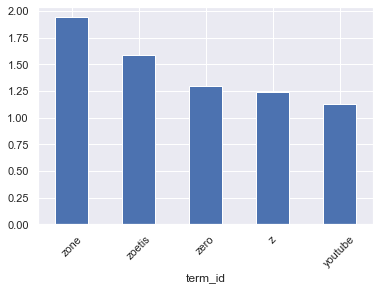

In [308]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

In [309]:
TOPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
TOPS.index.name = 'comp_id'
TOPS.index = ["PC{}".format(i) for i in TOPS.index.tolist()] # prefix with PC

In [310]:
LOADINGS = TOPS[TERM_IDX].T
LOADINGS.index.name = 'term_str'

In [311]:
LOADINGS = LOADINGS.join(VOCAB.set_index('term_str'), on = 'term_str')

In [312]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_id,n,pos_tup,num,stop,p_stem,max_pos
term_str,,,,,,,,,,,,,,,,,
aart,-0.004843,-0.007996,0.021532,0.008239,-0.027836,0.002173,0.002134,0.004588,-0.001898,-0.009341,3704,92,"('aart', 'NN')",0,0,aart,NN
aat,-0.009964,0.028827,0.002655,0.004289,0.005077,-0.009392,0.017114,-0.008820,0.003839,0.005464,3708,204,"('aat', 'NN')",0,0,aat,NN
abaxis,-0.004067,0.004241,0.001581,-0.000668,-0.001693,-0.004330,0.001257,-0.003987,0.002890,0.003822,3732,338,"('abaxis', 'NN')",0,0,abaxi,NN
abbott,-0.006506,0.013800,-0.001725,-0.000546,-0.001644,0.006693,0.000059,-0.001638,0.002729,0.000049,3738,128,"('abbott', 'NN')",0,0,abbott,NN
abbvie,-0.010236,0.027076,0.001468,0.002849,0.004274,-0.006120,0.015599,-0.007714,0.003250,0.003475,3745,200,"('abbvie', 'NN')",0,0,abbvi,NN


In [313]:
VOCAB

,term_id,term_str,n,pos_tup,num,stop,p_stem,max_pos
0,0,0,297,"('0', 'CD')",1,0,0,CD
1,1,00,7,"('00', 'CD')",1,0,00,CD
2,2,000,7099,"('000', 'CD')",1,0,000,CD
3,3,00000,6,"('00000', 'CD')",1,0,00000,CD
4,4,00001,3,"('00001', 'CD')",1,0,00001,CD
...,...,...,...,...,...,...,...,...
53139,53139,zÃ¼rich,4,"('zÃ¼rich', 'NN')",0,0,zÃ¼rich,NN
53140,53140,Â½,2,"('Â½', 'NN')",0,0,Â½,NN
53141,53141,Ã,28,"('Ã ', 'NN')",0,0,Ã,NN
53142,53142,Ã©lysÃ©es,1,"('Ã©lysÃ©es', 'NN')",0,0,Ã©lysÃ©,NN


In [314]:
lb0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).index.str.cat(sep=' ')
lb0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).index.str.cat(sep=' ')
lb1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).index.str.cat(sep=' ')
lb1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).index.str.cat(sep=' ')
lb2_pos = LOADINGS.sort_values('PC2', ascending=True).head(10).index.str.cat(sep=' ')
lb2_neg = LOADINGS.sort_values('PC2', ascending=False).head(10).index.str.cat(sep=' ')

In [315]:
print('Books PC0+', lb0_pos)
print('Books PC0-', lb0_neg)
print('Books PC1+', lb1_pos)
print('Books PC1-', lb1_neg)
print('Books PC2+', lb2_pos)
print('Books PC2-', lb2_neg)

Books PC0+ patients clinical patient study disease trial therapy cancer treatment fda
Books PC0- loan loans deposits banking deposit clients card mortgage client nii
Books PC1+ stores industrial store intermodal wireless cloud mobile automotive gas jim
Books PC1- patients clinical patient study disease treatment trial cancer therapy medicare
Books PC2+ intermodal gas stores store energy coal oampm renewables oil industrial
Books PC2- cloud wireless mobile churn nand tower fiber broadband dram video


In [316]:
DCM = TFIDF_red.dot(TOPS[TERM_IDX].T)

In [317]:
DCM

PC0       PC1       PC2       PC3       PC4       PC5  \
quarter ticker                                                               
q1-2018 ADBE   -0.000749 -0.056328  0.127856 -0.014374 -0.051245 -0.045243   
        BK      0.397310  0.085827 -0.002396  0.016729 -0.009370  0.049706   
        CMCSA  -0.000779 -0.126082  0.193894 -0.012224  0.278541  0.095238   
        DD      0.001947 -0.074045 -0.119808  0.032204 -0.019679  0.148421   
        GOOGL  -0.007706 -0.091772  0.205316 -0.040242  0.004412 -0.148931   
...                  ...       ...       ...       ...       ...       ...   
q4-2021 NKE    -0.003396 -0.038770 -0.012512 -0.128280 -0.016635 -0.025500   
        NVDA   -0.022008 -0.083212  0.169108  0.027764 -0.145245 -0.028739   
        ORCL   -0.006769 -0.037956  0.136381  0.014817 -0.114823 -0.051035   
        STZ    -0.005079 -0.043999 -0.029159 -0.086279 -0.026492 -0.012303   
        TJX    -0.014948 -0.119666 -0.185200 -0.383189  0.042112 -0.035545   

                     PC6       PC7       PC8       PC9  
quarter ticker                                          
q1-2018 ADBE   -0.073721 -0.012429  0.063118 -0.053463  
        BK     -0.027101 -0.006393  0.033048  0.093348  
        CMCSA   0.011851  0.034764 -0.023591 -0.194990  
        DD      0.004766  0.010783  0.036979  0.020233  
        GOOGL  -0.082698 -0.015589  0.079129 -0.269192  
...                  ...       ...       ...       ...  
q4-2021 NKE    -0.013070 -0.025931 -0.015358 -0.034386  
        NVDA   -0.013262  0.014953  0.015292 -0.093569  
        ORCL   -0.093224 -0.021338  0.089162 -0.028869  
        STZ     0.001349 -0.030165  0.005581  0.011909  
        TJX     0.072008 -0.028837 -0.054657  0.077778  

[1841 rows x 10 columns]

In [318]:
LIB = pd.read_csv('LIB.csv').drop(columns = ['Unnamed: 0', 'file', 'url', 'quarter'], axis = 1)\
.drop_duplicates().set_index('ticker')

In [319]:
LIB

,co_clean,sector,sub_sector,hq,date_added,founded
ticker,,,,,,
AMT,American Tower,Real Estate,Specialized REITs,"Boston, Massachusetts",11/19/07,1995
RTX,Raytheon Technologies,Industrials,Aerospace & Defense,"Waltham, Massachusetts",NaN,1922
IBM,IBM,Information Technology,IT Consulting & Other Services,"Armonk, New York",3/4/57,1911
AMAT,Applied Materials,Information Technology,Semiconductor Equipment,"Santa Clara, California",3/16/95,1967
TGT,Target Corporation,Consumer Discretionary,General Merchandise Stores,"Minneapolis, Minnesota",12/31/76,1902
...,...,...,...,...,...,...
AAPL,Apple,Information Technology,"Technology Hardware, Storage & Peripherals","Cupertino, California",11/30/82,1977
GOOGL,Alphabet (Class A),Communication Services,Interactive Media & Services,"Mountain View, California",4/3/14,1998
AMZN,Amazon,Consumer Discretionary,Internet & Direct Marketing Retail,"Seattle, Washington",11/18/05,1994


In [320]:
LIB.index

Index(['AMT', 'RTX', 'IBM', 'AMAT', 'TGT', 'BLK', 'GS', 'CAT', 'ISRG', 'AMD',
       ...
       'PFE', 'NFLX', 'ABT', 'FB', 'MSFT', 'AAPL', 'GOOGL', 'AMZN', 'TSLA',
       'NVDA'],
      dtype='object', name='ticker', length=196)

In [321]:
DCM = DCM.join(LIB, how='outer')

In [322]:
DCM.index.get_level_values(1)

Index(['ADBE', 'BK', 'CMCSA', 'DD', 'GOOGL', 'INFO', 'MS', 'A', 'AAPL', 'ABBV',
       ...
       'CRM', 'EA', 'FDX', 'GIS', 'MDT', 'NKE', 'NVDA', 'ORCL', 'STZ', 'TJX'],
      dtype='object', name='ticker', length=1841)

In [323]:
DCM

PC0       PC1       PC2       PC3       PC4       PC5  \
quarter ticker                                                               
q1-2018 ADBE   -0.000749 -0.056328  0.127856 -0.014374 -0.051245 -0.045243   
        BK      0.397310  0.085827 -0.002396  0.016729 -0.009370  0.049706   
        CMCSA  -0.000779 -0.126082  0.193894 -0.012224  0.278541  0.095238   
        DD      0.001947 -0.074045 -0.119808  0.032204 -0.019679  0.148421   
        GOOGL  -0.007706 -0.091772  0.205316 -0.040242  0.004412 -0.148931   
...                  ...       ...       ...       ...       ...       ...   
q4-2021 NKE    -0.003396 -0.038770 -0.012512 -0.128280 -0.016635 -0.025500   
        NVDA   -0.022008 -0.083212  0.169108  0.027764 -0.145245 -0.028739   
        ORCL   -0.006769 -0.037956  0.136381  0.014817 -0.114823 -0.051035   
        STZ    -0.005079 -0.043999 -0.029159 -0.086279 -0.026492 -0.012303   
        TJX    -0.014948 -0.119666 -0.185200 -0.383189  0.042112 -0.035545   

                     PC6       PC7       PC8       PC9              co_clean  \
quarter ticker                                                                 
q1-2018 ADBE   -0.073721 -0.012429  0.063118 -0.053463                 Adobe   
        BK     -0.027101 -0.006393  0.033048  0.093348            BNY Mellon   
        CMCSA   0.011851  0.034764 -0.023591 -0.194990               Comcast   
        DD      0.004766  0.010783  0.036979  0.020233                DuPont   
        GOOGL  -0.082698 -0.015589  0.079129 -0.269192    Alphabet (Class A)   
...                  ...       ...       ...       ...                   ...   
q4-2021 NKE    -0.013070 -0.025931 -0.015358 -0.034386                  Nike   
        NVDA   -0.013262  0.014953  0.015292 -0.093569                Nvidia   
        ORCL   -0.093224 -0.021338  0.089162 -0.028869                Oracle   
        STZ     0.001349 -0.030165  0.005581  0.011909  Constellation Brands   
        TJX     0.072008 -0.028837 -0.054657  0.077778         TJX Companies   

                                sector                           sub_sector  \
quarter ticker                                                                
q1-2018 ADBE    Information Technology                 Application Software   
        BK                  Financials     Asset Management & Custody Banks   
        CMCSA   Communication Services                    Cable & Satellite   
        DD                   Materials                  Specialty Chemicals   
        GOOGL   Communication Services         Interactive Media & Services   
...                                ...                                  ...   
q4-2021 NKE     Consumer Discretionary  Apparel, Accessories & Luxury Goods   
        NVDA    Information Technology                       Semiconductors   
        ORCL    Information Technology                 Application Software   
        STZ           Consumer Staples                Distillers & Vintners   
        TJX     Consumer Discretionary                       Apparel Retail   

                                        hq date_added founded  
quarter ticker                                                 
q1-2018 ADBE          San Jose, California     5/5/97    1982  
        BK                   New York City    3/31/95    1784  
        CMCSA   Philadelphia, Pennsylvania   11/19/02    1963  
        DD            Wilmington, Delaware     4/2/19    2017  
        GOOGL    Mountain View, California     4/3/14    1998  
...                                    ...        ...     ...  
q4-2021 NKE      Washington County, Oregon   11/30/88    1964  
        NVDA       Santa Clara, California   11/30/01    1993  
        ORCL                 Austin, Texas    8/31/89    1977  
        STZ               Victor, New York     7/1/05    1945  
        TJX      Framingham, Massachusetts    9/30/85    1987  

[1841 rows x 16 columns]

In [325]:
DCM.reset_index(inplace=True) 

In [326]:
def vis_pcs(M, a, b, color = 'quarter', hover = 'ticker', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color= color, 
                        hover_name= hover, marginal_x='box', marginal_y='box', height=800)
    fig.show()

#### PCA Graphs:

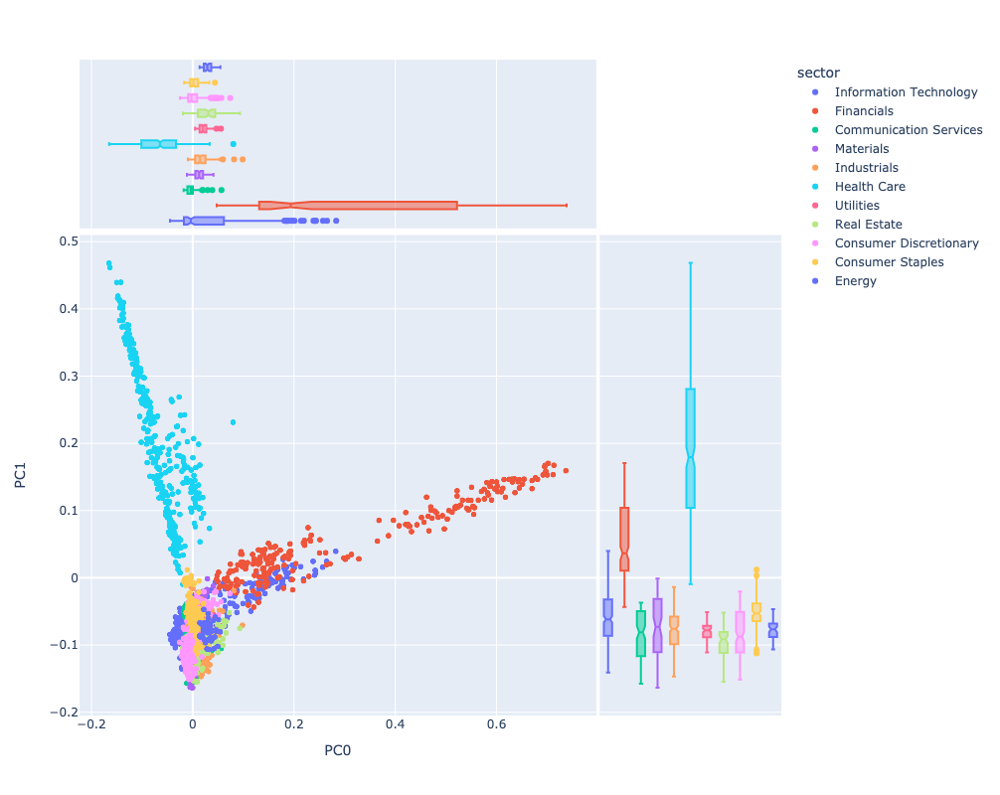

In [327]:
vis_pcs(DCM, 0, 1, color = 'sector')

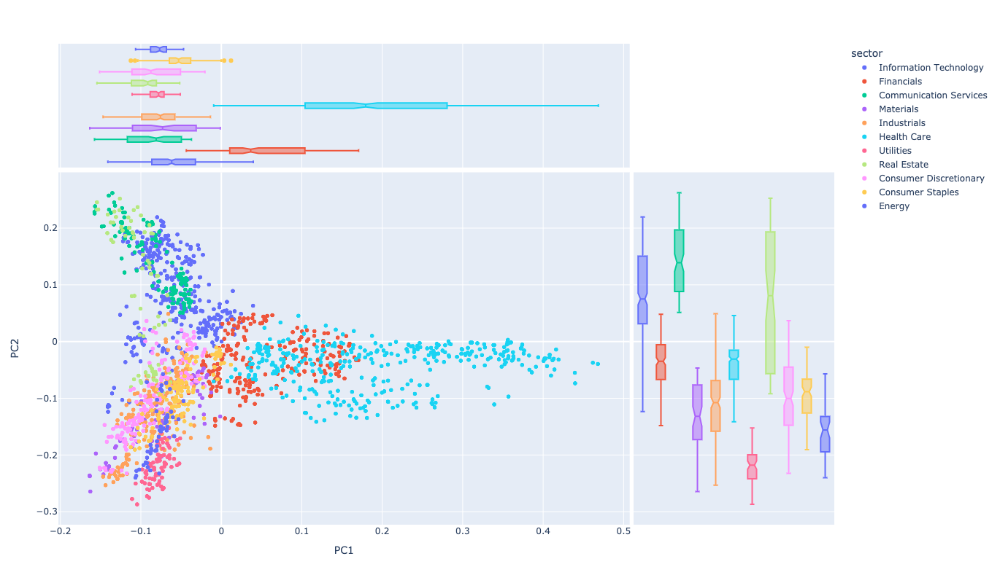

In [328]:
vis_pcs(DCM, 1, 2, color = 'sector')

In [329]:
def vis_loadings(M, a, b, hover = 'term_str', prefix='PC', color = 'max_pos'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b),
                     color = color,
                        hover_name= hover, marginal_x='box', marginal_y='box', height=800)
    fig.show()

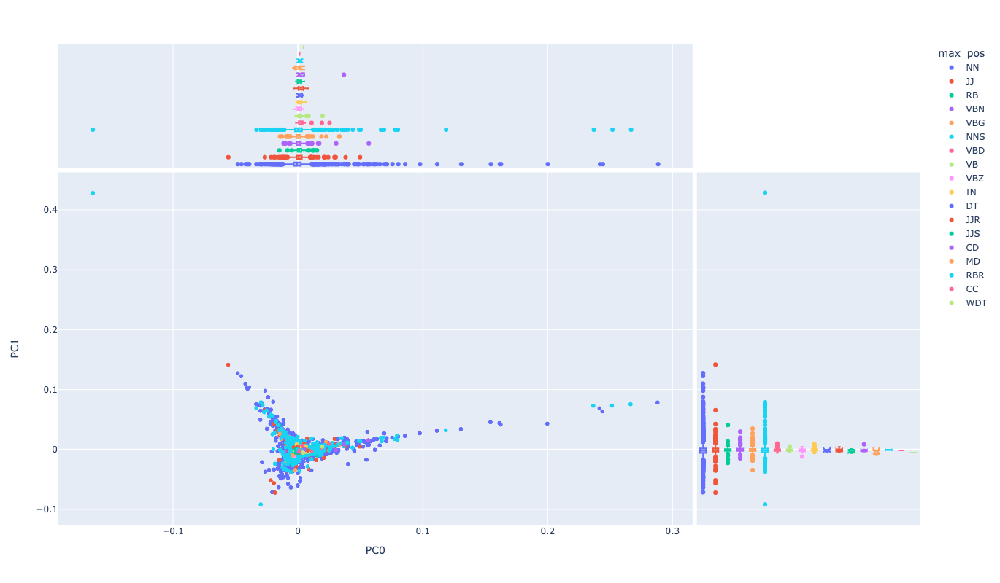

In [330]:
vis_loadings(LOADINGS.reset_index(), 0, 1)

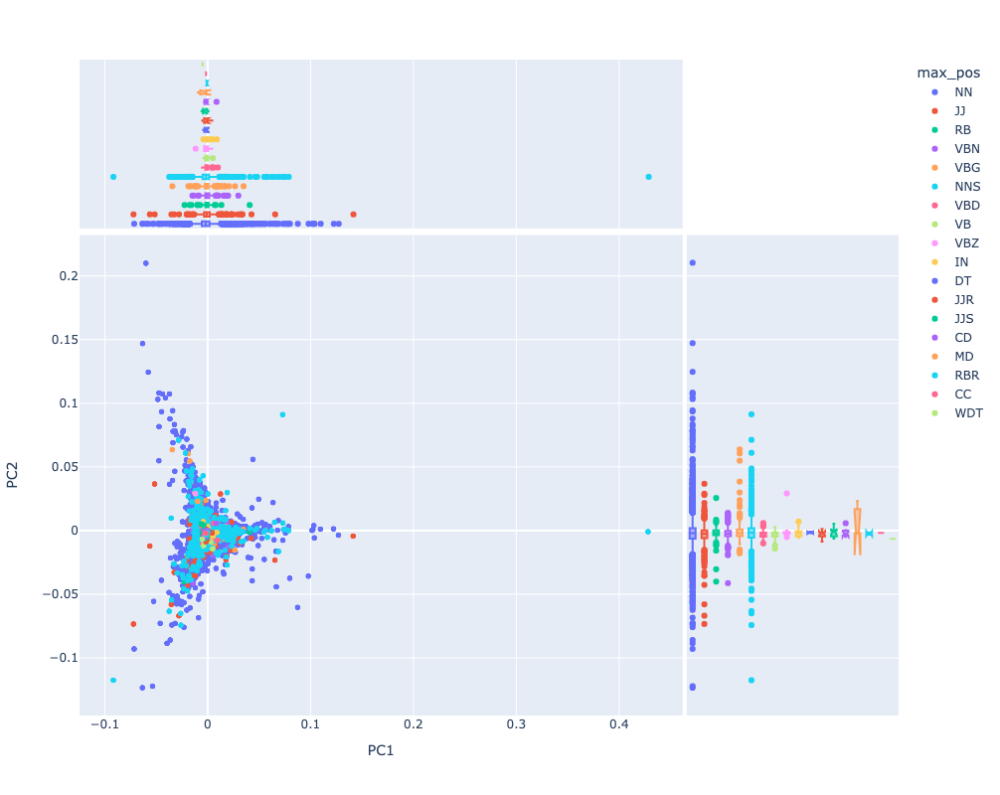

In [331]:
vis_loadings(LOADINGS.reset_index(), 1, 2)

In [332]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

In [333]:
wordcloud2 = WordCloud().generate(' '.join(TOKEN['term_str']))

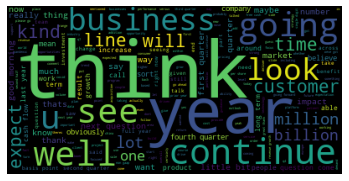

In [334]:
plt.imshow(wordcloud2)
plt.axis("off")
plt.show()

_____
### LDA Topic Modeling

In [335]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [336]:
%matplotlib inline

In [337]:
n_terms = 4000
n_topics = 30
max_iter = 5

**The transition CSV contains a DF with transitions between speakers in each conference call. This is sort of like a paragraph change in a book, so I will be thinking about it this way.**

In [338]:
PARAS = pd.read_csv('transition_call.csv').set_index(OHCO[:3]+['co_count', 'qa'])

**Adding the index including Q&A flag:**

In [339]:
CALLS_qa = pd.read_csv('transition_call.csv').set_index(['ticker', 'quarter', 'qa']).drop(columns = ['speaker', 'co_count'])

In [340]:
CALLS_qa

transcript
ticker quarter qa                                                     
A      q1-2021 pres  Good afternoon and welcome to the Agilent Tech...
               pres  They just revealed what they believe are the t...
       q1-2019 pres  Thank you. And welcome, everyone, to Agilent's...
               pres  You can find the press release, investor prese...
               pres  They just revealed what they believe are the t...
...                                                                ...
ZTS    q2-2019 qa    Hi. Thanks for taking my questions. This is Th...
               qa    Second question is, if you could comment on ot...
       q1-2021 pres  Welcome to the First Quarter 2021 Financial Re...
               pres  It is now my pleasure to turn the floor over t...
               pres  They just revealed what they believe are the t...

[276687 rows x 1 columns]

In [341]:
PARAS.head()

transcript
ticker speaker       quarter co_count qa                                                     
A      Andrew Obin   q1-2021 2        pres  Good afternoon and welcome to the Agilent Tech...
                             3        pres  They just revealed what they believe are the t...
       Ankur Dhingra q1-2019 4        pres  Thank you. And welcome, everyone, to Agilent's...
                             5        pres  You can find the press release, investor prese...
                             6        pres  They just revealed what they believe are the t...

In [342]:
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(PARAS.transcript)
TERMS = tfv.get_feature_names()

In [343]:
lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

**Create Phi and Theta tables.**

In [344]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=PARAS.index)
THETA.columns.name = 'topic_id'

In [345]:
THETA.sample(10).style.background_gradient()

,,,,topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
ticker,speaker,quarter,co_count,qa,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ROP,Neil Hunn,q2-2020,165,qa,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.296123,0.000324,0.000324,0.344122,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.000324,0.242312,0.000324,0.109029,0.000324,0.000324,0.000324,0.000324
MDT,David Lewis,q3-2019,76,qa,0.001449,0.001449,0.001449,0.001449,0.181729,0.001449,0.098165,0.001449,0.001449,0.001449,0.001449,0.493888,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.001449,0.188537,0.001449
CHTR,Thomas M. Rutledge,q1-2020,15,pres,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.276197,0.000176,0.060337,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.000176,0.163277,0.000176,0.495604,0.000176,0.000176,0.000176,0.000176
TWTR,Ned Segal,q1-2021,123,qa,0.000290,0.562853,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.109508,0.000290,0.000290,0.000290,0.319813,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290,0.000290
EW,Scott B. Ullem,q3-2019,35,pres,0.208627,0.000709,0.000709,0.000709,0.000709,0.000709,0.098637,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709,0.497302,0.000709,0.176994,0.000709,0.000709,0.000709,0.000709,0.000709,0.000709
PYPL,Dan Schulman,q1-2019,140,qa,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.003704,0.892593
IDXX,Jon Block,q4-2018,109,qa,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.839013,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.076944,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.001010,0.056771
BIIB,Alfred Sandrock,q3-2019,53,pres,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.067127,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.060432,0.000230,0.000230,0.194754,0.000230,0.000230,0.020856,0.000230,0.049861,0.601453,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230
SBAC,Batya Levi,q3-2019,72,qa,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.137226,0.001333,0.001333,0.825440,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333,0.001333


In [346]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [347]:
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00,178.275065,0.033333,0.033333,0.033333,0.033333,0.033333,0.325185,18.360478,0.036282,0.409775,0.033333,0.121858,2.332798,0.033333,0.033333,11.391410,0.033333,0.033333,0.033337,0.033333,12.869841,7.073807,0.033333,60.810730,0.033333,1.335269,1.636279,28.485067,0.036152,0.033333
000,0.038939,26.020049,7.048408,0.698534,0.499340,12.908294,651.668073,157.185691,22.312881,112.275871,27.075890,25.318790,330.159397,10.659179,0.812952,0.033333,7.975744,1.147291,0.777610,0.134347,2.718398,30.931850,24.899615,559.181185,0.515851,5087.740971,1.377465,2.137726,4.687015,0.059310
01,0.033333,0.033333,0.465936,0.033333,0.033333,0.033333,0.033333,16.247922,0.033333,0.058720,0.033333,0.035685,7.919690,0.087139,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,22.252673,259.551667,0.033333,99.624544,0.033333,0.039304,0.083385,0.033333,0.033333,0.033333
02,0.033333,0.033333,0.119509,0.033333,0.033333,0.033333,0.033333,16.300904,0.033333,0.033333,0.033333,0.973674,1.233954,0.042101,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,10.111357,374.235596,0.170386,119.883773,0.198441,0.130223,0.198140,3.835274,0.033333,0.033333
03,0.033333,0.033333,0.088683,0.033333,0.033333,0.033333,0.033333,27.205553,0.033333,0.033333,0.061401,2.072222,8.993617,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,18.818768,327.533013,4.265658,94.380151,0.036211,0.033333,0.035774,0.908948,0.033333,0.033333


**Get topics:**

In [348]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [349]:
TOPICS[:5]

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,gaap,non,financial,today,release,measures,earnings,website,available,thank
1,really,new,people,ve,just,sure,team,supply,make,work
2,going,know,ve,don,think,really,right,ll,say,yes
3,thank,great,continue,ve,got,going,business,ll,strategy,cost
4,markets,market,single,category,care,growth,home,digits,double,digit


In [350]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

In [351]:
## Sort Topics by Doc Weight

In [352]:
TOPICS['doc_weight_sum'] = THETA.sum()

<AxesSubplot:ylabel='label'>

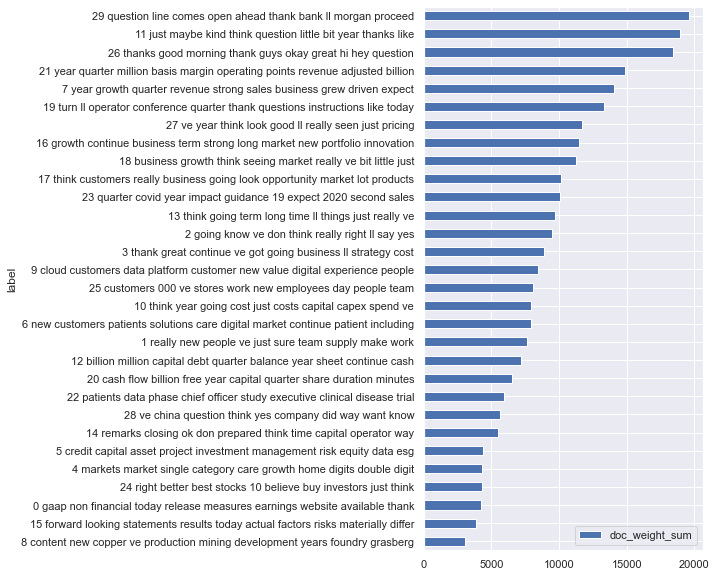

In [353]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

In [354]:
THETA

topic_id                                          0         1         2   \
ticker speaker       quarter co_count qa                                   
A      Andrew Obin   q1-2021 2        pres  0.001010  0.001010  0.001010   
                             3        pres  0.001852  0.001852  0.001852   
       Ankur Dhingra q1-2019 4        pres  0.000855  0.000855  0.000855   
                             5        pres  0.973874  0.000901  0.000901   
                             6        pres  0.001852  0.001852  0.001852   
...                                              ...       ...       ...   
ZTS    Thomas Chiu   q2-2019 157      qa    0.001010  0.001010  0.001010   
                             158      qa    0.000952  0.000952  0.000952   
       Vijay Jayant  q1-2021 2        pres  0.751585  0.000725  0.000725   
                             3        pres  0.004167  0.004167  0.004167   
                             4        pres  0.001961  0.001961  0.001961   

topic_id                                          3         4         5   \
ticker speaker       quarter co_count qa                                   
A      Andrew Obin   q1-2021 2        pres  0.001010  0.001010  0.001010   
                             3        pres  0.001852  0.001852  0.001852   
       Ankur Dhingra q1-2019 4        pres  0.000855  0.041664  0.000855   
                             5        pres  0.000901  0.000901  0.000901   
                             6        pres  0.001852  0.001852  0.001852   
...                                              ...       ...       ...   
ZTS    Thomas Chiu   q2-2019 157      qa    0.001010  0.001010  0.001010   
                             158      qa    0.000952  0.151846  0.000952   
       Vijay Jayant  q1-2021 2        pres  0.000725  0.000725  0.000725   
                             3        pres  0.004167  0.004167  0.004167   
                             4        pres  0.001961  0.001961  0.001961   

topic_id                                          6         7         8   \
ticker speaker       quarter co_count qa                                   
A      Andrew Obin   q1-2021 2        pres  0.001010  0.001010  0.001010   
                             3        pres  0.001852  0.001852  0.001852   
       Ankur Dhingra q1-2019 4        pres  0.000855  0.000855  0.000855   
                             5        pres  0.000901  0.000901  0.000901   
                             6        pres  0.001852  0.001852  0.001852   
...                                              ...       ...       ...   
ZTS    Thomas Chiu   q2-2019 157      qa    0.001010  0.238217  0.001010   
                             158      qa    0.000952  0.000952  0.335442   
       Vijay Jayant  q1-2021 2        pres  0.000725  0.000725  0.000725   
                             3        pres  0.004167  0.004167  0.004167   
                             4        pres  0.001961  0.001961  0.001961   

topic_id                                          9   ...        20        21  \
ticker speaker       quarter co_count qa              ...                       
A      Andrew Obin   q1-2021 2        pres  0.001010  ...  0.001010  0.001010   
                             3        pres  0.001852  ...  0.001852  0.001852   
       Ankur Dhingra q1-2019 4        pres  0.000855  ...  0.000855  0.000855   
                             5        pres  0.000901  ...  0.000901  0.000901   
                             6        pres  0.001852  ...  0.001852  0.001852   
...                                              ...  ...       ...       ...   
ZTS    Thomas Chiu   q2-2019 157      qa    0.001010  ...  0.001010  0.001010   
                             158      qa    0.000952  ...  0.000952  0.000952   
       Vijay Jayant  q1-2021 2        pres  0.000725  ...  0.000725  0.000725   
                             3        pres  0.004167  ...  0.004167  0.004167   
                             4        pres  0.001961  ...  0.

In [355]:
topic_cols = [t for t in range(n_topics)]
QA = THETA.groupby('qa')[topic_cols].mean().T                                            
QA.index.name = 'topic_id'

In [356]:
QA.T

topic_id,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
qa,,,,,,,,,,,,,,,,,,,,,
pres,0.030697,0.016437,0.006065,0.010178,0.014042,0.018658,0.053985,0.106829,0.010201,0.041267,...,0.029188,0.122435,0.029510,0.069518,0.012784,0.047032,0.013685,0.008448,0.012330,0.020498
qa,0.008514,0.032370,0.046671,0.041600,0.016275,0.014557,0.017288,0.026115,0.011239,0.025673,...,0.021204,0.023640,0.017694,0.021943,0.016743,0.021154,0.089758,0.057189,0.023794,0.093182


In [357]:
QA['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

#### See the difference in top terms between presentation and Q&A 

In [358]:
QA.sort_values('pres', ascending=False).style.background_gradient()

qa,pres,qa,topterms
topic_id,,,
21,0.122435,0.023640,year quarter million basis margin operating points revenue adjusted billion
7,0.106829,0.026115,year growth quarter revenue strong sales business grew driven expect
19,0.103344,0.023755,turn ll operator conference quarter thank questions instructions like today
16,0.088368,0.020773,growth continue business term strong long market new portfolio innovation
23,0.069518,0.021943,quarter covid year impact guidance 19 expect 2020 second sales
12,0.054827,0.013133,billion million capital debt quarter balance year sheet continue cash
6,0.053985,0.017288,new customers patients solutions care digital market continue patient including
25,0.047032,0.021154,customers 000 ve stores work new employees day people team
9,0.041267,0.025673,cloud customers data platform customer new value digital experience people


In [359]:
QA.sort_values('qa', ascending=False).style.background_gradient()

qa,pres,qa,topterms
topic_id,,,
11,0.005083,0.096542,just maybe kind think question little bit year thanks like
29,0.020498,0.093182,question line comes open ahead thank bank ll morgan proceed
26,0.013685,0.089758,thanks good morning thank guys okay great hi hey question
27,0.008448,0.057189,ve year think look good ll really seen just pricing
18,0.011902,0.053457,business growth think seeing market really ve bit little just
17,0.008638,0.048910,think customers really business going look opportunity market lot products
2,0.006065,0.046671,going know ve don think really right ll say yes
13,0.009308,0.046392,think going term long time ll things just really ve
3,0.010178,0.041600,thank great continue ve got going business ll strategy cost


In [360]:
import plotly_express as px

#### Visualize company presentation vs. Q&A

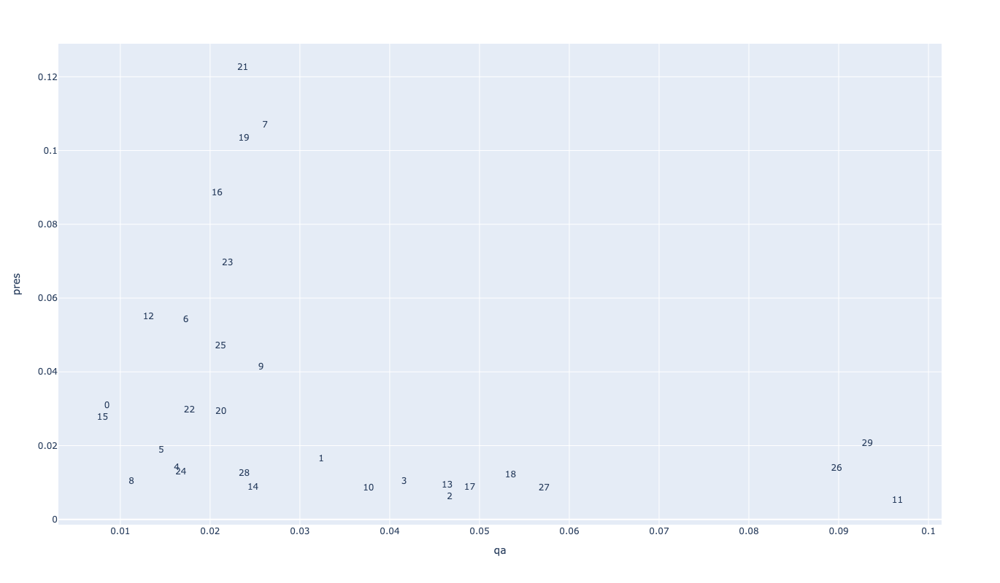

In [361]:
px.scatter(QA.reset_index(), 'qa', 'pres', hover_name='topterms', text='topic_id', height = 800)\
    .update_traces(mode='text')

______
### Sentiment and Emotion Analysis

In [362]:
mcd = pd.read_csv('LoughranMcDonald_MasterDictionary_2020.csv')

In [363]:
mcd.head()

,Word,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source
0,AARDVARK,1,312,1.422050e-08,1.335201e-08,3.700747e-06,96,0,0,0,0,0,0,0,0,2,12of12inf
1,AARDVARKS,2,3,1.367356e-10,8.882163e-12,9.362849e-09,1,0,0,0,0,0,0,0,0,2,12of12inf
2,ABACI,3,9,4.102067e-10,1.200533e-10,5.359747e-08,7,0,0,0,0,0,0,0,0,3,12of12inf
3,ABACK,4,15,6.836779e-10,4.080549e-10,1.406914e-07,14,0,0,0,0,0,0,0,0,2,12of12inf
4,ABACUS,5,8009,3.650384e-07,3.798698e-07,3.523914e-05,1058,0,0,0,0,0,0,0,0,3,12of12inf


In [364]:
mcd['Word'] = mcd['Word'].str.lower()

In [365]:
mcd.head(1)

,Word,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source
0,aardvark,1,312,1.422050e-08,1.335201e-08,0.000004,96,0,0,0,0,0,0,0,0,2,12of12inf


In [366]:
from IPython.core.display import display, HTML
import seaborn as sns

In [367]:
sns.set()

In [368]:
mcd.columns

Index(['Word', 'Seq_num', 'Word Count', 'Word Proportion',
       'Average Proportion', 'Std Dev', 'Doc Count', 'Negative', 'Positive',
       'Uncertainty', 'Litigious', 'Strong_Modal', 'Weak_Modal',
       'Constraining', 'Complexity', 'Syllables', 'Source'],
      dtype='object')

In [369]:
mcd.rename(columns = {'Word':'term_str'}, inplace = True)

In [371]:
mcd.Positive = np.where(mcd.Positive != 0, 1, 0)

In [372]:
mcd.Negative = np.where(mcd.Negative != 0, -1, 0)

In [373]:
m_clean = [i for i in mcd.columns if  i not in ['term_str', 'Seq_num', 'Word Count', 'Word Proportion', 'Average Proportion', 'Std Dev', 'Doc Count', 'Negative', 'Positive', 'Syllables', 'Source']]

In [374]:
m_clean

['Uncertainty',
 'Litigious',
 'Strong_Modal',
 'Weak_Modal',
 'Constraining',
 'Complexity']

In [375]:
mcd[m_clean] = np.where(mcd[m_clean] != 0, 1, 0)

In [376]:
mcd['polarity'] = mcd.Positive - mcd.Negative

In [377]:
mcd

,term_str,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source,polarity
0,aardvark,1,312,1.422050e-08,1.335201e-08,3.700747e-06,96,0,0,0,0,0,0,0,0,2,12of12inf,0
1,aardvarks,2,3,1.367356e-10,8.882163e-12,9.362849e-09,1,0,0,0,0,0,0,0,0,2,12of12inf,0
2,abaci,3,9,4.102067e-10,1.200533e-10,5.359747e-08,7,0,0,0,0,0,0,0,0,3,12of12inf,0
3,aback,4,15,6.836779e-10,4.080549e-10,1.406914e-07,14,0,0,0,0,0,0,0,0,2,12of12inf,0
4,abacus,5,8009,3.650384e-07,3.798698e-07,3.523914e-05,1058,0,0,0,0,0,0,0,0,3,12of12inf,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86526,zygote,86529,48,2.187769e-09,8.817180e-10,1.907714e-07,33,0,0,0,0,0,0,0,0,2,12of12inf,0
86527,zygotes,86530,1,4.557853e-11,1.857263e-11,1.957775e-08,1,0,0,0,0,0,0,0,0,2,12of12inf,0
86528,zygotic,86531,0,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0,0,0,0,3,12of12inf,0
86529,zymurgies,86532,0,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0,0,0,0,3,12of12inf,0


In [378]:
TOKEN.head()

Unnamed: 5  token_str   term_str  \
ticker speaker     quarter qa   co_count                                     
A      Andrew Obin q1-2021 pres 2                  0       Good       good   
                                2                  1  afternoon  afternoon   
                                2                  2        and        and   
                                2                  3    welcome    welcome   
                                2                  4         to         to   

                                                      pos_tup pos  num  stop  \
ticker speaker     quarter qa   co_count                                       
A      Andrew Obin q1-2021 pres 2              ('good', 'JJ')  JJ    0     0   
                                2         ('afternoon', 'NN')  NN    0     0   
                                2               ('and', 'CC')  CC    0     1   
                                2           ('welcome', 'NN')  NN    0     0   
                                2                ('to', 'TO')  TO    0     1   

                                             p_stem max_pos  
ticker speaker     quarter qa   co_count                     
A      Andrew Obin q1-2021 pres 2              good      JJ  
                                2         afternoon      NN  
                                2               and      CC  
                                2            welcom      NN  
                                2                to      TO

In [380]:
TOKEN = TOKEN.reset_index().merge(mcd, on='term_str', how='left').drop(columns = 'Unnamed: 5')

In [381]:
TOKEN.head()

,ticker,speaker,quarter,qa,co_count,token_str,term_str,pos_tup,pos,num,...,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source,polarity
0,A,Andrew Obin,q1-2021,pres,2,Good,good,"('good', 'JJ')",JJ,0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,12of12inf,1.0
1,A,Andrew Obin,q1-2021,pres,2,afternoon,afternoon,"('afternoon', 'NN')",NN,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,12of12inf,0.0
2,A,Andrew Obin,q1-2021,pres,2,and,and,"('and', 'CC')",CC,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,12of12inf,0.0
3,A,Andrew Obin,q1-2021,pres,2,welcome,welcome,"('welcome', 'NN')",NN,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,12of12inf,0.0
4,A,Andrew Obin,q1-2021,pres,2,to,to,"('to', 'TO')",TO,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,12of12inf,0.0


In [382]:
TOKEN.set_index(['ticker', 'speaker', 'quarter', 'qa', 'co_count'], inplace = True)

In [383]:
TOKEN.head()

token_str   term_str  \
ticker speaker     quarter qa   co_count                         
A      Andrew Obin q1-2021 pres 2              Good       good   
                                2         afternoon  afternoon   
                                2               and        and   
                                2           welcome    welcome   
                                2                to         to   

                                                      pos_tup pos  num  stop  \
ticker speaker     quarter qa   co_count                                       
A      Andrew Obin q1-2021 pres 2              ('good', 'JJ')  JJ    0     0   
                                2         ('afternoon', 'NN')  NN    0     0   
                                2               ('and', 'CC')  CC    0     1   
                                2           ('welcome', 'NN')  NN    0     0   
                                2                ('to', 'TO')  TO    0     1   

                                             p_stem max_pos  Seq_num  \
ticker speaker     quarter qa   co_count                               
A      Andrew Obin q1-2021 pres 2              good      JJ  32116.0   
                                2         afternoon      NN   1403.0   
                                2               and      CC   2491.0   
                                2            welcom      NN  84675.0   
                                2                to      TO  77811.0   

                                           Word Count  ...  Positive  \
ticker speaker     quarter qa   co_count               ...             
A      Andrew Obin q1-2021 pres 2           3719388.0  ...       1.0   
                                2              5440.0  ...       0.0   
                                2         828265940.0  ...       0.0   
                                2             12367.0  ...       0.0   
                                2         671191739.0  ...       0.0   

                                          Uncertainty  Litigious  \
ticker speaker     quarter qa   co_count                           
A      Andrew Obin q1-2021 pres 2                 0.0        0.0   
                                2                 0.0        0.0   
                                2                 0.0        0.0   
                                2                 0.0        0.0   
                                2                 0.0        0.0   

                                          Strong_Modal  Weak_Modal  \
ticker speaker     quarter qa   co_count                             
A      Andrew Obin q1-2021 pres 2                  0.0         0.0   
                                2                  0.0         0.0   
                                2                  0.0         0.0   
                                2                  0.0         0.0   
                                2                  0.0         0.0   

                                          Constraining  Complexity  Syllables  \
ticker speaker     quarter qa   co_count                                        
A      Andrew Obin q1-2021 pres 2                  0.0         0.0        1.0   
                                2                  0.0         0.0        3.0   
                                2                  0.0         0.0        1.0   
                                2                  0.0         0.0        2.0   
                                2                  0.0         0.0        1.0   

                                             Source  polarity  
ticker speaker     quarter qa   co_count                       
A      Andrew Obin q1-2021 pres 2         12of12inf       1.0  
                                2         12of12inf       0.0  
                                2         12of12inf       0.0  
                                2         12of12inf       0.0  
                                2         12of12inf       0.0  

[5 rows x 25 columns]

In [384]:
TOKEN.columns

Index(['token_str', 'term_str', 'pos_tup', 'pos', 'num', 'stop', 'p_stem',
       'max_pos', 'Seq_num', 'Word Count', 'Word Proportion',
       'Average Proportion', 'Std Dev', 'Doc Count', 'Negative', 'Positive',
       'Uncertainty', 'Litigious', 'Strong_Modal', 'Weak_Modal',
       'Constraining', 'Complexity', 'Syllables', 'Source', 'polarity'],
      dtype='object')

In [385]:
TOKEN[m_clean] = TOKEN[m_clean].fillna(0)

In [386]:
qAns = TOKEN[TOKEN.index.get_level_values('qa')=='qa'].copy() # need a copy or else it'll be a shallow copy and affect the tokens table
pres = TOKEN[TOKEN.index.get_level_values('qa')=='pres'].copy()

<AxesSubplot:>

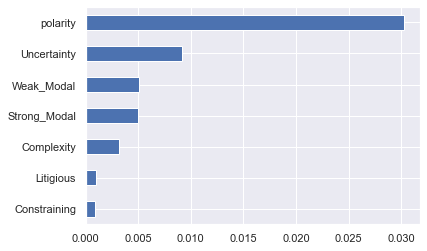

In [387]:
qAns[m_clean + ['polarity']].mean().sort_values().plot.barh()

**Interesting that the polarity is higher in Q&A -- maybe because people are generally congratulatory? Complexity is higher.**

<AxesSubplot:>

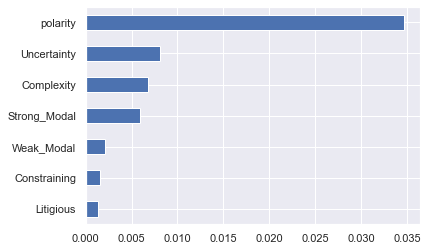

In [388]:
pres[m_clean + ['polarity']].mean().sort_values().plot.barh()

________
### t-SNE

In [389]:
from gensim.models import word2vec

**There is so much data, so break out by *ticker* for now. Add tickers to the *val* list to run more. Can also adjust to run for sectors.**

In [390]:
col = 'ticker'
val = ['AAPL', 'BA', 'F', 'MSFT']
TOKEN_sne = TOKEN.reset_index()

In [391]:
corpus = TOKEN_sne[TOKEN_sne[col].isin(val)]\
    .groupby(OHCO)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [392]:
model = word2vec.Word2Vec(corpus, vector_size=246, window=5, min_count=200, workers=4)

In [393]:
coords = pd.DataFrame(index=range(len(model.wv.key_to_index)))
coords['label'] = model.wv.index_to_key
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

In [394]:
from sklearn.manifold import TSNE
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_vals = tsne_model.fit_transform(coords['vector'].tolist())

In [395]:
coords['x'] = tsne_vals[:,0]
coords['y'] = tsne_vals[:,1]

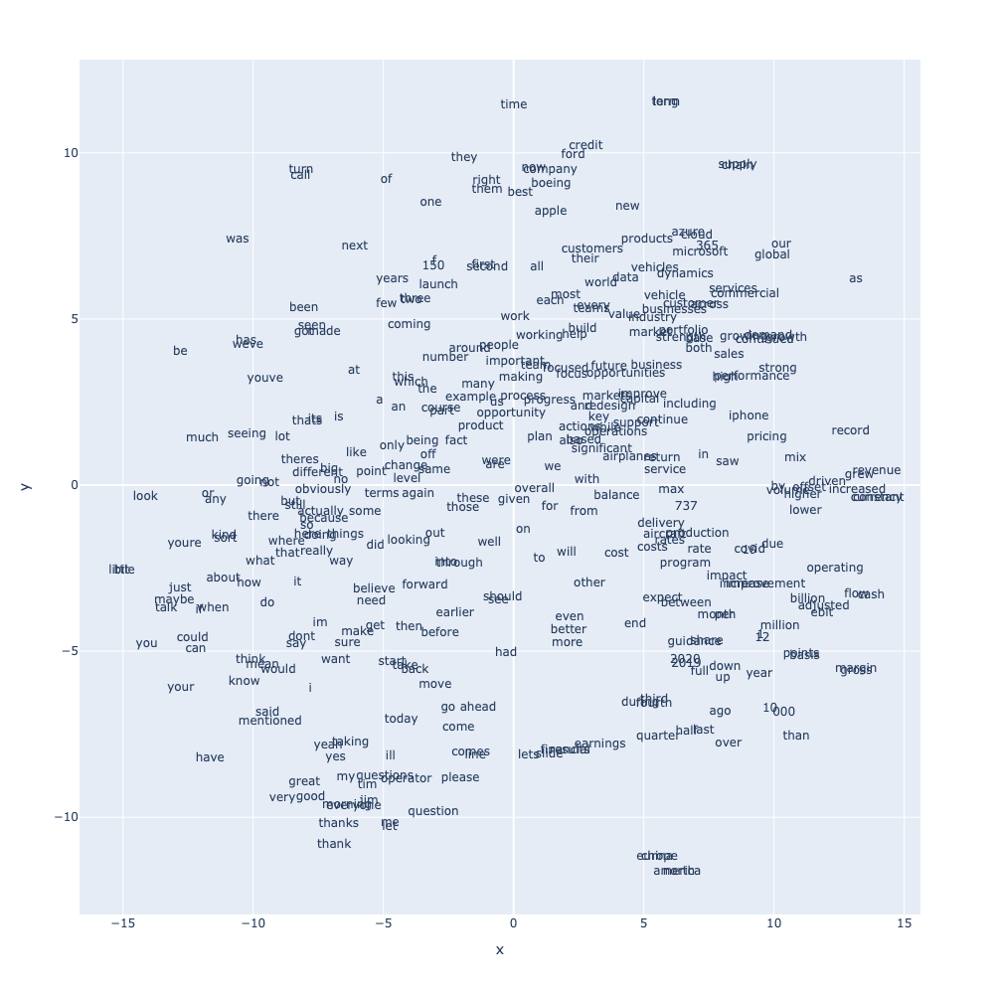

In [396]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

_____
### VADER

**Prelim analysis:**

In [397]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

**Apply polarity scores to each transition in the 'paragraph' data frame.**

In [398]:
PARAS_vader_cols = PARAS.transcript.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
PARAS_vader = pd.concat([PARAS, PARAS_vader_cols], axis=1)

In [399]:
CALLS=pd.read_csv('CALL.csv')

**Apply the same for the data frame with Q&A flag.**

In [400]:
CALLS_vader_cols = CALLS_qa.transcript.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
CALLS_vader = pd.concat([CALLS_qa, CALLS_vader_cols], axis=1)

In [401]:
PARAS_vader

transcript  \
ticker speaker       quarter co_count qa                                                        
A      Andrew Obin   q1-2021 2        pres  Good afternoon and welcome to the Agilent Tech...   
                             3        pres  They just revealed what they believe are the t...   
       Ankur Dhingra q1-2019 4        pres  Thank you. And welcome, everyone, to Agilent's...   
                             5        pres  You can find the press release, investor prese...   
                             6        pres  They just revealed what they believe are the t...   
...                                                                                       ...   
ZTS    Thomas Chiu   q2-2019 157      qa    Hi. Thanks for taking my questions. This is Th...   
                             158      qa    Second question is, if you could comment on ot...   
       Vijay Jayant  q1-2021 2        pres  Welcome to the First Quarter 2021 Financial Re...   
                             3        pres  It is now my pleasure to turn the floor over t...   
                             4        pres  They just revealed what they believe are the t...   

                                            neg    neu    pos  compound  
ticker speaker       quarter co_count qa                                 
A      Andrew Obin   q1-2021 2        pres  0.0  0.826  0.174    0.8689  
                             3        pres  0.0  0.826  0.174    0.8122  
       Ankur Dhingra q1-2019 4        pres  0.0  0.924  0.076    0.6705  
                             5        pres  0.0  1.000  0.000    0.0000  
                             6        pres  0.0  0.826  0.174    0.8122  
...                                         ...    ...    ...       ...  
ZTS    Thomas Chiu   q2-2019 157      qa    0.0  0.803  0.197    0.9528  
                             158      qa    0.0  0.880  0.120    0.8796  
       Vijay Jayant  q1-2021 2        pres  0.0  0.968  0.032    0.4588  
                             3        pres  0.0  0.812  0.188    0.5719  
                             4        pres  0.0  0.821  0.179    0.8122  

[276687 rows x 5 columns]

In [402]:
CALLS_vader

transcript  neg  \
ticker quarter qa                                                             
A      q1-2021 pres  Good afternoon and welcome to the Agilent Tech...  0.0   
               pres  They just revealed what they believe are the t...  0.0   
       q1-2019 pres  Thank you. And welcome, everyone, to Agilent's...  0.0   
               pres  You can find the press release, investor prese...  0.0   
               pres  They just revealed what they believe are the t...  0.0   
...                                                                ...  ...   
ZTS    q2-2019 qa    Hi. Thanks for taking my questions. This is Th...  0.0   
               qa    Second question is, if you could comment on ot...  0.0   
       q1-2021 pres  Welcome to the First Quarter 2021 Financial Re...  0.0   
               pres  It is now my pleasure to turn the floor over t...  0.0   
               pres  They just revealed what they believe are the t...  0.0   

                       neu    pos  compound  
ticker quarter qa                            
A      q1-2021 pres  0.826  0.174    0.8689  
               pres  0.826  0.174    0.8122  
       q1-2019 pres  0.924  0.076    0.6705  
               pres  1.000  0.000    0.0000  
               pres  0.826  0.174    0.8122  
...                    ...    ...       ...  
ZTS    q2-2019 qa    0.803  0.197    0.9528  
               qa    0.880  0.120    0.8796  
       q1-2021 pres  0.968  0.032    0.4588  
               pres  0.812  0.188    0.5719  
               pres  0.821  0.179    0.8122  

[276687 rows x 5 columns]

**Apple sentiment chart for Q1 2021 (just as an example):**

<AxesSubplot:xlabel='ticker,quarter,qa'>

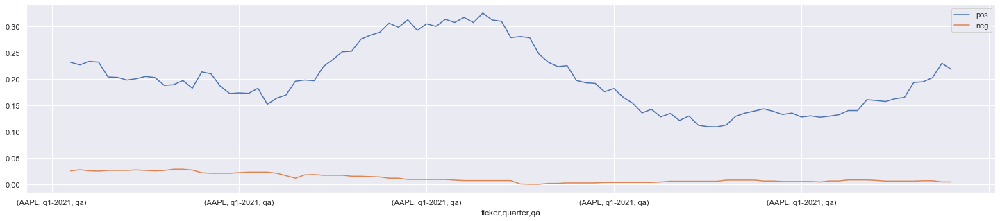

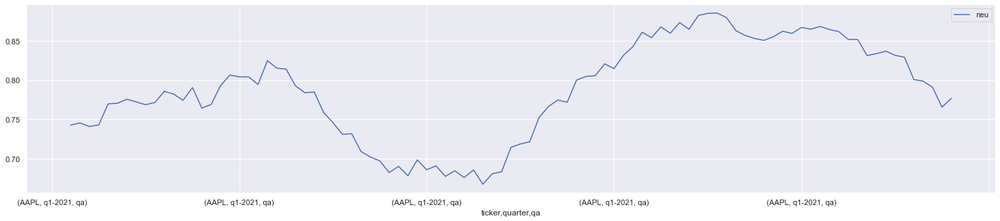

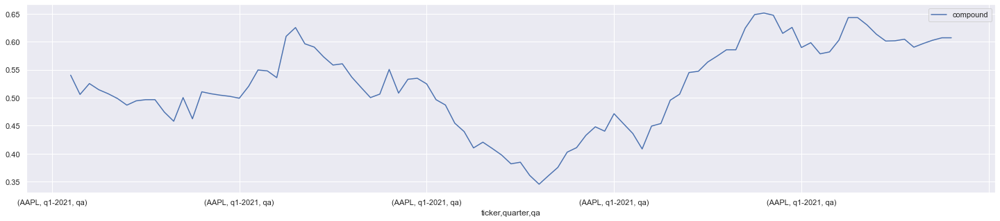

In [403]:
call_test = CALLS_vader.loc['AAPL', 'q1-2021', 'qa'] # Change ticker, quarter, and qa here to see plots for other triplets
w = int(call_test.shape[0] / 5)
call_test[['pos','neg']].rolling(w).mean().plot(figsize=(25,5)) # rolling smooths out the lines
call_test[['neu']].rolling(w).mean().plot(figsize=(25,5))
call_test[['compound']].rolling(w).mean().plot(figsize=(25,5))

____
### Modeling Setup:

In [404]:
df_map = pd.read_csv('price_map.csv') # bring in the price info, which contains the price as of each call

In [405]:
df_transition = PARAS_vader.merge(df_map, on = ['ticker', 'quarter', 'qa'], how = 'left') # merge with the VADER paragraph DF

In [406]:
df_calls = CALLS_vader.merge(df_map, on = ['ticker', 'quarter', 'qa'], how = 'left') # merge with the VADER calls DF

**Sent Analysis run on transition from speaker to speaker. I figure this will be better for more proper sentiment analysis on smaller chunks; then the data are aggregated up to call.**

In [407]:
df_transition.head(3) # transition from speaker to speaker. I figure this will be better for more proper sentiment analysis on smaller chunks

,ticker,quarter,qa,transcript,neg,neu,pos,compound,Unnamed: 0,co_clean,...,date_81,date_82,date_83,date_84,date_85,date_86,date_87,date_88,date_89,date_90
0,A,q1-2021,pres,Good afternoon and welcome to the Agilent Tech...,0.0,0.826,0.174,0.8689,154418,Agilent Technologies,...,2021-05-08,2021-05-09,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17
1,A,q1-2021,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,154418,Agilent Technologies,...,2021-05-08,2021-05-09,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17
2,A,q1-2019,pres,"Thank you. And welcome, everyone, to Agilent's...",0.0,0.924,0.076,0.6705,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
3,A,q1-2019,pres,"You can find the press release, investor prese...",0.0,1.000,0.000,0.0000,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
4,A,q1-2019,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282457,ZTS,q2-2019,qa,Hi. Thanks for taking my questions. This is Th...,0.0,0.803,0.197,0.9528,227192,Zoetis,...,2019-10-26,2019-10-27,2019-10-28,2019-10-29,2019-10-30,2019-10-31,2019-11-01,2019-11-02,2019-11-03,2019-11-04
282458,ZTS,q2-2019,qa,"Second question is, if you could comment on ot...",0.0,0.880,0.120,0.8796,227192,Zoetis,...,2019-10-26,2019-10-27,2019-10-28,2019-10-29,2019-10-30,2019-10-31,2019-11-01,2019-11-02,2019-11-03,2019-11-04
282459,ZTS,q1-2021,pres,Welcome to the First Quarter 2021 Financial Re...,0.0,0.968,0.032,0.4588,228139,Zoetis,...,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04
282460,ZTS,q1-2021,pres,It is now my pleasure to turn the floor over t...,0.0,0.812,0.188,0.5719,228139,Zoetis,...,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04


In [408]:
df_calls.head(3)

,ticker,quarter,qa,transcript,neg,neu,pos,compound,Unnamed: 0,co_clean,...,date_81,date_82,date_83,date_84,date_85,date_86,date_87,date_88,date_89,date_90
0,A,q1-2021,pres,Good afternoon and welcome to the Agilent Tech...,0.0,0.826,0.174,0.8689,154418,Agilent Technologies,...,2021-05-08,2021-05-09,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17
1,A,q1-2021,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,154418,Agilent Technologies,...,2021-05-08,2021-05-09,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17
2,A,q1-2019,pres,"Thank you. And welcome, everyone, to Agilent's...",0.0,0.924,0.076,0.6705,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
3,A,q1-2019,pres,"You can find the press release, investor prese...",0.0,1.000,0.000,0.0000,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
4,A,q1-2019,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,153000,Agilent Technologies,...,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282457,ZTS,q2-2019,qa,Hi. Thanks for taking my questions. This is Th...,0.0,0.803,0.197,0.9528,227192,Zoetis,...,2019-10-26,2019-10-27,2019-10-28,2019-10-29,2019-10-30,2019-10-31,2019-11-01,2019-11-02,2019-11-03,2019-11-04
282458,ZTS,q2-2019,qa,"Second question is, if you could comment on ot...",0.0,0.880,0.120,0.8796,227192,Zoetis,...,2019-10-26,2019-10-27,2019-10-28,2019-10-29,2019-10-30,2019-10-31,2019-11-01,2019-11-02,2019-11-03,2019-11-04
282459,ZTS,q1-2021,pres,Welcome to the First Quarter 2021 Financial Re...,0.0,0.968,0.032,0.4588,228139,Zoetis,...,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04
282460,ZTS,q1-2021,pres,It is now my pleasure to turn the floor over t...,0.0,0.812,0.188,0.5719,228139,Zoetis,...,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04


In [409]:
import nltk

**Create some functions to help with analysis:**

In [410]:
# I want to pull just the POS from the POS tuple:
def get_pos(col):
    return [i[1] for i in col if True]

In [411]:
# count if POS is in POS list; divide by word count; I don't really use this, but normalize later
def pos_count(l, pos = ['JJ', 'JJR', 'JJS']): # default to adjectives
    try:
        return len([i for i in l if i in pos])/len([p for p in l if p not in [',', '.', '?', ':', '-', ';', '!']])
    except:
        return 0

In [412]:
def pos_tot(l, pos = ['JJ', 'JJR', 'JJS']):
    return len([i for i in l if i in pos])

In [413]:
#nltk.help.upenn_tagset()

**Run VADER on each transition prior to aggregating.**

In [414]:
df_transition['tokens'] = df_transition['transcript'].apply(nltk.word_tokenize) # tokenize transcript line into a new column

In [415]:
df_transition['part_os'] = df_transition['tokens'].apply(nltk.pos_tag).apply(get_pos) # apply the POS tagging

In [416]:
df_transition.head()

,ticker,quarter,qa,transcript,neg,neu,pos,compound,Unnamed: 0,co_clean,...,date_83,date_84,date_85,date_86,date_87,date_88,date_89,date_90,tokens,part_os
0,A,q1-2021,pres,Good afternoon and welcome to the Agilent Tech...,0.0,0.826,0.174,0.8689,154418,Agilent Technologies,...,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17,"[Good, afternoon, and, welcome, to, the, Agile...","[JJ, NN, CC, NN, TO, DT, NNP, NNPS, NNP, NNP, ..."
1,A,q1-2021,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,154418,Agilent Technologies,...,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17,"[They, just, revealed, what, they, believe, ar...","[PRP, RB, VBD, WP, PRP, VBP, VBP, DT, JJ, JJS,..."
2,A,q1-2019,pres,"Thank you. And welcome, everyone, to Agilent's...",0.0,0.924,0.076,0.6705,153000,Agilent Technologies,...,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,"[Thank, you, ., And, welcome, ,, everyone, ,, ...","[NNP, PRP, ., CC, JJ, ,, NN, ,, TO, NNP, POS, ..."
3,A,q1-2019,pres,"You can find the press release, investor prese...",0.0,1.000,0.000,0.0000,153000,Agilent Technologies,...,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,"[You, can, find, the, press, release, ,, inves...","[PRP, MD, VB, DT, NN, NN, ,, NN, NN, ,, CC, NN..."
4,A,q1-2019,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,153000,Agilent Technologies,...,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,"[They, just, revealed, what, they, believe, ar...","[PRP, RB, VBD, WP, PRP, VBP, VBP, DT, JJ, JJS,..."


**Add features for modeling based on POS tagging (divided by word count):**
- Adjective count
- Superlative count
- Modal count
- Past-tense verb count
- Present-tense verb count

In [417]:
df_transition['adj_count'] = df_transition['part_os'].apply(pos_tot, args = (['JJ'])) 

In [418]:
df_transition['superlatives_count'] = df_transition['part_os'].apply(pos_tot, args = (['JJS', 'RBS'],))

In [419]:
df_transition['modal_count'] = df_transition['part_os'].apply(pos_tot, args = (['MD']))

In [420]:
df_transition['verb_past_count'] = df_transition['part_os'].apply(pos_tot, args = (['VBD', 'VBN'],))

In [421]:
df_transition['verb_pres_count'] = df_transition['part_os'].apply(pos_tot, args = (['VBZ', 'VBG', 'VBP'],))

In [422]:
df_transition.columns

Index(['ticker', 'quarter', 'qa', 'transcript', 'neg', 'neu', 'pos',
       'compound', 'Unnamed: 0', 'co_clean',
       ...
       'date_88', 'date_89', 'date_90', 'tokens', 'part_os', 'adj_count',
       'superlatives_count', 'modal_count', 'verb_past_count',
       'verb_pres_count'],
      dtype='object', length=200)

**I want to drop the excess *date* columns as they are not necessary. I do this with list comprehension.**

In [423]:
df_transition.drop(columns = [i for i in df_transition.columns if 'date_' in i]).head(5)

,ticker,quarter,qa,transcript,neg,neu,pos,compound,Unnamed: 0,co_clean,...,close_88,close_89,close_90,tokens,part_os,adj_count,superlatives_count,modal_count,verb_past_count,verb_pres_count
0,A,q1-2021,pres,Good afternoon and welcome to the Agilent Tech...,0.0,0.826,0.174,0.8689,154418,Agilent Technologies,...,NaN,NaN,129.939209,"[Good, afternoon, and, welcome, to, the, Agile...","[JJ, NN, CC, NN, TO, DT, NNP, NNPS, NNP, NNP, ...",2,0,2,2,1
1,A,q1-2021,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,154418,Agilent Technologies,...,NaN,NaN,129.939209,"[They, just, revealed, what, they, believe, ar...","[PRP, RB, VBD, WP, PRP, VBP, VBP, DT, JJ, JJS,...",3,1,0,2,5
2,A,q1-2019,pres,"Thank you. And welcome, everyone, to Agilent's...",0.0,0.924,0.076,0.6705,153000,Agilent Technologies,...,67.742966,67.143463,66.799500,"[Thank, you, ., And, welcome, ,, everyone, ,, ...","[NNP, PRP, ., CC, JJ, ,, NN, ,, TO, NNP, POS, ...",4,0,1,0,2
3,A,q1-2019,pres,"You can find the press release, investor prese...",0.0,1.000,0.000,0.0000,153000,Agilent Technologies,...,67.742966,67.143463,66.799500,"[You, can, find, the, press, release, ,, inves...","[PRP, MD, VB, DT, NN, NN, ,, NN, NN, ,, CC, NN...",6,1,3,1,1
4,A,q1-2019,pres,They just revealed what they believe are the t...,0.0,0.826,0.174,0.8122,153000,Agilent Technologies,...,67.742966,67.143463,66.799500,"[They, just, revealed, what, they, believe, ar...","[PRP, RB, VBD, WP, PRP, VBP, VBP, DT, JJ, JJS,...",3,1,0,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282457,ZTS,q2-2019,qa,Hi. Thanks for taking my questions. This is Th...,0.0,0.803,0.197,0.9528,227192,Zoetis,...,NaN,NaN,123.516884,"[Hi, ., Thanks, for, taking, my, questions, .,...","[NNP, ., NNS, IN, VBG, PRP$, NNS, ., DT, VBZ, ...",6,0,2,0,8
282458,ZTS,q2-2019,qa,"Second question is, if you could comment on ot...",0.0,0.880,0.120,0.8796,227192,Zoetis,...,NaN,NaN,123.516884,"[Second, question, is, ,, if, you, could, comm...","[JJ, NN, VBZ, ,, IN, PRP, MD, VB, IN, JJ, JJ, ...",16,0,2,2,4
282459,ZTS,q1-2021,pres,Welcome to the First Quarter 2021 Financial Re...,0.0,0.968,0.032,0.4588,228139,Zoetis,...,NaN,204.100006,204.789993,"[Welcome, to, the, First, Quarter, 2021, Finan...","[VB, TO, DT, JJ, NN, CD, NNP, NNP, NNP, NNP, C...",4,0,3,3,3
282460,ZTS,q1-2021,pres,It is now my pleasure to turn the floor over t...,0.0,0.812,0.188,0.5719,228139,Zoetis,...,NaN,204.100006,204.789993,"[It, is, now, my, pleasure, to, turn, the, flo...","[PRP, VBZ, RB, PRP$, NN, TO, VB, DT, NN, IN, T...",0,0,1,0,1


In [424]:
df_transition.columns

Index(['ticker', 'quarter', 'qa', 'transcript', 'neg', 'neu', 'pos',
       'compound', 'Unnamed: 0', 'co_clean',
       ...
       'date_88', 'date_89', 'date_90', 'tokens', 'part_os', 'adj_count',
       'superlatives_count', 'modal_count', 'verb_past_count',
       'verb_pres_count'],
      dtype='object', length=200)

**Create dictionary for aggregating:**

In [425]:
close_dict = {}
for i in close_list:
    close_dict[i] = 'min'

In [426]:
agg_dict = {'neg':'sum', 'neu':'sum', 'pos':'sum', 'compound':'sum', 'close_0':'min', 'adj_count':'sum', 
            'superlatives_count':'sum', 'modal_count':'sum', 'verb_past_count':'sum', 'verb_pres_count':'sum', 'market_cap':'min'}

In [427]:
agg_dict.update(close_dict)

In [428]:
df_transition.columns

Index(['ticker', 'quarter', 'qa', 'transcript', 'neg', 'neu', 'pos',
       'compound', 'Unnamed: 0', 'co_clean',
       ...
       'date_88', 'date_89', 'date_90', 'tokens', 'part_os', 'adj_count',
       'superlatives_count', 'modal_count', 'verb_past_count',
       'verb_pres_count'],
      dtype='object', length=200)

In [430]:
df_map.columns

Index(['Unnamed: 0', 'ticker', 'qa', 'quarter', 'co_clean', 'date', 'close_0',
       'market_cap', 'close_1', 'close_2',
       ...
       'date_81', 'date_82', 'date_83', 'date_84', 'date_85', 'date_86',
       'date_87', 'date_88', 'date_89', 'date_90'],
      dtype='object', length=188)

In [431]:
# create DF with aggregate data
df_tot = df_transition.groupby(['ticker', 'quarter', 'co_clean']).agg(agg_dict).reset_index()#.drop(columns = 'part_os')

In [432]:
df_t_agg = df_transition.groupby(['ticker', 'quarter'])['transcript'].apply(lambda x: ' '.join(x)).reset_index()

In [433]:
df_full = df_tot.merge(df_t_agg, on = ['ticker', 'quarter']) # merge DFs

In [434]:
df_agg = df_transition.groupby(['ticker', 'quarter', 'qa', 'co_clean']).agg(agg_dict).reset_index()

In [435]:
df_t = df_transition.groupby(['ticker', 'quarter', 'qa'])['transcript'].apply(lambda x: ' '.join(x)).reset_index()

In [436]:
df_call = df_agg.merge(df_t, on = ['ticker', 'quarter', 'qa'])

In [437]:
df_call.head(3)

,ticker,quarter,qa,co_clean,neg,neu,pos,compound,close_0,adj_count,...,close_82,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,transcript
0,A,q1-2019,pres,Agilent Technologies,0.938,34.897,6.166,26.3781,76.392479,266,...,74.701042,66.475182,68.106598,67.919861,NaN,NaN,67.742966,67.143463,66.799500,"Thank you. And welcome, everyone, to Agilent's..."
1,A,q1-2019,qa,Agilent Technologies,1.919,152.969,40.114,101.4719,76.392479,556,...,74.701042,66.475182,68.106598,67.919861,NaN,NaN,67.742966,67.143463,66.799500,"All right. Duration: 69 minutes Yes. Hey, Patr..."
2,A,q1-2020,pres,Agilent Technologies,0.273,16.009,2.717,15.0561,83.869682,252,...,NaN,80.592461,79.184296,79.491722,80.959381,80.909790,NaN,NaN,82.962555,"Thank you, Jillian. Welcome everyone to Agilen..."
3,A,q1-2020,qa,Agilent Technologies,1.547,98.286,25.161,56.9593,83.869682,440,...,NaN,80.592461,79.184296,79.491722,80.959381,80.909790,NaN,NaN,82.962555,"All right. Thanks everyone. With that, we woul..."
4,A,q1-2021,pres,Agilent Technologies,0.385,20.201,4.413,21.4278,127.587898,231,...,NaN,131.696899,131.247482,128.471130,129.849335,130.977844,NaN,NaN,129.939209,Good afternoon and welcome to the Agilent Tech...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3674,ZTS,q4-2018,qa,Zoetis,0.698,50.072,12.235,48.6988,91.927254,506,...,100.086861,100.570671,100.383072,100.995247,NaN,NaN,100.067123,99.968399,100.550926,Great. Thanks very much for the questions. I g...
3675,ZTS,q4-2019,pres,Zoetis,0.475,33.679,5.846,34.6084,143.703262,750,...,130.390289,124.819145,123.379189,124.600670,NaN,NaN,125.514305,123.150795,122.177582,"Thank you, Kristin, and good morning. As Krist..."
3676,ZTS,q4-2019,qa,Zoetis,2.276,81.042,15.682,63.4364,143.703262,1032,...,130.390289,124.819145,123.379189,124.600670,NaN,NaN,125.514305,123.150795,122.177582,"Hi, good morning and thanks for the questions...."
3677,ZTS,q4-2020,pres,Zoetis,0.788,48.364,8.850,49.2729,165.862793,724,...,NaN,170.953690,170.014862,167.827637,170.634094,172.072266,NaN,NaN,170.054825,Welcome to the Fourth Quarter and Full Year 20...


**Get relative ratio of the different POS counts by dividing by word count:**

In [438]:
for i in ['neg',	'neu',	'pos',	'compound', 'adj_count',	'superlatives_count',	'modal_count',	'verb_past_count',	'verb_pres_count']:
    df_call[i] = df_call[i]/len(df_call.transcript.str.split(' '))

In [439]:
for i in ['neg',	'neu',	'pos',	'compound', 'adj_count',	'superlatives_count',	'modal_count',	'verb_past_count',	'verb_pres_count']:
    df_full[i] = df_full[i]/len(df_full.transcript.str.split(' '))

**Add word count column to be used as a feature variable in the models:**

In [441]:
df_call['word_count'] = [len(x.split()) for x in df_call['transcript'].tolist()]

In [442]:
df_full['word_count'] = [len(x.split()) for x in df_full['transcript'].tolist()]

In [443]:
df_qa = df_call[df_call['qa'] == 'qa']

In [444]:
df_qa[['ticker', 'quarter', 'word_count', 'compound']]

,ticker,quarter,word_count,compound
1,A,q1-2019,8365,0.027581
3,A,q1-2020,7041,0.015482
5,A,q1-2021,7458,0.019954
7,A,q2-2019,8162,0.023568
9,A,q2-2020,6334,0.015798
...,...,...,...,...
3670,ZTS,q3-2019,12094,0.017119
3672,ZTS,q3-2020,11324,0.009041
3674,ZTS,q4-2018,9110,0.013237
3676,ZTS,q4-2019,13696,0.017243


In [445]:
df_qa[df_qa['word_count'].isnull()]

,ticker,quarter,qa,co_clean,neg,neu,pos,compound,close_0,adj_count,...,close_83,close_84,close_85,close_86,close_87,close_88,close_89,close_90,transcript,word_count


**Get Q&A word count into the DF**

In [446]:
df_full['qa_wc'] = df_full.merge(df_qa, on = ['ticker', 'quarter'])['word_count_y']

In [447]:
df_full['qa_comp'] = df_full.merge(df_qa, on = ['ticker', 'quarter'])['compound_y']

In [448]:
df_full['qa_pos'] = df_full.merge(df_qa, on = ['ticker', 'quarter'])['pos_y']

In [449]:
df_call.to_csv('model_vars.csv')

In [450]:
df_full.to_csv('model_vars_noQA.csv')

## **Section 6: Modeling**
________

**Purpose:** Use feature variables created in previous files based on text transcripts to predict a stock's price movement.

In [451]:
import sklearn.datasets as datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly_express as px

from sklearn.linear_model import LinearRegression, Lasso, BayesianRidge, ElasticNetCV, RidgeCV, LassoCV, SGDRegressor,  Ridge
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, RepeatedKFold, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge

In [452]:
LIB = pd.read_csv('LIB.csv')

**I use the file that is not split by Q&A for the modeling. I have word count by Q&A as a variable, which I think is important as a feature from the Q&A work, but I am not sure the file is too helpful as each of the prices are duplicated for that file, which may hurt the predictive power of the resulting model.**

In [453]:
df = pd.read_csv('model_vars_noQA.csv').drop(columns = 'Unnamed: 0')

In [454]:
df.dropna(subset=['word_count', 'qa_wc'], inplace = True) # 3 lines have NA values for some reason

In [455]:
df.shape[0]

1838

In [456]:
extras = LIB[['ticker', 'sector', 'sub_sector']].drop_duplicates()

In [457]:
features = ['neg', 'neu', 'pos', 'compound', 'close_0', 'adj_count',
       'superlatives_count', 'modal_count', 'verb_past_count',
       'verb_pres_count', 'sector', 'sub_sector', 'market_cap', 'qa_wc', 'word_count', 'qa_pos']

In [458]:
df = df[~df['close_0'].isnull()]#.any(axis=1)] # drop where the closing price as of the call is null

In [459]:
df.shape[0] # see that we still have plenty of calls

1822

In [460]:
df = df.merge(extras, on = 'ticker') # pull in extra data for graphing

In [461]:
df.sub_sector.isnull().sum()

0

**I one-hot encode the categorical data (i.e. the sectors):**
- I tried including sub-sector, but using that as a feature did not help the models

In [462]:
df_ohe = pd.get_dummies(df[features])#[['qa_pres', 'qa_qa', 'sector', 'sub_sector']]

In [464]:
ohe_feats = [i for i in df_ohe.columns if i.startswith('sector')]

In [465]:
ohe_feats

['sector_Communication Services',
 'sector_Consumer Discretionary',
 'sector_Consumer Staples',
 'sector_Energy',
 'sector_Financials',
 'sector_Health Care',
 'sector_Industrials',
 'sector_Information Technology',
 'sector_Materials',
 'sector_Real Estate',
 'sector_Utilities']

In [466]:
df_ohe = df_ohe[ohe_feats]

In [467]:
df_all = df

In [468]:
df = df.merge(df_ohe, left_index = True, right_index = True).drop(columns = ['sub_sector', 'sector'])

In [469]:
features.remove('sector')

In [470]:
features.remove('sub_sector')

**See quantitative variables:**

In [471]:
features

['neg',
 'neu',
 'pos',
 'compound',
 'close_0',
 'adj_count',
 'superlatives_count',
 'modal_count',
 'verb_past_count',
 'verb_pres_count',
 'market_cap',
 'qa_wc',
 'word_count',
 'qa_pos']

In [472]:
df['start_price'] = df['close_0'] # rename close_0 to start_price

In [473]:
df[['qa_wc', 'word_count', 'qa_comp']].head() # see the total word count and just the Q&A word count

,qa_wc,word_count,qa_comp
0,8365.0,11031,0.027581
1,7041.0,10064,0.015482
2,7458.0,10170,0.019954
3,8162.0,10646,0.023568
4,6334.0,9747,0.015798
...,...,...,...
1817,12094.0,20676,0.017119
1818,11324.0,18388,0.009041
1819,9110.0,17282,0.013237
1820,13696.0,21276,0.017243


**The features are at many different scales, so I want to normalize to avoid potential issues in the modeling:**

In [474]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df[features] = scaler.fit_transform(df[features])

**Add percentage change, which I also want to model. I do this with a loop to calc relative change for each 7-day period from the starting date. The percentage change is now a predictor in addition to the closing price +N weeks.**

In [475]:
p_list = []
for i in range(1, 91):
    s = i
    df['perc_'+str(s)] = df['close_'+str(s)]/df['start_price']-1
    p_list.append('perc_'+str(s))

**Bring back the OHE and quantitative vars (i.e. POS, word counts, sentiment):**

In [476]:
features = features + ohe_feats

**Index the DF to get the model DF (with all variables, both features and predictors):**

In [477]:
df_mod = df[features + close_list + p_list + ['start_price']]

In [478]:
df_mod[df_mod['qa_wc'].isna()] # check for any NAs

,neg,neu,pos,compound,close_0,adj_count,superlatives_count,modal_count,verb_past_count,verb_pres_count,...,perc_82,perc_83,perc_84,perc_85,perc_86,perc_87,perc_88,perc_89,perc_90,start_price


In [479]:
df_mod.head()

,neg,neu,pos,compound,close_0,adj_count,superlatives_count,modal_count,verb_past_count,verb_pres_count,...,perc_82,perc_83,perc_84,perc_85,perc_86,perc_87,perc_88,perc_89,perc_90,start_price
0,0.377345,1.261148,1.305921,0.944483,-0.394777,-0.052383,-0.195670,-0.074228,-0.049089,-0.006603,...,-0.022141,-0.129820,-0.108465,-0.110909,NaN,NaN,-0.113225,-0.121072,-0.125575,76.392479
1,-0.402315,-0.189741,0.063311,-0.395799,-0.368153,-0.307435,-0.405712,-0.377771,-0.100571,-0.158068,...,NaN,-0.039075,-0.055865,-0.052200,-0.034700,-0.035292,NaN,NaN,-0.010816,83.869682
2,-0.497047,0.074105,0.384261,0.152072,-0.212482,-0.311359,-0.195670,-0.325436,0.041995,-0.048333,...,NaN,0.032205,0.028683,0.006923,0.017725,0.026569,NaN,NaN,0.018429,127.587898
3,0.034505,0.760039,1.499112,0.576695,-0.430091,-0.246615,-0.965823,-0.398705,0.228123,0.069130,...,-0.024173,0.002498,0.007091,0.029612,0.017018,NaN,NaN,-0.012764,0.002201,66.475182
4,0.665300,0.173400,0.412757,-0.092176,-0.366722,-0.403569,-0.615753,-0.116096,-0.084731,-0.175069,...,0.151271,0.164714,0.148205,NaN,NaN,0.149856,0.153983,0.155162,0.153040,84.271545


In [480]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df_mod, df_mod, test_size=0.30, random_state=24)

In [481]:
lm = LinearRegression()

**Add the company info to the model-variables DF:**

In [482]:
df_all = df_all[['ticker', 'quarter', 'co_clean', 'sector', 'sub_sector']].merge(df_mod, left_index = True, right_index = True)

In [483]:
features # all feature variables

['neg',
 'neu',
 'pos',
 'compound',
 'close_0',
 'adj_count',
 'superlatives_count',
 'modal_count',
 'verb_past_count',
 'verb_pres_count',
 'market_cap',
 'qa_wc',
 'word_count',
 'qa_pos',
 'sector_Communication Services',
 'sector_Consumer Discretionary',
 'sector_Consumer Staples',
 'sector_Energy',
 'sector_Financials',
 'sector_Health Care',
 'sector_Industrials',
 'sector_Information Technology',
 'sector_Materials',
 'sector_Real Estate',
 'sector_Utilities']

_____
#### Pre-processing is complete. Start modeling:

**Create function to return two dataframes: one containing the test DF with predictions as well as the training DF with predictions. DFs contain other statistics and metrics to help determine model performance. Input metric can be 'close' for the closing price at day N (multiples of 7 days) or 'per' for the percentage change. These  metrics represent the predictor variables. Can also pass the model into the function.**

**Setting `test_train = True` returns one DF with a test/train flag.**

In [ ]:
from sklearn.metrics import r2_score

def model_(days, metric = 'close', model = LinearRegression(), test_train = False):
    
    feats = features.copy()
    met_days = metric +'_'+ str(days)
    df_train = df_all.filter(items = x_train.index, axis = 0)
    df_train = df_train[~df_train[met_days].isnull()]
    df_test = df_all.filter(items = x_test.index, axis = 0)
    df_test = df_test[~df_test[met_days].isnull()]
    if 'perc' in metric:
        feats.remove('close_0')
        preds = df_train[feats]#.drop(columns = 'close_0')#x_train[~x_train[close].isnull()][features]
    else:
        preds = df_train[feats]#x_train[~x_train[close].isnull()][features]
    y = df_train[met_days]
    m = model.fit(preds, y)
    df_test['preds'] = m.predict(x_test[~x_test[met_days].isnull()][feats])
    df_test['perc_diff'] = round((df_test['preds']/df_test['start_price']-1)*100, 3)
    df_test['perc_gain'] = round(100*(df_test['close_'+str(days)]/df_test['start_price']-1), 3)
    
    if metric == 'close':
        df_test['err'] = df_test['preds'] - df_test[met_days]
        df_test['rel_err'] = df_test['perc_diff']/100 - df_test['perc_gain']/100
    else:
        df_test['err'] = df_test['preds'] - df_test['perc_gain']/100
        df_test['rel_err'] = df_test['err']
    df_test['mse'] = np.mean(df_test['err']**2)
    df_test['rel_mse'] = np.mean(df_test['rel_err']**2)
    
    df_train['preds'] = m.predict(df_train[~df_train[met_days].isnull()][feats])
    df_train['perc_diff'] = round((df_train['preds']/df_train['start_price']-1)*100, 3)
    df_train['perc_gain'] = round(100*(df_train['close_'+str(days)]/df_train['start_price']-1), 3)
    
    if metric == 'close':
        df_train['err'] = df_train['preds'] - df_train[met_days]
        df_train['rel_err'] = df_train['perc_diff']/100 - df_train['perc_gain']/100
    else:
        df_train['err'] = df_train['preds'] - df_train['perc_gain']/100
        df_train['rel_err'] = df_train['err']
    df_train['mse'] = np.mean(df_train['err']**2)
    df_train['rel_mse'] = np.mean(df_train['rel_err']**2)
    if test_train:
        df_test['test_train'] = 'test'
        df_train['test_train'] = 'train'
        return df_test.append(df_train), r2_score(x_test[~x_test[met_days].isnull()][met_days], df_test['preds']), r2_score(y, df_train['preds'])
    else:
        return df_test, df_train, r2_score(x_test[~x_test[met_days].isnull()][met_days], df_test['preds']), r2_score(y, df_train['preds'])

**Show MSE for model on test and training data:**

In [585]:
#min(t1t2[t1t2['test_train']== 'train']['rel_mse'])

In [518]:
#min(t1t2[t1t2['test_train']== 'test']['rel_mse'])

In [519]:
l = list(range(1, 91))

In [520]:
d = {}

**Produce CV models:**

In [521]:
grid = dict()
grid['alpha'] = np.arange(0, 5, 1)
# define search
ridgecv = GridSearchCV(Ridge(), grid, scoring='neg_mean_squared_error', cv=RepeatedKFold(n_splits=20, n_repeats=3, random_state=1), n_jobs=-1)

In [522]:
grid = dict()
grid['alpha'] = np.arange(0, 1, 0.05)
# define search
lassocv = GridSearchCV(Lasso(), grid, scoring='neg_mean_absolute_error', cv=RepeatedKFold(n_splits=20, n_repeats=3, random_state=1), n_jobs=-1)

In [523]:
grid = dict()
#grid['alpha'] = np.arange(0, 10, 1)
#grid['gamma'] = np.arange(0, 10, 1)
grid['degree'] = np.arange(1, 5, 1)
#grid['min_samples_split'] = np.arange(1, 5, 1)
# define search
kridgecv = GridSearchCV(KernelRidge(kernel = 'poly'), grid, scoring='neg_mean_squared_error', cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1), n_jobs=-1)

In [524]:
grid = dict()
grid['alpha'] = np.arange(0, 1, 0.05)
#grid['gamma'] = np.arange(0, 10, 1)
#grid['degree'] = np.arange(1, 5, 1)
#grid['min_samples_split'] = np.arange(1, 5, 1)
# define search
kridgecvlin = GridSearchCV(KernelRidge(kernel = 'linear'), grid, scoring='neg_mean_squared_error', cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1), n_jobs=-1)

**Test function:**

**As an example, return the two DFs with predictors. We can see the error for both test and train, which can help determine if there is overfitting.**

In [588]:
t1t2, r2_test, r2_train = model_(14,metric = 'close', test_train = True, model = lassocv)

In [589]:
r2_test

0.9891383438065666

In [590]:
r2_train

0.9949189800200035

In [534]:
t1t2

,ticker,quarter,co_clean,sector,sub_sector,neg,neu,pos,compound,close_0,...,perc_90,start_price,preds,perc_diff,perc_gain,err,rel_err,mse,rel_mse,test_train
462,COST,q3-2021,Costco,Consumer Staples,Hypermarkets & Super Centers,0.826946,1.242393,0.113550,0.034469,0.677621,...,NaN,377.562225,375.730681,-0.485,0.941,-5.384889,-0.01426,602.477086,0.011989,test
709,FCX,q2-2020,Freeport-McMoRan,Materials,Copper,0.205173,-0.332245,-0.380739,0.104899,-0.619569,...,0.330330,13.262485,17.196975,29.666,9.309,2.699845,0.20357,602.477086,0.011989,test
1571,SRE,q4-2018,Sempra Energy,Utilities,Multi-Utilities,-0.120375,0.236980,0.603247,0.468577,-0.276418,...,NaN,109.632111,112.195793,2.338,4.289,-2.138786,-0.01951,602.477086,0.011989,test
366,CCI,q4-2020,Crown Castle,Real Estate,Specialized REITs,-0.759440,0.091696,-0.124883,0.021169,-0.112245,...,0.181212,155.738266,157.238248,0.963,2.447,-2.311481,-0.01484,602.477086,0.011989,test
547,DHR,q1-2021,Danaher Corporation,Health Care,Health Care Equipment,-1.017322,-0.897663,-0.765973,-0.609713,0.233094,...,0.107144,252.722290,252.900370,0.070,1.609,-3.888723,-0.01539,602.477086,0.011989,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1425,PYPL,q4-2019,PayPal,Information Technology,Data Processing & Outsourced Services,-1.351140,-1.262126,-1.243313,-0.948794,-0.251394,...,-0.004457,116.660004,118.542630,1.614,1.629,-0.017367,-0.00015,442.453720,0.010682,train
343,C,q3-2019,Citigroup,Financials,Diversified Banks,-0.219618,0.569081,0.960324,0.810432,-0.430232,...,0.140501,66.435608,70.462517,6.061,2.626,2.282540,0.03435,442.453720,0.010682,train
192,ANTM,q4-2019,Anthem,Health Care,Managed Health Care,-0.074512,0.890927,0.790631,1.514701,0.286109,...,-0.013528,267.611023,269.136720,0.570,8.461,-21.115935,-0.07891,442.453720,0.010682,train
899,ILMN,q4-2019,Illumina,Health Care,Life Sciences Tools & Services,0.209684,0.046831,-1.003799,-0.620616,0.448798,...,0.001564,313.299988,312.173772,-0.359,-6.390,18.893773,0.06031,442.453720,0.010682,train


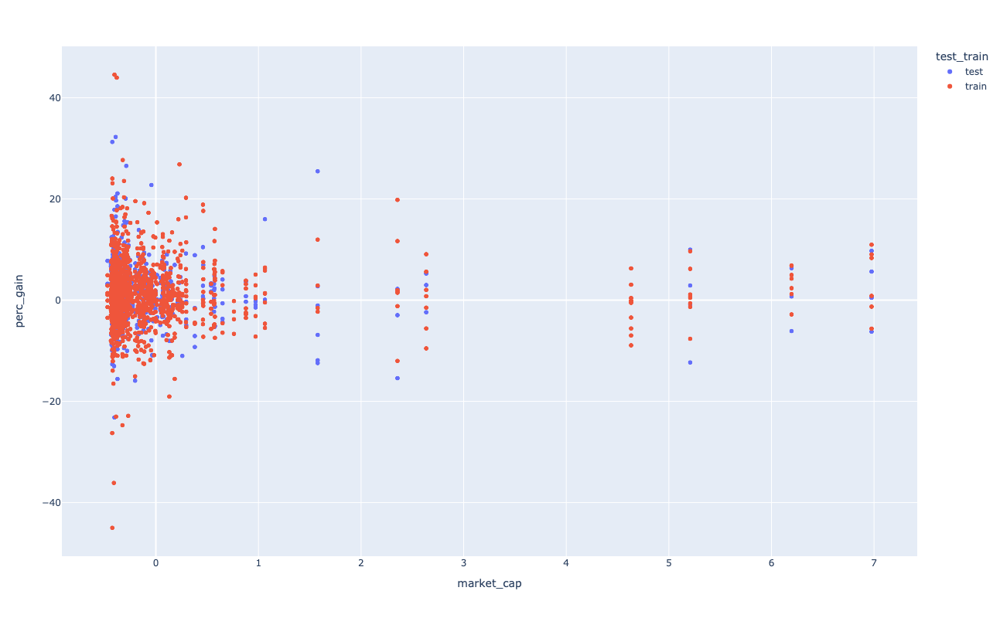

In [535]:
fig = px.scatter(data_frame = t1t2, x = 'market_cap', y = 'perc_gain', color = 'test_train',height=800,
                    hover_name= 'ticker')#, hover_data=["err", "perc_diff", 'quarter'])#, marginal_x='box', marginal_y='box', height=800)
fig.show()

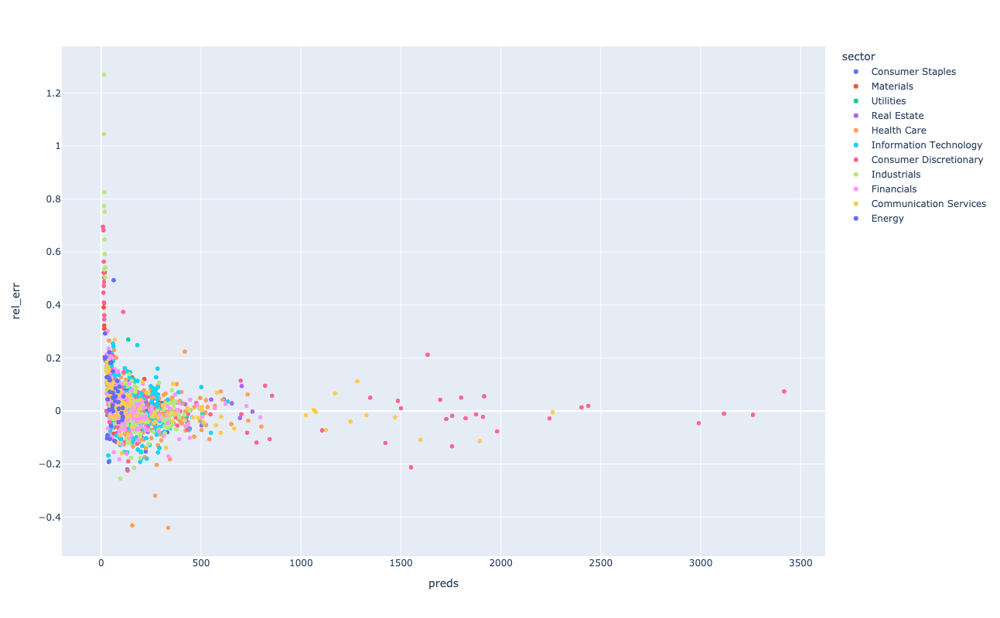

In [536]:
fig = px.scatter(data_frame = t1t2, x = 'preds', y = 'rel_err', color = 'sector',height=800,
                    hover_name= 'ticker')#, hover_data=["err", "perc_diff", 'quarter'])#, marginal_x='box', marginal_y='box', height=800)
fig.show()

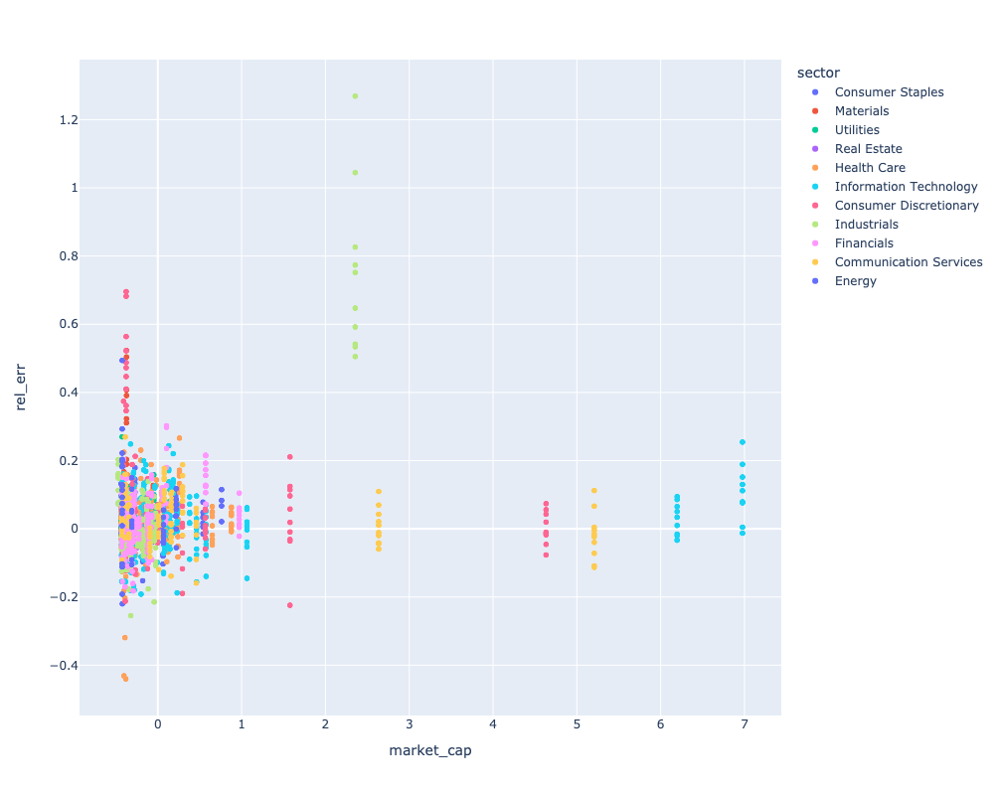

In [537]:
fig = px.scatter(data_frame = t1t2, x = 'market_cap', y = 'rel_err', color = 'sector',height=800,
                    hover_name= 'ticker')#, hover_data=["err", "perc_diff", 'quarter'])#, marginal_x='box', marginal_y='box', height=800)
fig.show()

In [591]:
modlist = {KernelRidge(): 'SKLearn Kernel Ridge', RidgeCV(): 'SKLearn Ridge CV',  
           LinearRegression(): 'SKLearn Lin Reg', kridgecvlin: 'GridSearch Lin Kernel Ridge CV',
           ElasticNetCV(): 'SKLean Elastic Net CV', SVR(): 'SKLearn Support Vect. Reg.', lassocv: 'GridSearch Lasso CV',
           LassoCV(): 'SKLearn Lasso CV', kridgecv: 'GridSearch Poly Kernel Ridge CV'} 

# these are not helpful
# ridgecv: 'GridSearch Ridge CV', lassocv: 'GridSearch Lasso CV', RandomForestRegressor():'RF',GradientBoostingRegressor(): 'GBReg'

_____
**Model Performance Analysis**

In [592]:
output_df = pd.DataFrame()
op_dict = {}
op_dict_train = {}
for i in l:
    for m in modlist:
        for k in ['close']:
            tmp, r2_test, r2_train = model_(days = i, metric = k, model = m, test_train = True)
            tmp['days'] = i
            tmp['predictor'] = k
            tmp['model'] = modlist[m] # removed days from groupby
            tmp['act'] = tmp[k+'_'+str(i)]
            tmp = tmp[['sector', 'test_train', 'market_cap', 'err', 'predictor', 'model', 'rel_err', 'mse', 'preds', 'act', 'days']]\
            output_df = output_df.append(tmp)
            op_dict[(modlist[m], i)] = r2_test
            op_dict_train[(modlist[m], i)] = r2_train

In [593]:
#output_df.to_csv('output_test3.csv')

In [605]:
#output_df 

In [595]:
output_df['key'] = list(zip(output_df.model, output_df.days)) # will merge R2 to this by key

In [596]:
#output_df

,sector,test_train,market_cap,err,predictor,model,rel_err,mse,preds,act,days,key
709,Materials,test,-0.374243,-6.073950,close,SKLearn Kernel Ridge,-0.45797,227.292009,6.989398,13.063348,1,"(SKLearn Kernel Ridge, 1)"
1571,Utilities,test,-0.425398,-6.394989,close,SKLearn Kernel Ridge,-0.05833,227.292009,104.555656,110.950645,1,"(SKLearn Kernel Ridge, 1)"
366,Real Estate,test,-0.292452,-3.296799,close,SKLearn Kernel Ridge,-0.02117,227.292009,153.554351,156.851151,1,"(SKLearn Kernel Ridge, 1)"
547,Health Care,test,0.140137,-5.249050,close,SKLearn Kernel Ridge,-0.02077,227.292009,254.327885,259.576935,1,"(SKLearn Kernel Ridge, 1)"
67,Information Technology,test,-0.265814,-6.673131,close,SKLearn Kernel Ridge,-0.04368,227.292009,149.132335,155.805466,1,"(SKLearn Kernel Ridge, 1)"
...,...,...,...,...,...,...,...,...,...,...,...,...
1425,Information Technology,train,0.462271,10.820938,close,GridSearch Poly Kernel Ridge CV,0.09276,1546.634619,126.960938,116.139999,90,"(GridSearch Poly Kernel Ridge CV, 90)"
343,Financials,train,-0.071971,-0.982561,close,GridSearch Poly Kernel Ridge CV,-0.01479,1546.634619,74.787306,75.769867,90,"(GridSearch Poly Kernel Ridge CV, 90)"
192,Health Care,train,-0.270428,10.256806,close,GridSearch Poly Kernel Ridge CV,0.03833,1546.634619,274.247712,263.990906,90,"(GridSearch Poly Kernel Ridge CV, 90)"
899,Health Care,train,-0.322280,13.029852,close,GridSearch Poly Kernel Ridge CV,0.04159,1546.634619,326.819861,313.790009,90,"(GridSearch Poly Kernel Ridge CV, 90)"


**Lookup R2 values for test and train (these are output from the model functions, which I fed into dictionaries).**

In [597]:
output_df['r2_test'] = output_df['key'].map(op_dict)

In [598]:
output_df['r2_train'] = output_df['key'].map(op_dict_train)

In [599]:
output_df['r2'] = np.where(output_df['test_train'] == 'train', output_df['r2_train'], output_df['r2_test'])

**FULL METRICS TABLE. One row per model per day post call (1-90 days)**

In [600]:
output_df

,sector,test_train,market_cap,err,predictor,model,rel_err,mse,preds,act,days,key,r2_test,r2_train,r2
709,Materials,test,-0.374243,-6.073950,close,SKLearn Kernel Ridge,-0.45797,227.292009,6.989398,13.063348,1,"(SKLearn Kernel Ridge, 1)",0.995554,0.997756,0.995554
1571,Utilities,test,-0.425398,-6.394989,close,SKLearn Kernel Ridge,-0.05833,227.292009,104.555656,110.950645,1,"(SKLearn Kernel Ridge, 1)",0.995554,0.997756,0.995554
366,Real Estate,test,-0.292452,-3.296799,close,SKLearn Kernel Ridge,-0.02117,227.292009,153.554351,156.851151,1,"(SKLearn Kernel Ridge, 1)",0.995554,0.997756,0.995554
547,Health Care,test,0.140137,-5.249050,close,SKLearn Kernel Ridge,-0.02077,227.292009,254.327885,259.576935,1,"(SKLearn Kernel Ridge, 1)",0.995554,0.997756,0.995554
67,Information Technology,test,-0.265814,-6.673131,close,SKLearn Kernel Ridge,-0.04368,227.292009,149.132335,155.805466,1,"(SKLearn Kernel Ridge, 1)",0.995554,0.997756,0.995554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1425,Information Technology,train,0.462271,10.820938,close,GridSearch Poly Kernel Ridge CV,0.09276,1546.634619,126.960938,116.139999,90,"(GridSearch Poly Kernel Ridge CV, 90)",0.978795,0.985218,0.985218
343,Financials,train,-0.071971,-0.982561,close,GridSearch Poly Kernel Ridge CV,-0.01479,1546.634619,74.787306,75.769867,90,"(GridSearch Poly Kernel Ridge CV, 90)",0.978795,0.985218,0.985218
192,Health Care,train,-0.270428,10.256806,close,GridSearch Poly Kernel Ridge CV,0.03833,1546.634619,274.247712,263.990906,90,"(GridSearch Poly Kernel Ridge CV, 90)",0.978795,0.985218,0.985218
899,Health Care,train,-0.322280,13.029852,close,GridSearch Poly Kernel Ridge CV,0.04159,1546.634619,326.819861,313.790009,90,"(GridSearch Poly Kernel Ridge CV, 90)",0.978795,0.985218,0.985218


In [ ]:
output_df.to_csv('model_performance_ALL.csv')

In [601]:
output_grouped = output_df.sort_values(['predictor','sector','test_train','rel_err', 'r2'],ascending=True)\
.groupby(['sector', 'test_train', 'predictor', 'model'])\
.agg({'rel_err': (lambda x: np.mean(x**2)), 'r2':'mean'})

**Top 2 models by sector and test-train split:**

In [603]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(output_grouped.reset_index().sort_values(['predictor','sector','test_train','rel_err', 'r2'],ascending=True).groupby(['sector', 'test_train', 'predictor']).head(2))

,sector,test_train,predictor,model,rel_err,r2
0,Communication Services,test,close,GridSearch Lasso CV,0.008723,0.984421
5,Communication Services,test,close,SKLearn Lasso CV,0.009971,0.984131
9,Communication Services,train,close,GridSearch Lasso CV,0.013634,0.989943
14,Communication Services,train,close,SKLearn Lasso CV,0.014832,0.989908
18,Consumer Discretionary,test,close,GridSearch Lasso CV,0.046081,0.984346
23,Consumer Discretionary,test,close,SKLearn Lasso CV,0.055005,0.984052
27,Consumer Discretionary,train,close,GridSearch Lasso CV,0.029501,0.989826
28,Consumer Discretionary,train,close,GridSearch Lin Kernel Ridge CV,0.031778,0.990056
36,Consumer Staples,test,close,GridSearch Lasso CV,0.004990,0.984314
37,Consumer Staples,test,close,GridSearch Lin Kernel Ridge CV,0.005583,0.983946


**Notice that LassoCV model largely performs the best or second best. Use as champion model.**

In [503]:
display(model_(7, test_train = True).groupby(['sector', 'test_train'])['ticker'].count())

sector                  test_train
Communication Services  test           37
                        train          84
Consumer Discretionary  test           52
                        train         114
Consumer Staples        test           35
                        train          85
Energy                  test            7
                        train          37
Financials              test           72
                        train         153
Health Care             test          106
                        train         244
Industrials             test           78
                        train         141
Information Technology  test           92
                        train         239
Materials               test           25
                        train          51
Real Estate             test           17
                        train          61
Utilities               test           23
                        train          54
Name: ticker, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Consumer Staples'),
  Text(1, 0, 'Materials'),
  Text(2, 0, 'Utilities'),
  Text(3, 0, 'Real Estate'),
  Text(4, 0, 'Health Care'),
  Text(5, 0, 'Information Technology'),
  Text(6, 0, 'Consumer Discretionary'),
  Text(7, 0, 'Industrials'),
  Text(8, 0, 'Financials'),
  Text(9, 0, 'Communication Services'),
  Text(10, 0, 'Energy')])

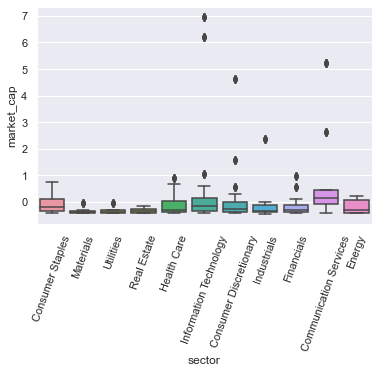

In [504]:
import seaborn as sns
sns.boxplot(x = 'sector', y = 'market_cap', data = model_(7, test_train = True))
plt.xticks(rotation=70)


_____
### Visualize Results

In [505]:
import plotly.graph_objects as go

def graph_(df, close, color = 'sector', size = None, logs = False, metric = 'close_'):
    fig = px.scatter(data_frame = df, x = 'preds', y = metric+str(close), color = color,height=800,
                        hover_name= 'ticker', hover_data=['start_price', 'err', 'perc_diff', 'quarter', 'perc_gain', 'close_'+str(close)], size = size, opacity = .65,
                    log_x = logs, log_y = logs)#, marginal_x='box', marginal_y='box', height=800)

    fig.update_traces(marker=dict(size=12,
                             line=dict(width=1,
                               color='DarkSlateGrey')),
                 selector=dict(mode='markers'))

    fig3 = go.Figure(data = fig.data + px.line(y = [df[metric+str(close)].min(), df[metric+str(close)].max()], 
                                               x = [df[metric+str(close)].min(), df[metric+str(close)].max()], 
                                              log_x = logs, log_y = logs).data)
    
    fig3.update_layout(
    autosize=False,
    width=1400,
    height=800,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=30,
        pad=4
    ),
    #paper_bgcolor="LightSteelBlue",
    )
    
    if logs:
        fig3.update_layout(xaxis_type = "log", yaxis_type = "log" )
    
    fig3.show()

In [506]:
def graph_2(df, close, color = 'sector', size = None, logs = False, metric = 'close_', x = 'preds', y = 'close_7'):
    print('Days', i)
    fig = px.scatter(data_frame = df, x = x, y = y, color = color,height=1000,
                        hover_name= 'ticker', hover_data=['start_price', 'err', 'perc_diff', 'quarter', 'perc_gain'], size = size, opacity = .65,
                    log_x = logs, log_y = logs)
    
    fig3 = go.Figure(data = fig.data + px.line(y = [df[y].min(), df[y].max()], 
                                               x = [df[y].min(), df[y].max()], 
                                              log_x = logs, log_y = logs).data)

    fig.show()

Days 1


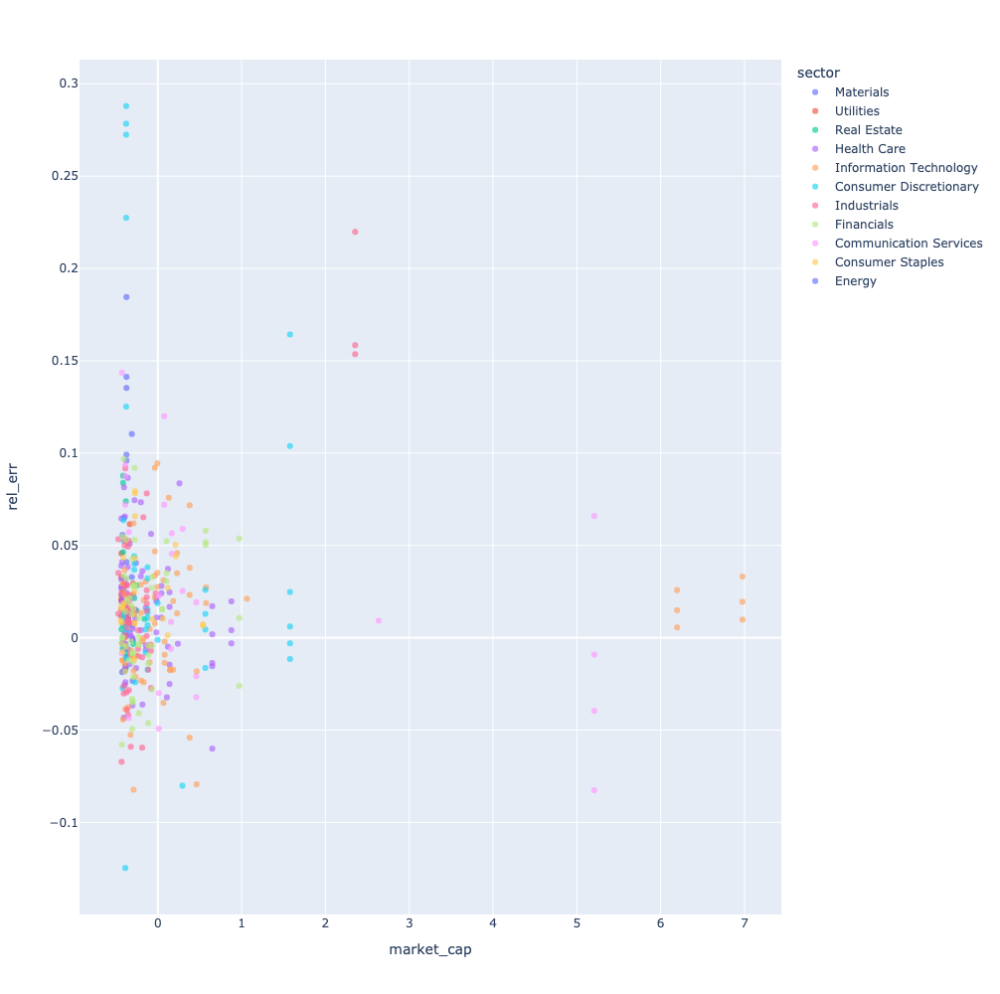

Days 2


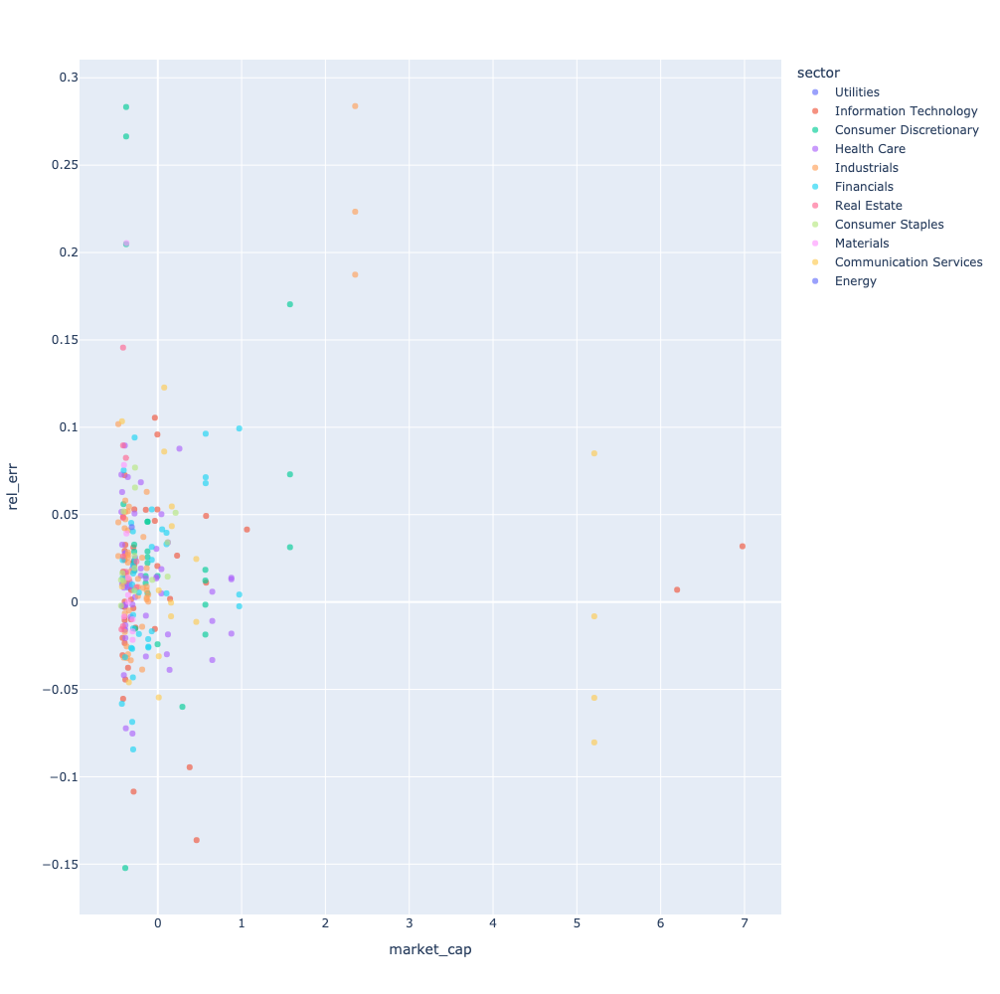

In [507]:
for i in l[:2]:
    graph_2(model_(metric = 'close', days = i, model = lassocv)[0], i, color = 'sector', logs = False, metric = 'close_', x = 'market_cap', y = 'rel_err')

Days 1


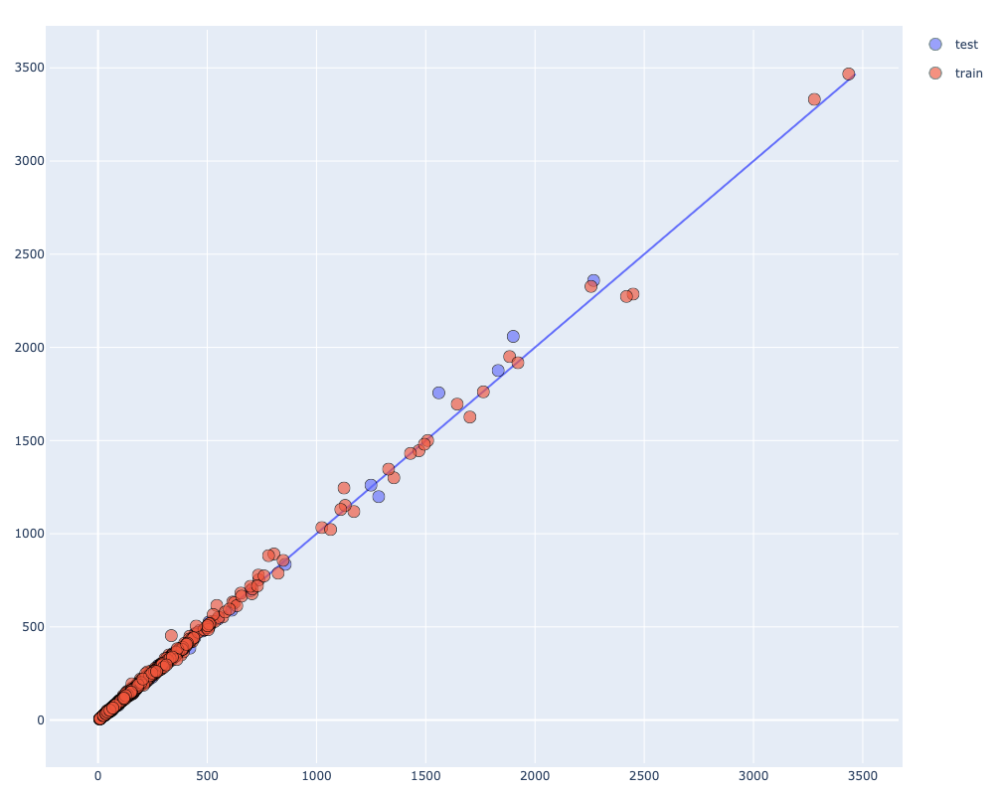

Days 2


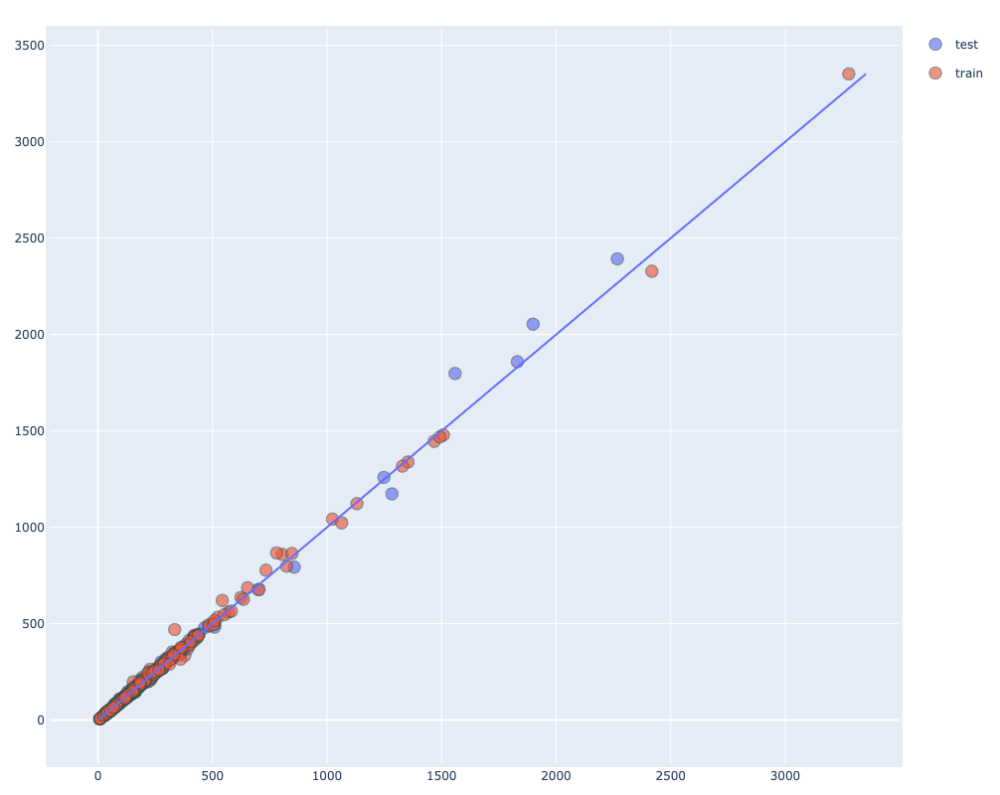

Days 3


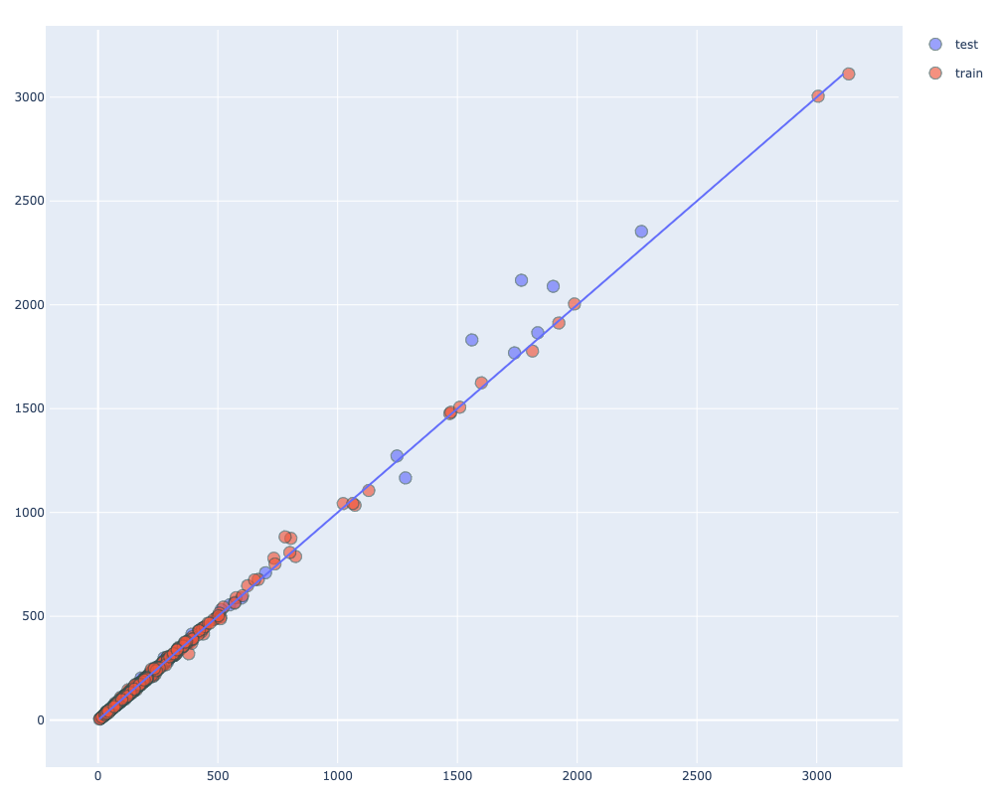

Days 4


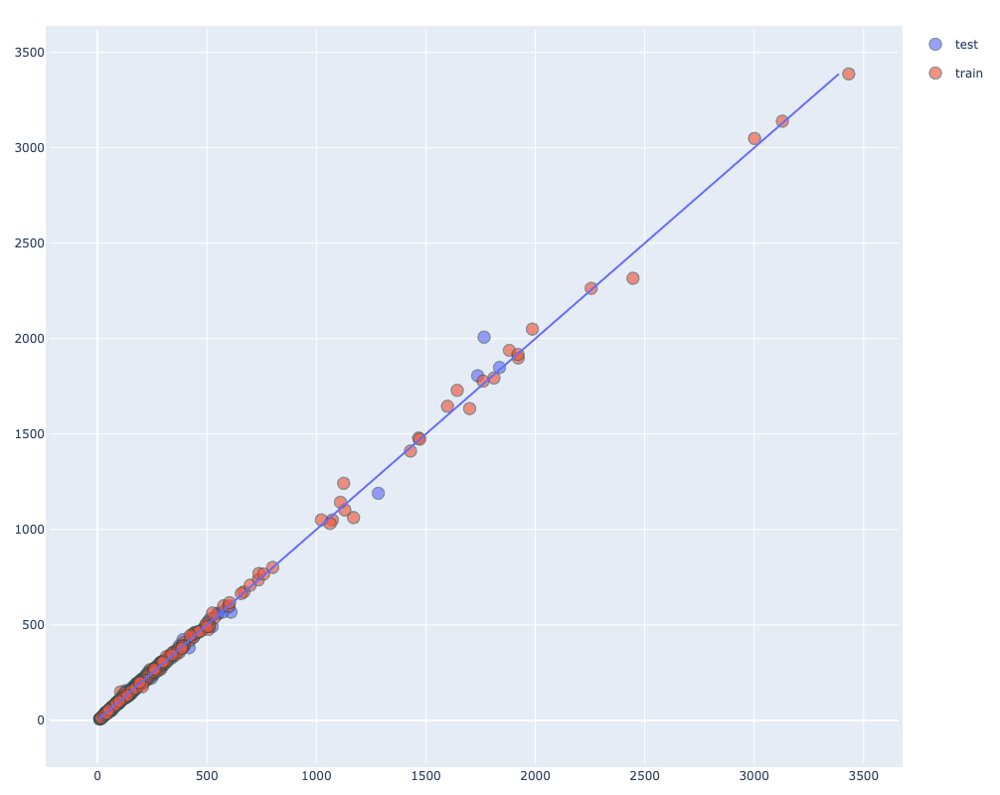

Days 5


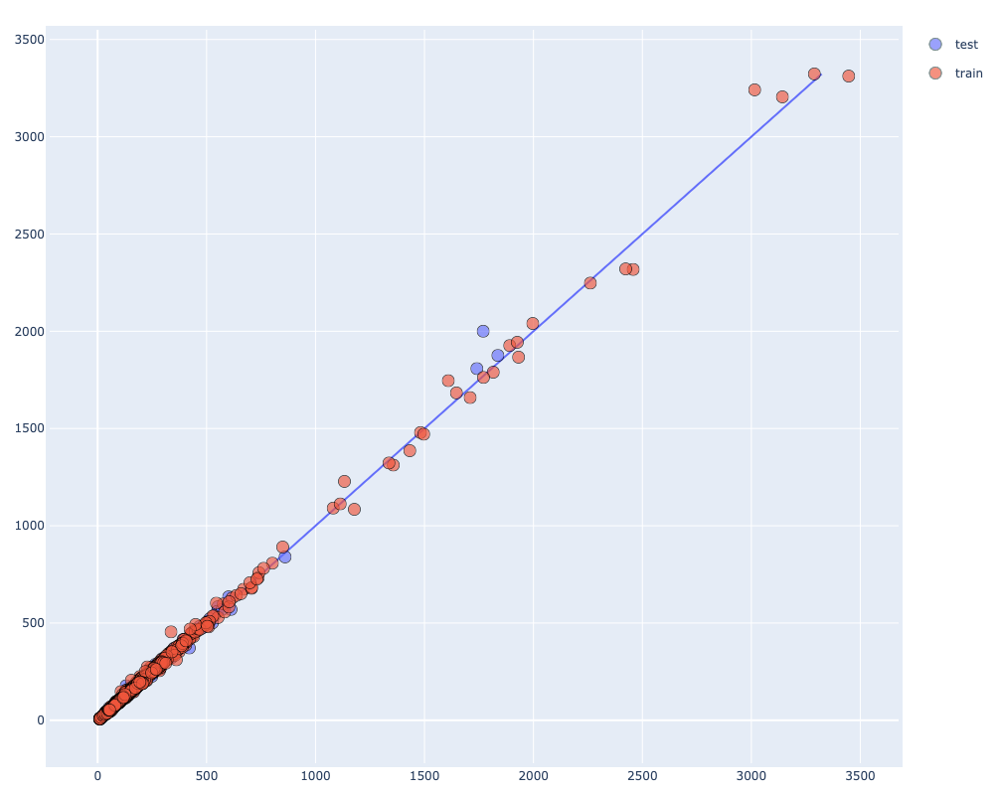

Days 6


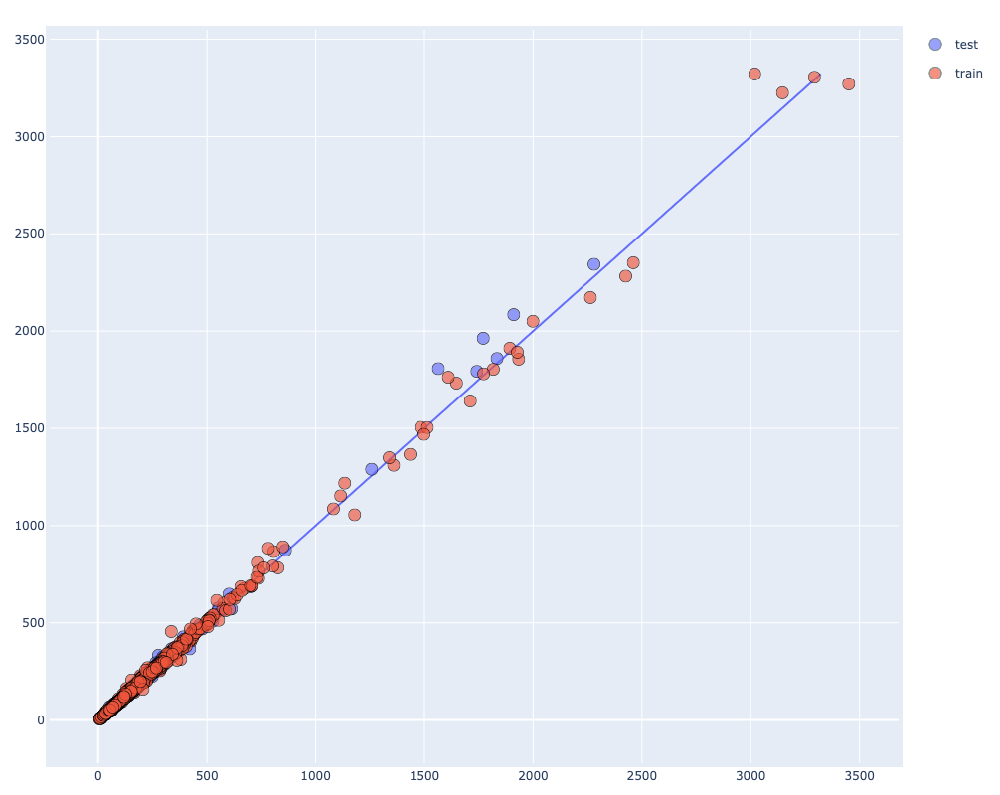

Days 7


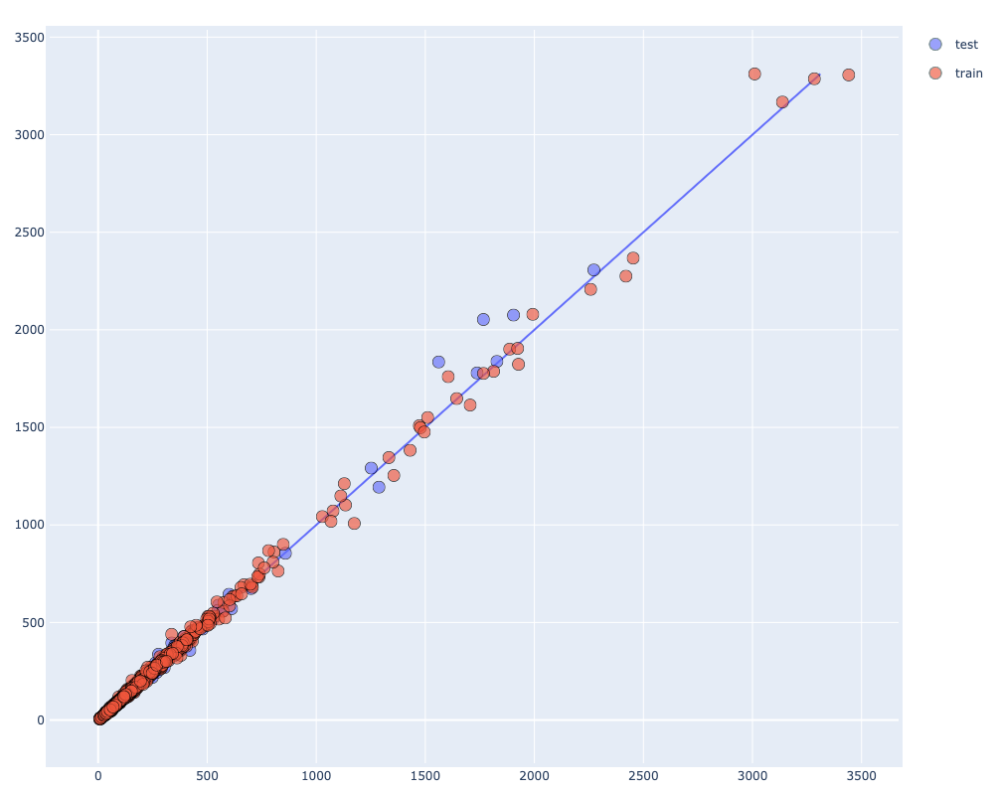

In [508]:
for i in l[:7]:
    print('Days', i)
    graph_(model_(metric = 'close', days = i, model = lassocv, test_train = True), i, color = 'test_train', logs = False, metric = 'close_')#, x = 'perc_diff', y = 'perc_gain')

Days 1


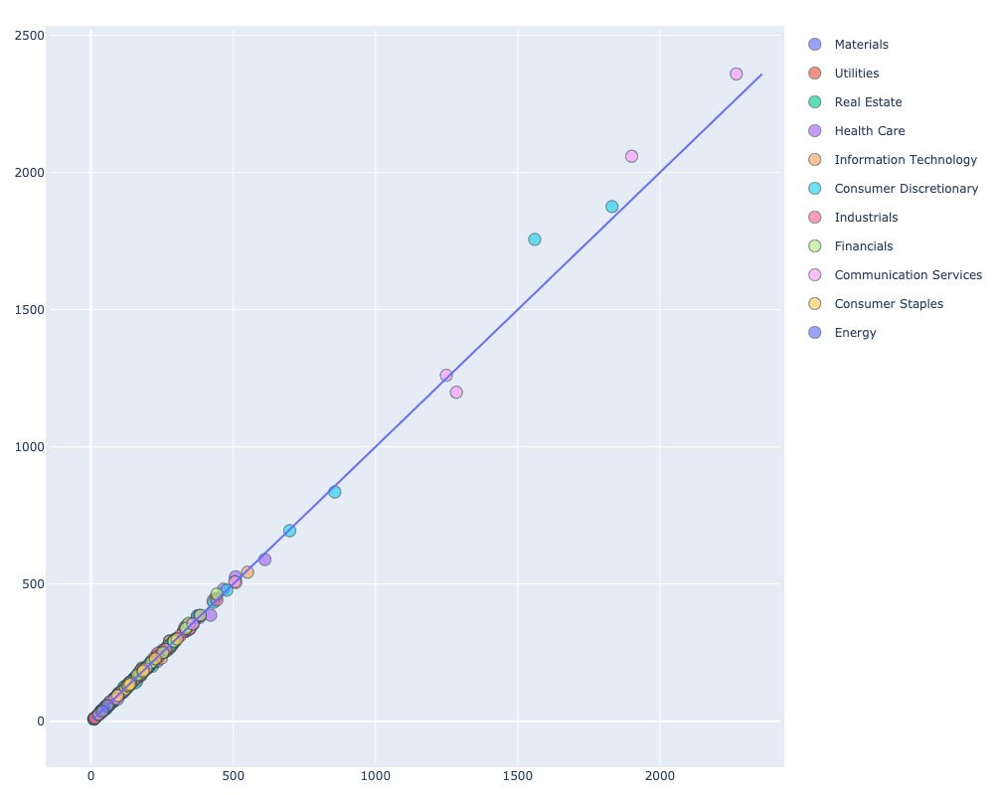

Days 2


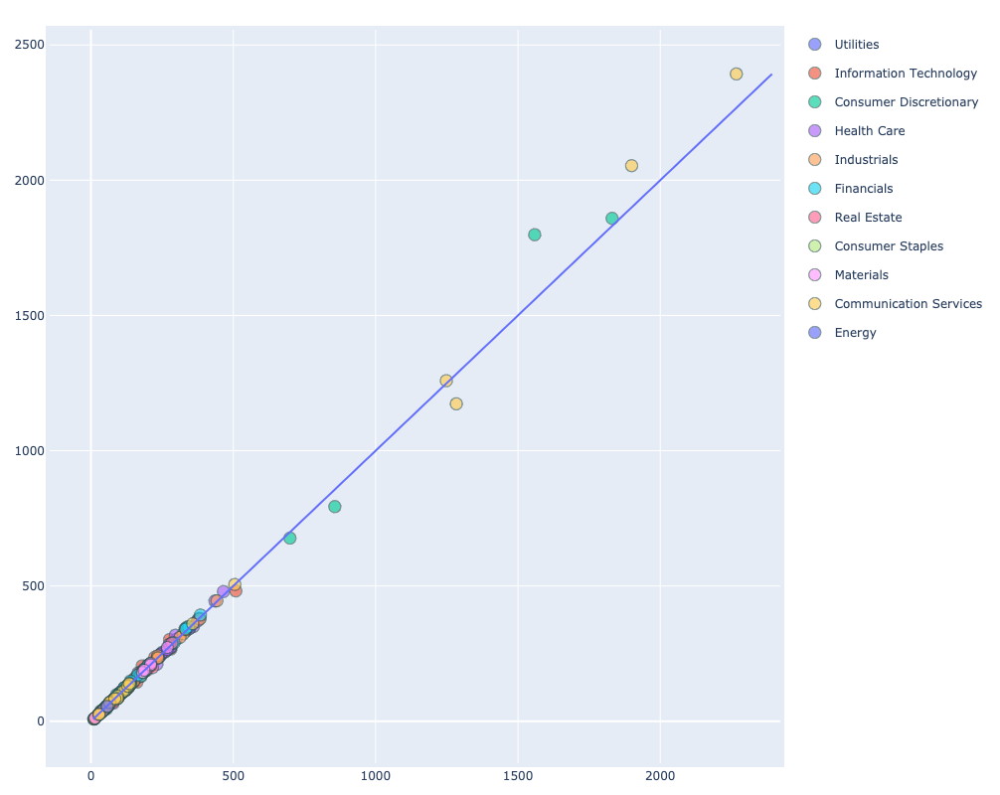

Days 3


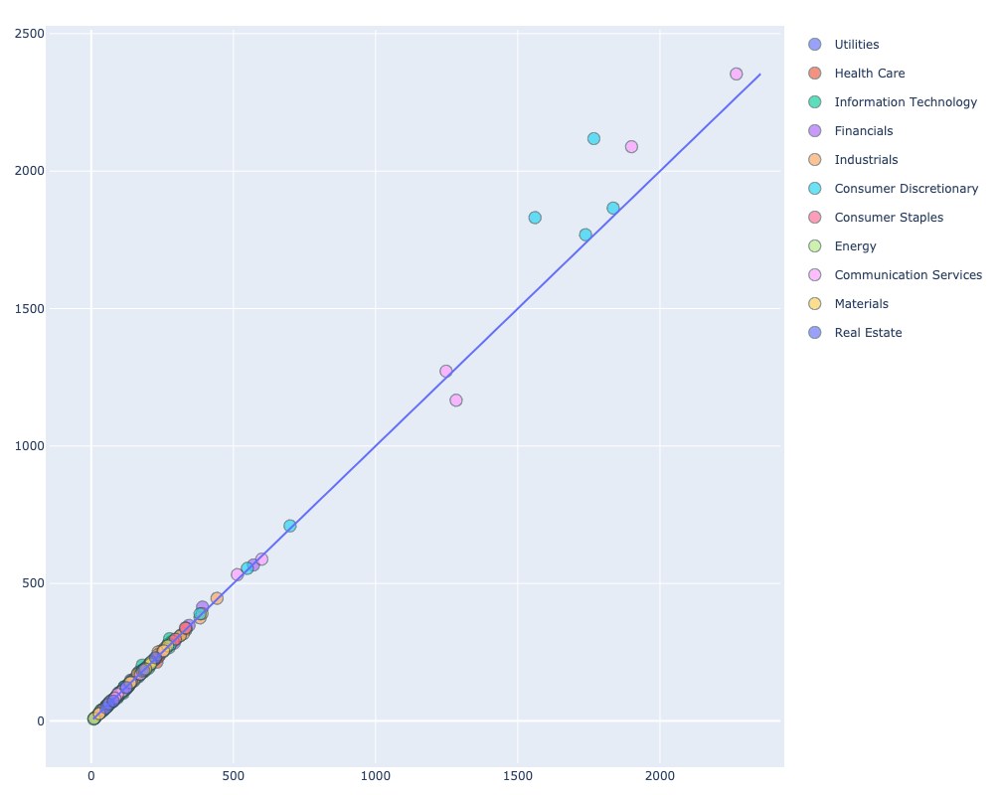

Days 4


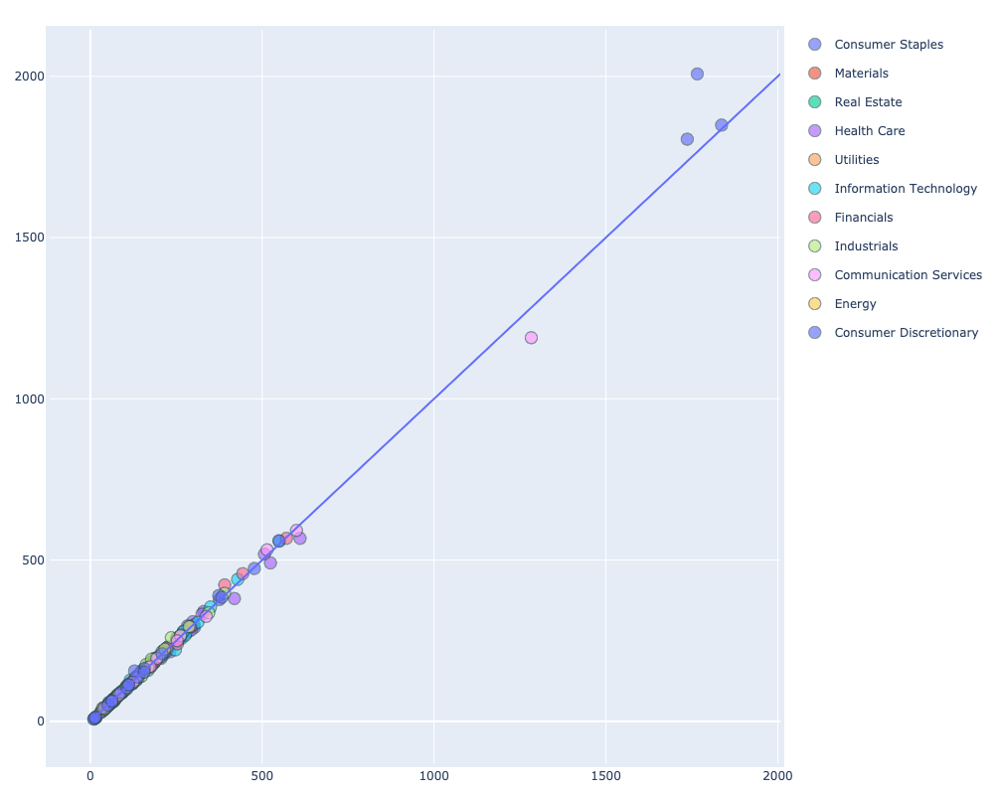

Days 5


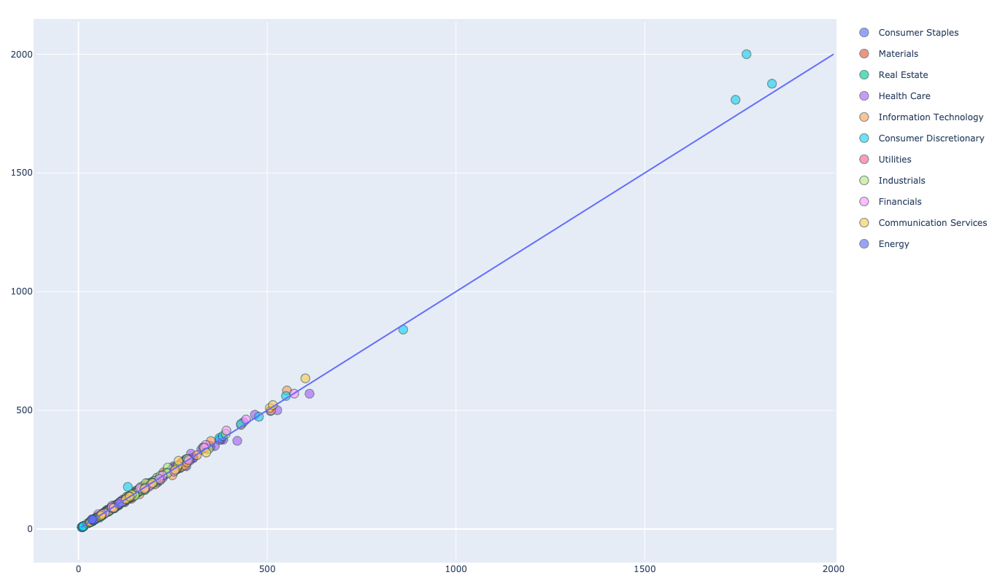

Days 6


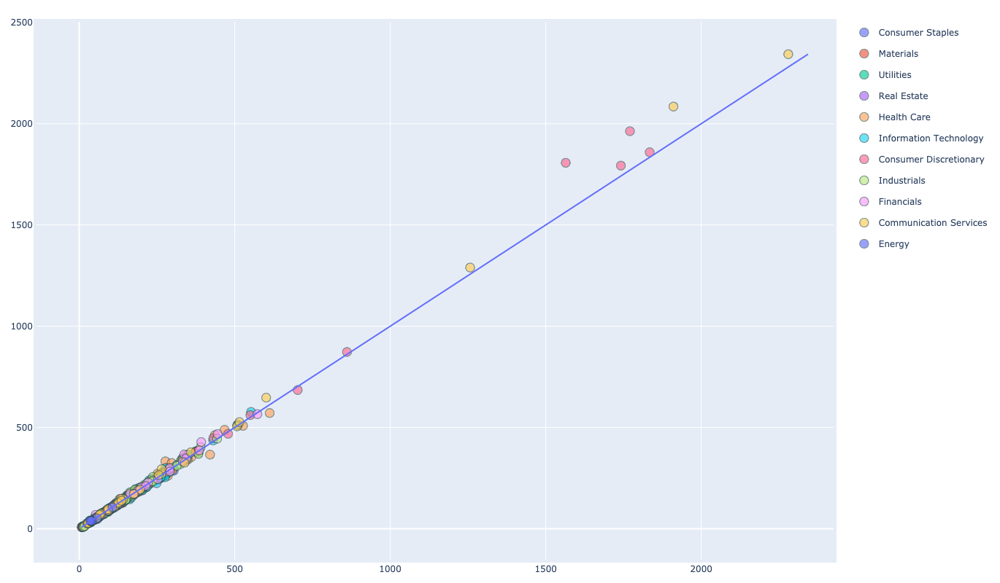

Days 7


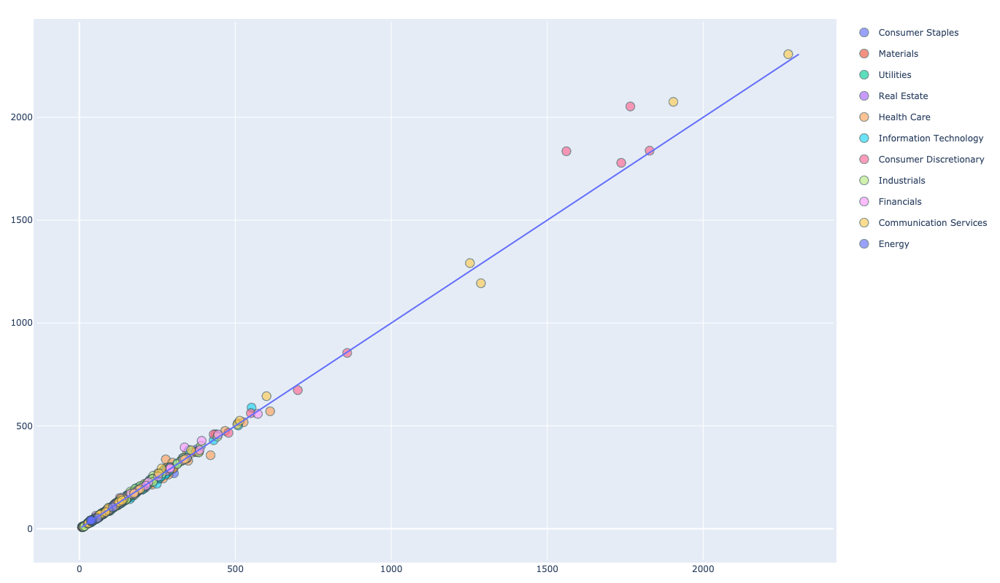

In [509]:
for i in l[:7]:
    print('Days', i)
    graph_(model_(metric = 'close', days = i, model = lassocv)[0], i, color = 'sector', logs = False, metric = 'close_')

In [510]:
#for i in l[:2]:
#    graph_(model_(metric = 'perc', days = i, model = ElasticNetCV())[0], i, color = 'sector', logs = False, metric = 'perc_')#, x = 'perc_diff', y = 'perc_gain')